# Libraries


In [5166]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import datetime
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import nltk
import spacy
from nltk.corpus import stopwords
import re
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer

from sklearn.impute import IterativeImputer
#!pip install spacy
!pip install PyProcessMacro
#!python -m spacy download en_core_web_sm
# Download de benodigde NLTK data
#nltk.download('stopwords')


# 1. Introduction

In this project, our aim is to implement a number of machine learning models to answer  our research question on the AI Tools  dataset.

- Research Question: How do the determinants in the resources based view of the firm influence AI tools sales?

During this theis project we consolidate the knowledge by building a variety of machine learning models independently.

# Prelimenary Data Exploration

A lot of data has been gathered with a lot of features. For the research the features that will be analyzed will be selected.

In [5167]:
# Laden van de dataset
file_path1 = '/Users/macbook/thesis/new/code/data/processed_data/final.csv'
file_path2 = '/Users/macbook/thesis/new/code/data/processed_data/reviews_data.csv'

gen = pd.read_csv(file_path1)
rev = pd.read_csv(file_path2)


/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/ipykernel_29474/1714893796.py:5: DtypeWarning: Columns (13,18,21) have mixed types. Specify dtype option on import or set low_memory=False.
  gen = pd.read_csv(file_path1)


In [5168]:
gen.columns

Index(['tool_id', 'url_format', 'unknown', 'jan', 'feb', 'mar', 'apr', 'may',
       'jun', 'jul', 'aug', 'sep', 'average visits',
       'last month with visitors', 'name', 'task', 'url', 'price', 'saves',
       'likes', 'stars', 'period', 'url_content', 'name_format',
       'organization_name', 'organization_name_url', 'industries',
       'headquarters_location', 'description', 'cb_rank_(company)',
       'headquarters_regions', 'founded_date', 'founded_date_precision',
       'operating_status', 'company_type', 'website', 'linkedin',
       'full_description', 'industry_groups', 'number_of_employees',
       'number_of_founders', 'number_of_funding_rounds', 'last_funding_date',
       'last_funding_amount', 'last_funding_amount_currency',
       'last_funding_amount_currency_(in_usd)', 'total_funding_amount',
       'total_funding_amount_currency',
       'total_funding_amount_currency_(in_usd)', 'number_of_investors',
       'number_of_acquisitions', 'ipo_status', 'ipo_date', 's

In [5169]:
gen.shape

(10569, 69)

In [5170]:
#merge two datasets on tool_id
df_fin = pd.merge(gen, rev, on='tool_id', how='left')

In [5171]:

#with column names
def sparsity_level(gen):
    sparsity = []
    for col in gen.columns:
        miss = gen[col].isnull().sum()
        sparsity.append((miss/len(gen[col]))*100)
    return pd.DataFrame({'column_name':gen.columns,'sparsity':sparsity})

print(sparsity_level(gen))

#save to csv
sparsity_level(gen).to_excel('/Users/macbook/thesis/new/code/data/raw_data/sparsity.xlsx')

                column_name   sparsity
0                   tool_id   0.000000
1                url_format   0.009462
2                   unknown  37.326142
3                       jan  37.326142
4                       feb  37.326142
..                      ...        ...
64                 use case  92.705081
65  type of output modality  93.093008
66      type of data origin  92.761851
67                 freemium  95.959883
68        fuzzy_match_score  92.705081

[69 rows x 2 columns]


In [5172]:
print(df_fin.columns)

Index(['tool_id', 'url_format_x', 'unknown', 'jan', 'feb', 'mar', 'apr', 'may',
       'jun', 'jul', 'aug', 'sep', 'average visits',
       'last month with visitors', 'name', 'task', 'url', 'price', 'saves',
       'likes', 'stars', 'period', 'url_content', 'name_format',
       'organization_name', 'organization_name_url', 'industries',
       'headquarters_location', 'description', 'cb_rank_(company)',
       'headquarters_regions', 'founded_date', 'founded_date_precision',
       'operating_status', 'company_type', 'website', 'linkedin',
       'full_description', 'industry_groups', 'number_of_employees',
       'number_of_founders', 'number_of_funding_rounds', 'last_funding_date',
       'last_funding_amount', 'last_funding_amount_currency',
       'last_funding_amount_currency_(in_usd)', 'total_funding_amount',
       'total_funding_amount_currency',
       'total_funding_amount_currency_(in_usd)', 'number_of_investors',
       'number_of_acquisitions', 'ipo_status', 'ipo_date', 

In [5173]:
print(rev.shape)
print(gen.shape)
print(df_fin.shape)

(50705, 13)
(10569, 69)
(50359, 81)


In [5174]:
df_fin.drop_duplicates(subset=['tool_id'], inplace=True)
print(df_fin.shape)


(10569, 81)


In [5175]:
#drop all that have no average visits
df_fin = df_fin.dropna(subset=['average visits'], how='all')

print(df_fin.isnull().sum())



tool_id                     0
url_format_x                1
unknown                     0
jan                         0
feb                         0
                         ... 
amount_of_reviews        6011
tool_link                5876
recent_review_score      5878
recent_reviews_amount    6011
url_format_y             5876
Length: 81, dtype: int64


# 2. Data pre processing 

When combining the literature research with the data, the following columns are selected for the final analysis.

In [5176]:
df.shape

(5074, 68)

The dataset is very sparse because it is made out of 4 different sources. We will impute the dataset according to a couple of cases and will determine based on MCAR, domain knowledge.

In this research every variable will be treated according to its meaning. If we choose for a List-Wise Deletion, so deleting rows that will contain NaNs, the analysis will be biased. In this section, we will first try to understand the missing values and determine a plan de campagne to treat the missing values.

Step 1 was the just selecting the rows which contains the target variable, because we do not want the impute or adapt our target variable. 

Step 2 is checking visualizing the missing data. 

In [5177]:
relevant_columns2 = [ 'tool_id', 'company_type', 'average visits','sep', 'task', 'price', 'saves', 'likes', 'ipo_status', 'description',
                    'stars', 'period',   'headquarters_location', 'founded_date','headquarters_regions', 'number_of_employees', 'number_of_founders', 'description', 'full_description',
                    'number_of_funding_rounds', 'freemium', 'total_funding_amount', 'number_of_investors', 'review_text', 'helpful_count', 'all_time_score', 'review_id', 'amount_of_reviews', 'recent_review_score', 'recent_reviews_amount']



#drop duplciates of df and form new df
df3 = df_fin.drop_duplicates(subset=['tool_id'], keep='first')

# Maak een nieuwe DataFrame met alleen de relevante kolommen
df = df3.filter(relevant_columns2, axis=1)

In [5178]:
df.shape

(6624, 29)

In [5179]:
import pandas as pd

# Assuming 'b' is your DataFrame with the data.
df_summary_list = []

# Loop through each column and calculate the mean (if applicable), count, and sparsity.
for column in df.columns:
    data_dict = {'Column': column, 'Dtype': str(df[column].dtype)}
    
    # Calculate sparsity for all columns.
    data_dict['Sparsity (%)'] = "{:.2f}".format((df[column].isnull().sum() / len(df[column])) * 100)
    
    # Calculate mean if the column is numeric.
    if df[column].dtype in ['int64', 'float64']:
        # Format the mean with two decimal places and comma as thousand separator.
        data_dict['Mean'] = "{:,.2f}".format(df[column].mean())
    else:
        data_dict['Mean'] = None  # Non-numeric columns get a None value.
    
    # Calculate count of non-null values.
    data_dict['Count'] = df[column].count()
    
    # Append the dictionary to the list.
    df_summary_list.append(data_dict)

# Create the summary DataFrame from the list of dictionaries.
df_summary = pd.DataFrame(df_summary_list)

#save to excel
#df_summary.to_excel('/Users/macbook/thesis/new/code/data/raw_data/df3_summary.xlsx')

# Display the DataFrame.
df_summary

,Column,Dtype,Sparsity (%),Mean,Count
0,tool_id,float64,0.00,"4,804.39",6624
1,company_type,object,76.15,None,1580
2,average visits,float64,0.00,"6,847,696.57",6624
3,sep,float64,0.00,"6,641,642.60",6624
4,task,object,8.57,None,6056
5,price,object,8.57,None,6056
6,saves,object,13.41,None,5736
7,likes,float64,87.21,2.45,847
8,ipo_status,object,76.00,None,1590
9,description,object,76.00,None,1590


#### Checking missing values


<Axes: >

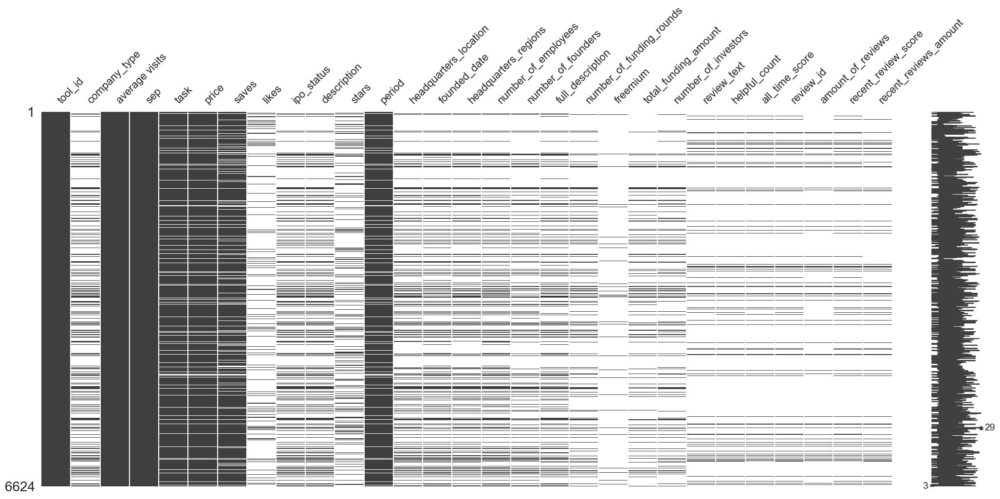

In [5180]:
import missingno as msno

# Matrix plot to visualize missing data
msno.matrix(df)



As we can clearly see in above visualizations is:

The Matrix: average visits, task , price, period and saves are quite filled. Second grade is the ipo_status, company type and description. Third grade are the rest of the variables.

The Heatmap: this map shows the correlation between missingness of variables. Which says something about the Missingness Completely at Random (MCAR) (Robin, 1987). We can clearly see that the missingness of variables correlates with the dataset they come from. So most of them are not MCAR. We will perform another trick on the menu. But we first we change datatypes so we have more numerical values for this analysis.

<Axes: >

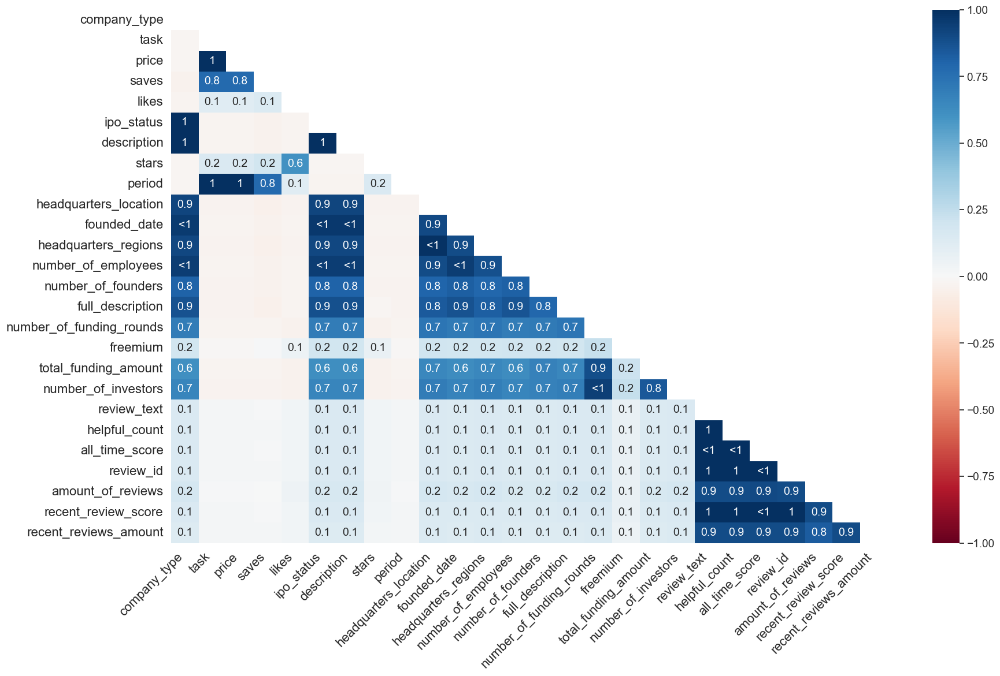

In [5181]:
# Heatmap to visualize correlation of missingness between different columns
msno.heatmap(df)

In [5182]:
#checking nan values
df.isnull().sum()

tool_id                        0
company_type                5044
average visits                 0
sep                            0
task                         568
price                        568
saves                        888
likes                       5777
ipo_status                  5034
description                 5034
stars                       5261
period                       568
headquarters_location       5232
founded_date                5127
headquarters_regions        5258
number_of_employees         5150
number_of_founders          5486
full_description            5334
number_of_funding_rounds    5741
freemium                    6425
total_funding_amount        5911
number_of_investors         5824
review_text                 5877
helpful_count               5876
all_time_score              5885
review_id                   5876
amount_of_reviews           6011
recent_review_score         5878
recent_reviews_amount       6011
dtype: int64

In [5183]:
df.shape

(6624, 29)

### Changing datatypes

In [5184]:
df.dtypes

tool_id                     float64
company_type                 object
average visits              float64
sep                         float64
task                         object
price                        object
saves                        object
likes                       float64
ipo_status                   object
description                  object
stars                       float64
period                       object
headquarters_location        object
founded_date                 object
headquarters_regions         object
number_of_employees          object
number_of_founders          float64
full_description             object
number_of_funding_rounds    float64
freemium                     object
total_funding_amount        float64
number_of_investors         float64
review_text                  object
helpful_count               float64
all_time_score              float64
review_id                    object
amount_of_reviews           float64
recent_review_score         

In [5185]:
df3 = df

In [5186]:
#change tool id to int
df['tool_id'] = df['tool_id'].astype(int)

# change the type of the columns to the right type but skip nan values
df['stars'] = pd.to_numeric(df['stars'], errors='coerce')
df['period'] = df['period'].astype('string')
#change saves , to . in order to change to int
#df['saves'] = df['saves'].str.replace(',', '.')
df['saves'] = pd.to_numeric(df['saves'], errors='coerce')

df['number_of_employees'] = df['number_of_employees'].astype('category')
df['number_of_founders'] = pd.to_numeric(df['number_of_founders'], errors='coerce')
df['number_of_funding_rounds'] = pd.to_numeric(df['number_of_funding_rounds'], errors='coerce')
df['number_of_investors'] = pd.to_numeric(df['number_of_investors'], errors='coerce')
#df['number_of_acquisitions'] = pd.to_numeric(df['number_of_acquisitions'], errors='coerce')

df['total_funding_amount'] = pd.to_numeric(df['total_funding_amount'], errors='coerce')
df['company_type'] = df['company_type'].astype('category', errors='ignore')

df['ipo_status'] = df['ipo_status'].astype('category', errors='ignore')
df['founded_date'] = pd.to_datetime(df['founded_date'])
#df['name_format'] = df['name_format'].astype('string')
df['task'] = df['task'].astype('string')

df['headquarters_location'] = df['headquarters_location'].astype('string')
df['headquarters_regions'] = df['headquarters_regions'].astype('string')
df['description'] = df['description'].astype('string')
df['full_description'] = df['full_description'].astype('string')

#review text
df['review_text'] = df['review_text'].astype('string')

#review id to string
df['review_id'] = df['review_id'].astype('string')

#twijfel
#df['use case'] = df['use case'].astype('string')
df['freemium'] = df['freemium'].astype('category')
#df['last_funding_date'] = pd.to_datetime(df['last_funding_date'])

In [5187]:
df.dtypes

tool_id                              int64
company_type                      category
average visits                     float64
sep                                float64
task                        string[python]
price                               object
saves                              float64
likes                              float64
ipo_status                        category
description                 string[python]
stars                              float64
period                      string[python]
headquarters_location       string[python]
founded_date                datetime64[ns]
headquarters_regions        string[python]
number_of_employees               category
number_of_founders                 float64
full_description            string[python]
number_of_funding_rounds           float64
freemium                          category
total_funding_amount               float64
number_of_investors                float64
review_text                 string[python]
helpful_cou

Now that we have changed datatypes we will check the Chi2 for every variable according to: YASSIR AREZKI (2019)

https://www.kaggle.com/code/yassirarezki/handling-missing-data-mcar-mar-and-mnar-part-i

In [5188]:
#save df to csv
df.to_csv('/Users/macbook/thesis/new/code/data/processed_data/df.csv')

## testing signifance without imputing

In [5189]:
from scipy.stats import chi2_contingency

In [5190]:
import pandas as pd

def test_missingness_independence(dataframe, col1, col2):
    # Create contingency table for missingness between col1 and col2
    contingency_table = pd.crosstab(dataframe[col1].isnull(), dataframe[col2].isnull())
    
    # Perform Chi-Square test
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    # Return the p-value
    return p

# Identify numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Initialize a DataFrame for the grid
dependency_grid = pd.DataFrame(index=numerical_columns, columns=numerical_columns)

# Perform the Chi-Square tests and populate the grid
for col1 in numerical_columns:
    for col2 in numerical_columns:
        if col1 != col2:
            p_value = test_missingness_independence(df, col1, col2)
            dependency_grid.at[col1, col2] = 'Yes' if p_value < 0.05 else 'No'
        else:
            dependency_grid.at[col1, col2] = 'N/A'  # For diagonal entries

#give yes color red, no color blue and na color white
# Display the grid with colored cells
dependency_grid.style.background_gradient(cmap='coolwarm')

# Display the grid
(dependency_grid)


,tool_id,average visits,sep,saves,likes,stars,number_of_founders,number_of_funding_rounds,total_funding_amount,number_of_investors,helpful_count,all_time_score,amount_of_reviews,recent_review_score,recent_reviews_amount
tool_id,N/A,No,No,No,No,No,No,No,No,No,No,No,No,No,No
average visits,No,N/A,No,No,No,No,No,No,No,No,No,No,No,No,No
sep,No,No,N/A,No,No,No,No,No,No,No,No,No,No,No,No
saves,No,No,No,N/A,Yes,Yes,Yes,Yes,Yes,Yes,No,No,No,No,No
likes,No,No,No,Yes,N/A,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
stars,No,No,No,Yes,Yes,N/A,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
number_of_founders,No,No,No,Yes,Yes,Yes,N/A,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
number_of_funding_rounds,No,No,No,Yes,Yes,Yes,Yes,N/A,Yes,Yes,Yes,Yes,Yes,Yes,Yes
total_funding_amount,No,No,No,Yes,Yes,Yes,Yes,Yes,N/A,Yes,Yes,Yes,Yes,Yes,Yes
number_of_investors,No,No,No,Yes,Yes,Yes,Yes,Yes,Yes,N/A,Yes,Yes,Yes,Yes,Yes


## Imputing the data

This section is important. Every variable will receive a special treatment, it's form will be cases based on domain knowledge:

Case 1: Missing because it's logically absent --> replace NaN with zero

Case 2: Acceptable defaults or categorical flagging --> replace NaN with category

Case 3: Missing at random --> Simple imputer (mean)

Case 4: Missing not at random but it is correlating with similar variables (founders, employees, e.d.) --> KNN imputer

Case 5: Missing not at random but it is not correlating with similar categories --> MICE (Multivariate Imputer by Chained Equations)

IMPORTANT NOTE: if features are not yet numerical, they will be imputed in a later stage according to the cases.

In [5191]:
df.columns

Index(['tool_id', 'company_type', 'average visits', 'sep', 'task', 'price',
       'saves', 'likes', 'ipo_status', 'description', 'stars', 'period',
       'headquarters_location', 'founded_date', 'headquarters_regions',
       'number_of_employees', 'number_of_founders', 'full_description',
       'number_of_funding_rounds', 'freemium', 'total_funding_amount',
       'number_of_investors', 'review_text', 'helpful_count', 'all_time_score',
       'review_id', 'amount_of_reviews', 'recent_review_score',
       'recent_reviews_amount'],
      dtype='object')

Case 1: Missing because it's logically absent

number_of_founders: If a company has no founders listed, it might be because it's a sole proprietorship or the information is not available.
number_of_funding_rounds: If no funding rounds are listed, it could imply the company hasn't gone through any.
number_of_investors: If this is missing, it might mean there are no investors.
total_funding_amount: If this is zero or missing, it could imply the company hasn't raised any funds.
amount_of_reviews: No reviews could mean it's a new or less-known product.
recent_reviews_amount: Similar to amount_of_reviews.

Case 2: Acceptable defaults or categorical flagging

ipo_status: If missing, you could categorize as 'Not Public' or similar.
company_type: Could default to a common type if missing, or a category like 'Unknown'.
freemium: If missing, you could assume 'No' if most companies are not freemium, or create a separate category.
helpful_count: is part of the review

Case 3: Missing at random

likes: User engagement metrics like likes could be missing at random.
stars: Ratings could be missing randomly if not all users rate the company or product.

Case 4: Missing not at random but correlating with similar variables

saves: If this is a metric that tends to be reported alongside likes or reviews, and it's missing, it might not be at random and could be related to user engagement metrics.

Case 5: Missing not at random but not correlating with similar categories

price: The missing price could depend on various factors not necessarily related to other variables.
description: Missing descriptions could be due to various non-random reasons not reflected in other variables.
all_time_score: If this is a cumulative metric, its absence could be related to the history or activity of the company, not necessarily linked to other single-time variables.


In [5192]:
# Case 1: Replace NaN with zero for features where missingness implies absence
for column in ['total_funding_amount', 'number_of_funding_rounds' , 'number_of_investors',  'recent_reviews_amount','amount_of_reviews']:  # replace with actual column names
    df[column].fillna(0, inplace=True)

# Case 2: Replace NaN with a new category for features where a default category is acceptable
#new_category = 'New_Category'
#for column in ['recent_review_score', 'all_time_score', 'freemium', 'helpful_count']:
#    df[column] = df[column].astype('category')  # Ensure the column has 'category' dtype
#    df[column] = df[column].cat.add_categories(new_category)  # Add the new category to the categorical column
 #   df[column].fillna(new_category, inplace=True)



In [5193]:

# Case 3: Apply SimpleImputer for features missing at random
simple_imp = SimpleImputer(strategy='mean')
features_case_3 = ['likes', 'stars'] 
df[features_case_3] = simple_imp.fit_transform(df[features_case_3])

In [5194]:

# Case 4: Apply KNNImputer for features not missing at random and correlated with similar variables
#knn_imp = KNNImputer()
#features_case_4 = ['number_of_employees', 'number_of_founders']  # replace with actual column names
#df[features_case_4] = knn_imp.fit_transform(df[features_case_4])

# Case 5: Apply MICE for features not missing at random and not correlated with similar categories
#mice_imp = IterativeImputer()
#features_case_5 = ['price']  # replace with actual column names
#df[features_case_5] = mice_imp.fit_transform(df[features_case_5])


In [5195]:
#count null
df.isnull().sum()

tool_id                        0
company_type                5044
average visits                 0
sep                            0
task                         568
price                        568
saves                        905
likes                          0
ipo_status                  5034
description                 5034
stars                          0
period                       568
headquarters_location       5232
founded_date                5127
headquarters_regions        5258
number_of_employees         5150
number_of_founders          5486
full_description            5334
number_of_funding_rounds       0
freemium                    6425
total_funding_amount           0
number_of_investors            0
review_text                 5877
helpful_count               5876
all_time_score              5885
review_id                   5876
amount_of_reviews              0
recent_review_score         5878
recent_reviews_amount          0
dtype: int64

In [5196]:
#count amount of review text filled
df['review_text'].notnull().sum()

747

### Normalizing data

In [5197]:
# Normalize text data in all applicable columns
text_columns = [ 'price',  'headquarters_location', 
                'headquarters_regions', 'task']

for col in text_columns:
    df[col] = df[col].fillna('not specified').str.lower().replace('[^a-z0-9 ]', '', regex=True)


In [5198]:
df.shape

(6624, 29)

# 3. EDA, Data cleaning and Feature engineering
There are cases when these three processes are done in tandem. This is such a case.

We will go through each of the featuers seperataly. When features are engineered they are labeled green.


### Distribution analysis

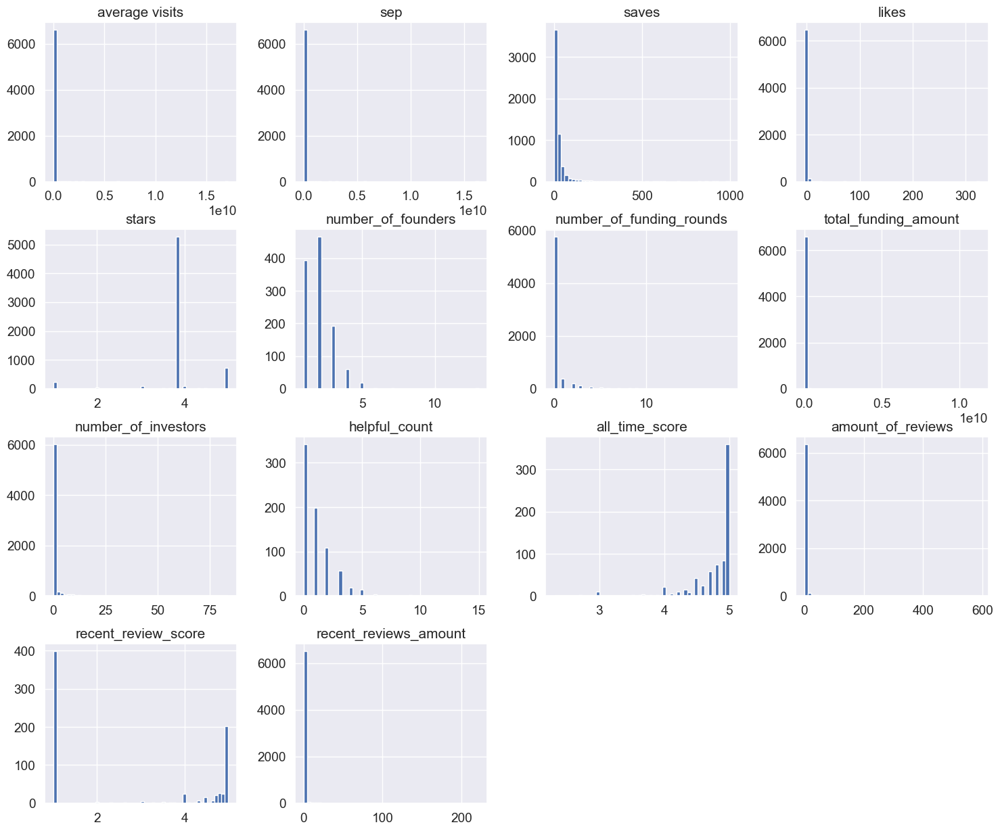

In [5199]:
# List of all columns
all_columns = df.columns.tolist()

# Columns to exclude
exclude_columns = ['tool_id', 'founded_date', 'months_since_period', 'months_since_founded', 'number_of_employees_imputed', 'Topic_1', 'Topic_2', 'Topic_3']

# Create a new list of columns to include by excluding the specified columns
selected_columns = [col for col in all_columns if col not in exclude_columns]

# Plotting for distribution analysis for selected features
df[selected_columns].hist(bins=50, figsize=(18,15))
plt.show()

*Basic stats on the EDA*

In [5200]:
# Getting some basic statistics
claim_10000000 = len(df[df['average visits'] > 10000000])
print('Number of average visits', claim_10000000)
claim_20000000 = len(df[df['average visits'] > 20000000])
print('Number of average visits is', claim_20000000)

saves_40= len(df[df['saves'] > 40])
print('Tools:', saves_40)

fund = len(df[df['total_funding_amount'] > 100000])
print('funding above:', fund)
fund2 = len(df[df['total_funding_amount'] > 1000000])
print('funding above:', fund2)
fund3 = len(df[df['total_funding_amount'] < 100000])
print('funding beneath:', fund3)

Number of average visits 95
Number of average visits is 73
Tools: 909
funding above: 681
funding above: 512
funding beneath: 5938


In [5201]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6624 entries, 0 to 31138
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   tool_id                   6624 non-null   int64         
 1   company_type              1580 non-null   category      
 2   average visits            6624 non-null   float64       
 3   sep                       6624 non-null   float64       
 4   task                      6624 non-null   string        
 5   price                     6624 non-null   object        
 6   saves                     5719 non-null   float64       
 7   likes                     6624 non-null   float64       
 8   ipo_status                1590 non-null   category      
 9   description               1590 non-null   string        
 10  stars                     6624 non-null   float64       
 11  period                    6056 non-null   string        
 12  headquarters_location   

In [5202]:
#df.info()

#print sparsity percentage, and mean and datatype
def sparsity_level(df):
    sparsity = []
    for col in df.columns:
        miss = df[col].isnull().sum()
        sparsity.append((miss/len(df[col]))*100)
    return pd.DataFrame({'column_name':df.columns,'sparsity':sparsity})

print(sparsity_level(df))

#save to csv
sparsity_level(df).to_excel('/Users/macbook/thesis/new/code/data/raw_data/sparsity.xlsx')

#drop all that have no average visits
df = df.dropna(subset=['average visits'], how='all')



                 column_name   sparsity
0                    tool_id   0.000000
1               company_type  76.147343
2             average visits   0.000000
3                        sep   0.000000
4                       task   0.000000
5                      price   0.000000
6                      saves  13.662440
7                      likes   0.000000
8                 ipo_status  75.996377
9                description  75.996377
10                     stars   0.000000
11                    period   8.574879
12     headquarters_location   0.000000
13              founded_date  77.400362
14      headquarters_regions   0.000000
15       number_of_employees  77.747585
16        number_of_founders  82.820048
17          full_description  80.525362
18  number_of_funding_rounds   0.000000
19                  freemium  96.995773
20      total_funding_amount   0.000000
21       number_of_investors   0.000000
22               review_text  88.722826
23             helpful_count  88.707729


In [5203]:
df.describe()

,tool_id,average visits,sep,saves,likes,stars,founded_date,number_of_founders,number_of_funding_rounds,total_funding_amount,number_of_investors,helpful_count,all_time_score,amount_of_reviews,recent_review_score,recent_reviews_amount
count,6624.000000,6.624000e+03,6.624000e+03,5719.000000,6624.00000,6624.000000,1497,1138.000000,6624.000000,6.624000e+03,6624.000000,748.000000,739.000000,6624.000000,746.000000,6624.000000
mean,4804.389946,6.847697e+06,6.641643e+06,29.498863,2.44510,3.815774,2018-11-08 15:53:15.991984128,2.018453,0.337107,1.163580e+07,0.833333,1.078877,4.754398,2.030344,2.741287,0.457880
min,3.000000,0.000000e+00,0.000000e+00,1.000000,-4.00000,1.000000,1911-01-01 00:00:00,1.000000,0.000000,0.000000e+00,0.000000,0.000000,2.300000,0.000000,1.000000,0.000000
25%,2376.500000,7.110000e+02,4.106685e+02,6.000000,2.44510,3.815774,2018-01-01 00:00:00,1.000000,0.000000,0.000000e+00,0.000000,0.000000,4.700000,0.000000,1.000000,0.000000
50%,4798.500000,4.695000e+03,3.346602e+03,14.000000,2.44510,3.815774,2020-04-09 00:00:00,2.000000,0.000000,0.000000e+00,0.000000,1.000000,4.900000,0.000000,1.000000,0.000000
75%,7223.250000,2.873600e+04,3.031771e+04,29.000000,2.44510,3.815774,2022-01-01 00:00:00,2.000000,0.000000,0.000000e+00,0.000000,2.000000,5.000000,0.000000,5.000000,0.000000
max,9434.000000,1.712668e+10,1.632972e+10,994.000000,326.00000,5.000000,2023-10-18 00:00:00,13.000000,19.000000,1.130012e+10,84.000000,15.000000,5.000000,590.000000,5.000000,222.000000
std,2789.265243,2.331856e+08,2.219993e+08,59.786105,4.16972,0.705115,NaN,1.071175,1.184621,2.174757e+08,3.690748,1.473708,0.424572,16.069149,1.896188,5.824374


## Changing the features

####  <span style="color:green;font-weight:bold;">Feature 1: Age of company</span>


In [5204]:
from datetime import datetime

def convert_to_months(period):
    current_date = datetime(2024, 1, 1)
    months = {'january': 1, 'february': 2, 'march': 3, 'april': 4, 'may': 5, 'june': 6, 
              'july': 7, 'august': 8, 'september': 9, 'october': 10, 'november': 11, 'december': 12}
    
    if isinstance(period, float) or not isinstance(period, str):
        return None
    
    if period.lower() in months:
        month_num = months[period.lower()]
        year_of_period = current_date.year if month_num <= current_date.month else current_date.year - 1
        return (current_date.year - year_of_period) * 12 + (current_date.month - month_num)
    elif period.isdigit():
        return (current_date.year - int(period)) * 12
    else:
        return None

# Apply the function to your DataFrame
df['months_since_period'] = df['period'].apply(convert_to_months)


In [5205]:
print(df['months_since_period'].value_counts())

months_since_period
10.0    812
9.0     684
8.0     663
24.0    572
7.0     549
5.0     452
0.0     431
6.0     429
11.0    364
1.0     269
4.0     237
36.0    189
2.0     182
48.0     94
3.0      56
60.0     37
84.0     18
72.0     12
96.0      6
Name: count, dtype: int64


In [5206]:
import pandas as pd
from dateutil.relativedelta import relativedelta

# Huidige datum instellen
current_date = pd.Timestamp.now().normalize()

# Functie om het aantal maanden te berekenen
def calculate_months_since_founded(row):
    if pd.notnull(row):
        difference = relativedelta(current_date, row)
        return difference.years * 12 + difference.months
    return None

df['months_since_founded'] = df['founded_date'].apply(calculate_months_since_founded)

# Weergeven van de DataFrame
print(df[['founded_date', 'months_since_founded']].head())


   founded_date  months_since_founded
0           NaT                   NaN
1           NaT                   NaN
2           NaT                   NaN
3    2005-06-01                 224.0
22          NaT                   NaN


In [5207]:
df['merged_months'] = df[['months_since_period', 'months_since_founded']].mean(axis=1)
df['merged_months'] = df['merged_months'].fillna(0).astype('int64')
print(df['merged_months'].sample())

20458    10
Name: merged_months, dtype: int64


/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


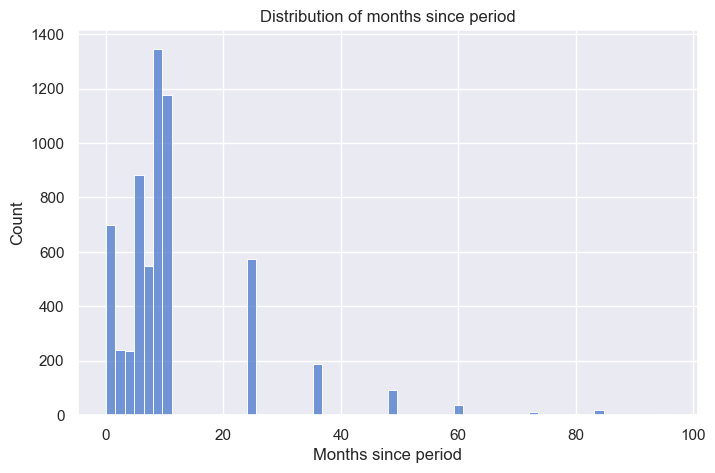

/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


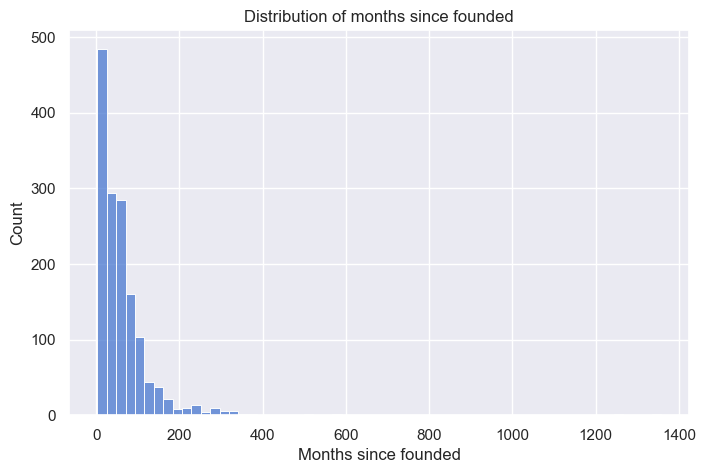

In [5208]:

# Plot the distribution of the months since period below 60 months with sns
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='months_since_period', bins=60)
plt.title('Distribution of months since period')
plt.xlabel('Months since period')
plt.ylabel('Count')
plt.show()

# Plot the distribution of the months since period below 60 months with sns
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='months_since_founded', bins=60)
plt.title('Distribution of months since founded')
plt.xlabel('Months since founded')
plt.ylabel('Count')
plt.show()



/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


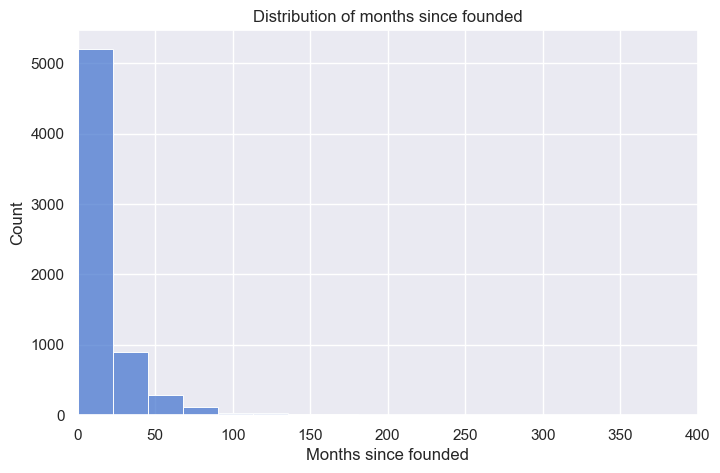

0.588768115942029
58.69565217391305


In [5209]:
# Plot the distribution of the months since period below 60 months with sns
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='merged_months', bins=60)
plt.title('Distribution of months since founded')
plt.xlabel('Months since founded')
plt.ylabel('Count')

# Set the x-axis limits to remove outliers
plt.xlim(0, 400)

plt.show()

#percentage of tools older than 150 months
print(len(df[df['merged_months'] > 150])/len(df)*100)
print(len(df[df['merged_months'] < 10])/len(df)*100)


In [5210]:
#delete all companies older than 120 months
df = df[df['merged_months'] < 120]


####  <span style="color:green;font-weight:bold;">Feature 2: Price</span>


In [5211]:
#sample freemium category
df['freemium'].value_counts()

freemium
Yes    146
No      50
Name: count, dtype: int64

In [5212]:
# Convert the 'price' column to lowercase and remove special characters
df['price'] = df['price'].str.lower().str.replace(r'[^a-z0-9\s]', '', regex=True)

# Update the 'freemium' column based on the 'price' column
# If 'price' contains 'free', set 'freemium' to 'Yes', unless it's already 'Yes'
condition_free = df['price'].str.contains('free') & (df['freemium'] != 'Yes')
df.loc[condition_free, 'freemium'] = 'Yes'

# Replace non-specific pricing indications with NaN
non_specific_pricing = ['not specified', 'no pricing', 'contact developers']
for non_specific in non_specific_pricing:
    df['price'] = df['price'].replace(non_specific, np.NaN)

# Fill NaN values in 'price' column with a specific value
df['price'] = df['price'].fillna('NaN')

# Extract and keep only the numeric part from 'price' values that contain 'from'
condition_from = df['price'].str.contains('from')
df.loc[condition_from, 'price'] = df.loc[condition_from, 'price'].str.extract(r'from (\d+)')[0]

# Now change all rows that do not contain only a number to NaN
df['price'] = df['price'].replace(r'[^0-9]+', np.NaN, regex=True)

# Optionally, convert the 'price' column to a numeric dtype
df['price'] = pd.to_numeric(df['price'], errors='coerce')

# Print value counts for the 'price' column
print(df['price'].value_counts())



price
19.0     137
10.0     133
29.0     122
5.0      122
9.0      109
        ... 
76.0       1
34.0       1
31.0       1
980.0      1
259.0      1
Name: count, Length: 229, dtype: int64


In [5213]:
#df freemium count
df['freemium'].value_counts()

freemium
Yes    1786
No       42
Name: count, dtype: int64

In [5214]:
#price info
df['price'].value_counts()


price
19.0     137
10.0     133
29.0     122
5.0      122
9.0      109
        ... 
76.0       1
34.0       1
31.0       1
980.0      1
259.0      1
Name: count, Length: 229, dtype: int64

In [5215]:
df.shape

(6554, 32)

In [5216]:
# Convert 'price' to a numeric type, coercing errors to NaN (necessary if any non-numeric strings remain)
df['price'] = pd.to_numeric(df['price'], errors='coerce')

# price null fill with mean
df['price'] = df['price'].fillna(df['price'].mean())

#delete price outliers above 10000
df = df[df['price'] < 10000]


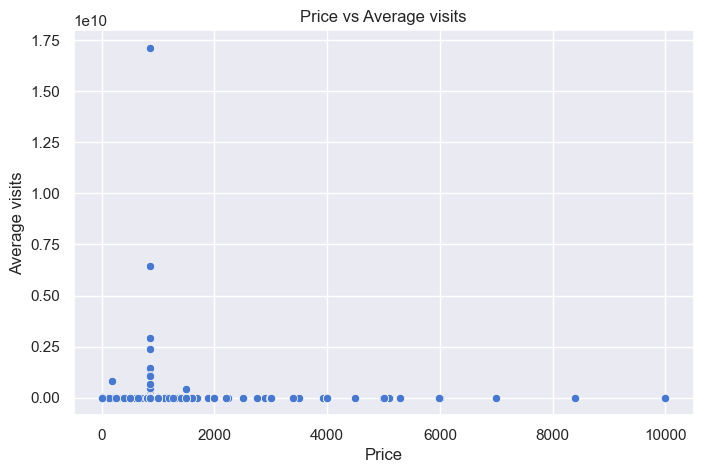

In [5217]:
#price scatter
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='price', y='average visits')
plt.title('Price vs Average visits')
plt.xlabel('Price')
plt.ylabel('Average visits')
plt.show()


/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


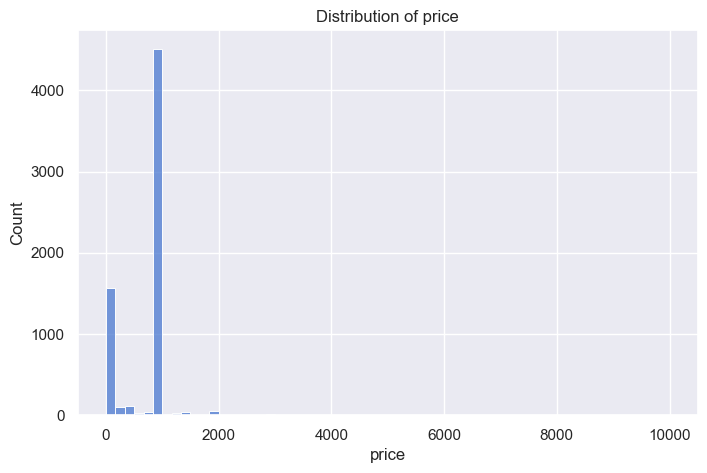

In [5218]:
#price distribution
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='price', bins=60)
plt.title('Distribution of price')
plt.xlabel('price')
plt.ylabel('Count')
plt.show()


In [5219]:
# Assuming 'price' has already been cleaned of non-numeric characters and 'free' has been handled

# Convert 'price' to a numeric type, coercing errors to NaN (necessary if any non-numeric strings remain)
df['price'] = pd.to_numeric(df['price'], errors='coerce')

# Define the number of categories
num_categories = 10

# Handle NaN values in 'price' before categorization
# Create a mask for entries with a non-null 'price'
mask = df['price'].notnull()

# Create the price categories based on percentiles of the non-null prices
# Using 'mask' to only calculate quantiles on non-null values
df.loc[mask, 'price_category'] = pd.qcut(df.loc[mask, 'price'], q=num_categories, labels=False, duplicates='drop')

# Fill the NaN values in 'price_category' with a separate category, e.g., -1
df['price_category'].fillna(15, inplace=True)

# Convert 'price_category' to an integer type
df['price_category'] = df['price_category'].astype(int)

# Print the value counts for each category
print(df['price_category'].value_counts())


price_category
2    4883
0     722
1     634
3     305
Name: count, dtype: int64


/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


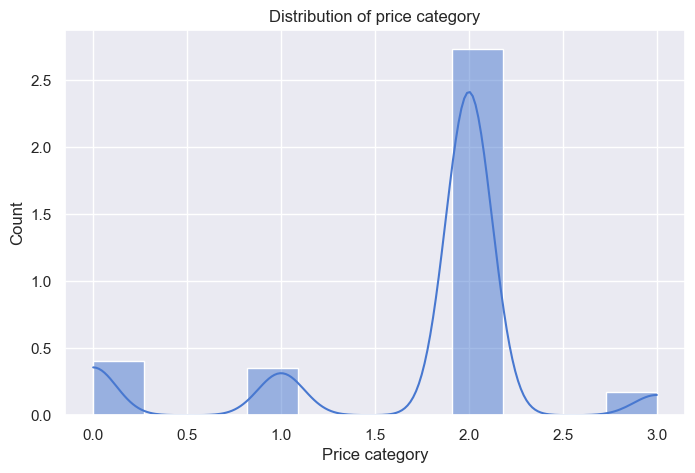

In [5220]:


plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='price_category', bins=11, kde=True, stat='density')
plt.title('Distribution of price category')
plt.xlabel('Price category')
plt.ylabel('Count')
plt.show()


####  <span style="color:green;font-weight:bold;">Feature 3: Headquarter location</span>


In [5221]:
#df['headquarters_regions'].value_counts()

#string contains europe
df['headquarters_regions'].str.contains('europe').value_counts()

headquarters_regions
False    6159
True      385
Name: count, dtype: Int64

In [5222]:
#hq lcoation head and region
#df['headquarters_location'].value_counts()


In [5223]:
# make new column with boolean if a row contains one of the following: london, Paris, New York, los angeles, amsterdam, san fransisco, bay area, tokyo, boston, beijing
df['hq_location'] = df['headquarters_regions'].str.contains('london|los altos|oxford|paris|new york|los angeles|amsterdam|san francisco|bay area|tokyo|boston|beijing|bengaluru|shanghai|tel aviv|singapore', regex=True, na=False)
df['hq_location'] = df['headquarters_location'].str.contains('london|los altos|oxford|paris|new york|los angeles|amsterdam|san francisco|bay area|tokyo|boston|beijing|bengularu|shanghai|tel aviv|singapore', regex=True, na=False)

In [5224]:
df['hq_location'].value_counts()

hq_location
False    6017
True      527
Name: count, dtype: Int64

####  <span style="color:green;font-weight:bold;">Feature 4: Company type</span>


leaving company type out of the analysis because no data on non profit

In [5225]:
# count values of company type 
print(df['company_type'].value_counts())

company_type
For Profit    1496
Non-profit      10
Name: count, dtype: int64


####  <span style="color:green;font-weight:bold;">Criteria: Average visits</span>


/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


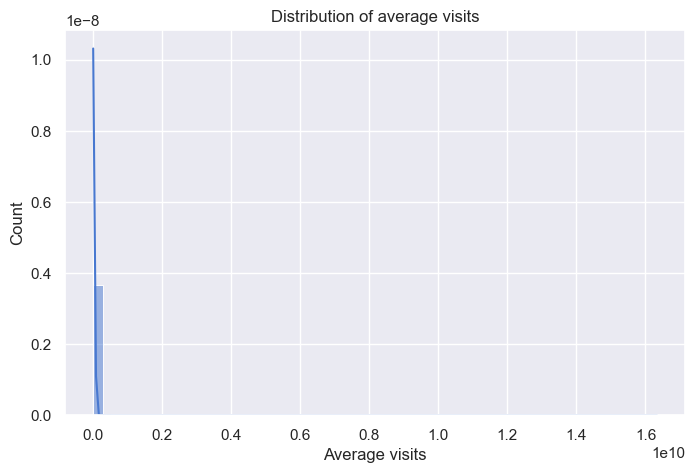

In [5226]:
#plot average_visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='sep', bins=60, kde=True, stat='density')
plt.title('Distribution of average visits')
plt.xlabel('Average visits')
plt.ylabel('Count')
plt.show()

The criteria is not normally distrubuted so that needs to be changed.

In [5227]:
# count the percentage of tools with 0 visits
print(len(df[df['average visits'] == 0])/len(df)*100)

# count the percentage of tools with more than 1000000 visits
print(len(df[df['average visits'] > 100000])/len(df)*100)

# count the percentage of tools with more than 1000000 visits
print(len(df[df['average visits'] > 1000000])/len(df)*100)

# count the percentage of tools with more than 10000000 visits
print(len(df[df['average visits'] > 10000000])/len(df)*100)

# count the percentage of tools with more than 20000000 visits
print(len(df[df['average visits'] > 20000000])/len(df)*100)

# count the percentage of tools with more than 30000000 visits
print(len(df[df['average visits'] > 30000000])/len(df)*100)

# count the percentage of tools with more than 100.000.000 visits
print(len(df[df['average visits'] > 100000000])/len(df)*100)

2.0171149144254277
14.303178484107578
4.202322738386308
1.05440097799511
0.7946210268948656
0.6570904645476773
0.36674816625916873


In [5228]:
#percentage of tools with less than 1000 visits
print(len(df[df['sep'] < 100])/len(df)*100)

#percentage of tools with less than 1000 visits
print(len(df[df['average visits'] < 1000])/len(df)*100)

#percentage of tools with less than 10000 visits
print(len(df[df['average visits'] < 10000])/len(df)*100)

#percentage of tools with less than 100000 visits
print(len(df[df['average visits'] < 100000])/len(df)*100)

#percentage of tools with less than 1000000 visits
print(len(df[df['average visits'] < 1000000])/len(df)*100)


13.84474327628362
28.896699266503667
62.20965770171149
85.69682151589242
95.79767726161369


In [5229]:
# Bereken de percentielen voor de onder- en bovengrens
lower_bound = df['average visits'].quantile(0.03)  # 1.5e percentiel
upper_bound = df['average visits'].quantile(0.90)  # 98.5e percentiel

# Filter de dataset om alleen waarden binnen deze grenzen te behouden
df = df[(df['average visits'] > lower_bound) & (df['average visits'] < upper_bound)]

# Toon de resultaten
print(f"Oorspronkelijk aantal rijen: {len(df)}")
print(f"Aantal rijen na filtering: {len(filtered_df)}")

Oorspronkelijk aantal rijen: 5690
Aantal rijen na filtering: 5690


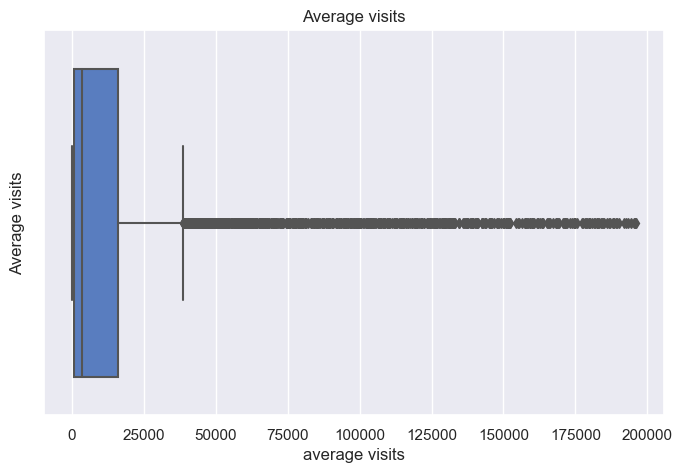

In [5230]:

#boxplot average visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.boxplot(data=df, x='average visits')
plt.title('Average visits')
plt.ylabel('Average visits')
plt.show()


In [5231]:
df.shape

(5690, 34)

In [5232]:
#delete all tools with 0 visits
#df = df[df['average visits'] > 1000]

#delete all tools with more than 100.000.000 visits
#df = df[df['average visits'] < 8000]

/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


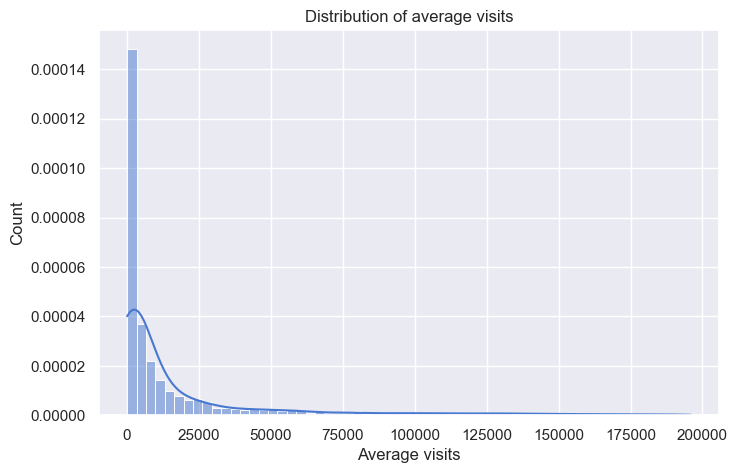

In [5233]:
df = df[df['average visits'] < 100000000]

#plot average_visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='average visits', bins=60, kde=True, stat='density')
plt.title('Distribution of average visits')
plt.xlabel('Average visits')
plt.ylabel('Count')
plt.show()


In [5234]:
#delete all tools with less than 1000 visits
df = df[df['average visits'] > 100]

#delete all tools with less than 1000 visits
df = df[df['average visits'] < 100000]

/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/ipykernel_29474/314210099.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['average visits'], bins=60, kde=True)
/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


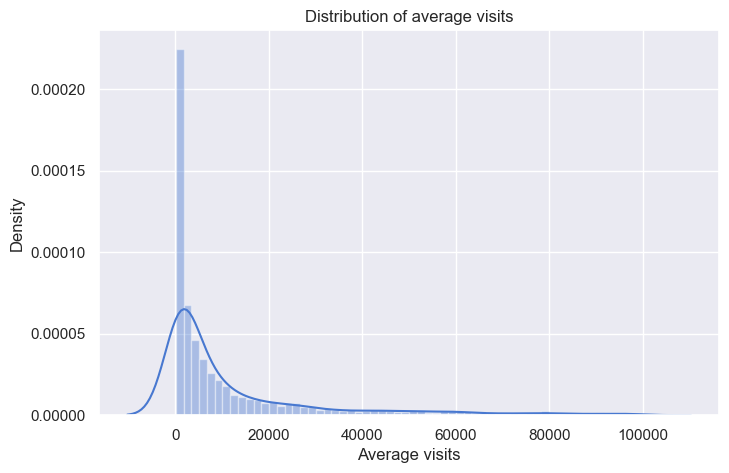

In [5235]:
#distplot average visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.distplot(df['average visits'], bins=60, kde=True)
plt.title('Distribution of average visits')
plt.xlabel('Average visits')
plt.ylabel('Density')
plt.show()


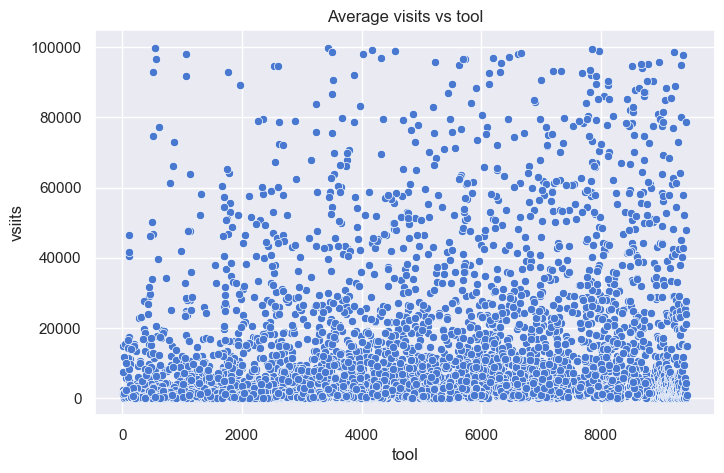

In [5236]:
#scatter of average visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='tool_id', y='average visits')
plt.title('Average visits vs tool')
plt.xlabel('tool')
plt.ylabel('vsiits')
plt.show()


In [5237]:
df.shape

(5077, 34)

/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'worlwide box office (log)')

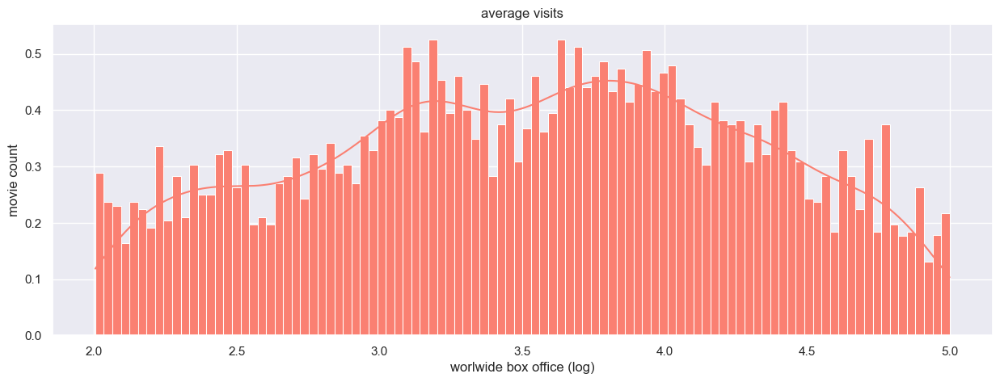

In [5238]:
#Logaritmic Plot of Worldwide box office after dropping outliers

#make log transformation
df['average_visits'] = np.log10(df['average visits'])


plt.figure(figsize =(15, 5))
sns.histplot(data=df, x='average_visits', bins=100, facecolor = 'salmon', kde=True, stat='density')

plt.title('average visits')
plt.ylabel('movie count')
plt.xlabel('worlwide box office (log)')

In [5239]:

# Check skewness and kurtosis after transformation
print("Skewness after transformation:", df['average_visits'].skew())
print("Kurtosis after transformation:", df['average_visits'].kurtosis())

# Shapiro-Wilk Test after transformation
stat, p = stats.shapiro(df['average_visits'])
print('Statistics=%.3f, p=%.3f' % (stat, p))

# Interpretation of Shapiro-Wilk Test after transformation
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0) after transformation')
else:
    print('Sample does not look Gaussian (reject H0) after transformation')


Skewness after transformation: -0.09587660105986992
Kurtosis after transformation: -0.9273687563007393
Statistics=0.976, p=0.000
Sample does not look Gaussian (reject H0) after transformation


/Users/macbook/anaconda3/lib/python3.11/site-packages/scipy/stats/_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Skewness before transformation: 2.3791107944239873
Kurtosis before transformation: 5.544815478681626
Statistics=0.651, p=0.000
Sample does not look Gaussian (reject H0)
Skewness after transformation: -0.015686096215957762
Kurtosis after transformation: -0.9335901268463567
Statistics=0.976, p=0.000
Sample does not look Gaussian (reject H0) after transformation


/Users/macbook/anaconda3/lib/python3.11/site-packages/scipy/stats/_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


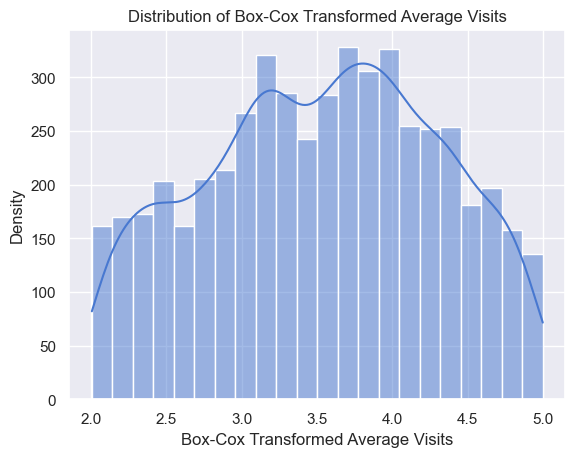

In [5240]:
from scipy import stats
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and 'average_visits' is the column with the skewed data

# Check skewness and kurtosis before transformation
print("Skewness before transformation:", df['average visits'].skew())
print("Kurtosis before transformation:", df['average visits'].kurtosis())

# Shapiro-Wilk Test before transformation
stat, p = stats.shapiro(df['average visits'])
print('Statistics=%.3f, p=%.3f' % (stat, p))

# Interpretation of Shapiro-Wilk Test
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

# Apply Box-Cox Transformation
df['box_average_visits'], fitted_lambda = stats.boxcox(df.loc[df['average visits'] > 0, 'average visits'])

# Check skewness and kurtosis after transformation
print("Skewness after transformation:", df['box_average_visits'].skew())
print("Kurtosis after transformation:", df['box_average_visits'].kurtosis())

# Shapiro-Wilk Test after transformation
stat, p = stats.shapiro(df['average_visits'])
print('Statistics=%.3f, p=%.3f' % (stat, p))

# Interpretation of Shapiro-Wilk Test after transformation
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0) after transformation')
else:
    print('Sample does not look Gaussian (reject H0) after transformation')

# Plot the transformed average_visits
sns.histplot(df['average_visits'], kde=True)
plt.title('Distribution of Box-Cox Transformed Average Visits')
plt.xlabel('Box-Cox Transformed Average Visits')
plt.ylabel('Density')
plt.show()


In [5241]:
df.shape

(5077, 36)

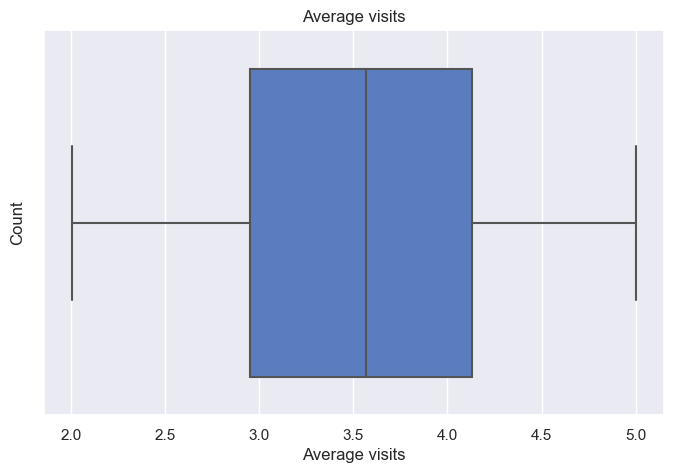

In [5242]:
#boxplot of average visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.boxplot(data=df, x='average_visits')
plt.title('Average visits')
plt.xlabel('Average visits')
plt.ylabel('Count')
plt.show()

In [5243]:
df.shape

(5077, 36)

The histogram with the kernel density estimate suggests that the log transformation has improved the distribution of average_visits, making it look more like a normal distribution, although the D'Agostino's K^2 test still indicates a significant departure from normality.

Given the skewness and kurtosis values are close to zero (which would be expected in a normal distribution), and considering the visual evidence from the histogram, it's likely that the dataset is sufficiently close to normal for many practical purposes.

####  <span style="color:green;font-weight:bold;">Feature 10: Total funding amount</span>


/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


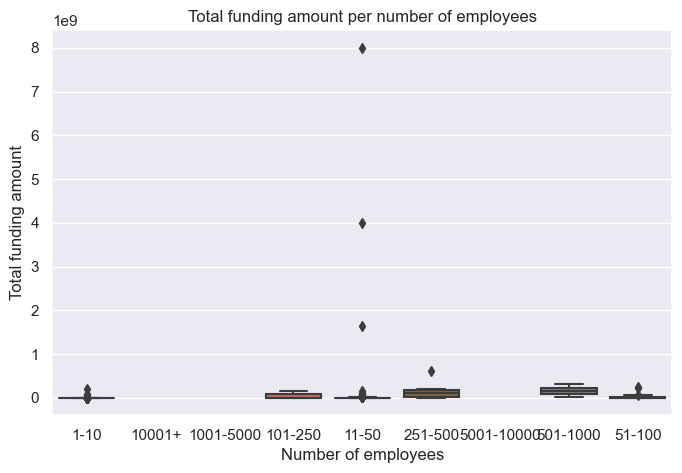

In [5244]:
# boxplot of total funding and number of employees
plt.figure(figsize=(8, 5))
sns.boxplot(data=df, y='total_funding_amount', x='number_of_employees')
plt.title('Total funding amount per number of employees')
plt.xlabel('Number of employees')
plt.ylabel('Total funding amount')
plt.show()

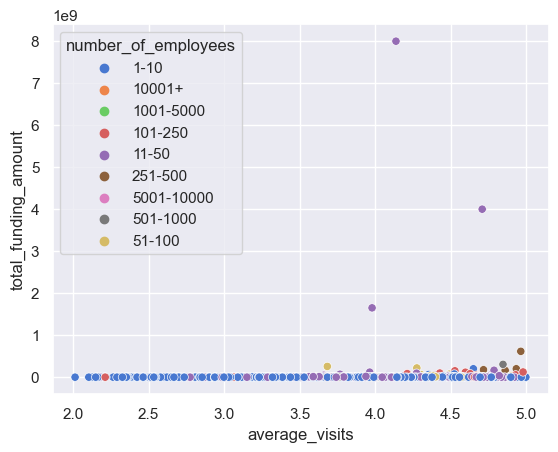

In [5245]:
# plot of average visits, employees and funding with employee categories as colours
sns.scatterplot(x='average_visits', y='total_funding_amount', hue='number_of_employees', data=df)
plt.show()

In [5246]:

print(df['total_funding_amount'].skew())
print(df['total_funding_amount'].kurtosis())

# D'Agostino's K^2 Test on the log-transformed data
stat, p = stats.normaltest(df['total_funding_amount'])
print(f'Statistics={stat:.3f}, p={p:.3f}')

54.08840646726186
3162.0834906352497
Statistics=16497.048, p=0.000


We have got some outliers so we will remove them.

In [5247]:
#fill nans with 0 
df['total_funding_amount'] = df['total_funding_amount'].fillna(0)

#remove outliers from total funding amount
print(len(df[df['total_funding_amount'] < 100000000]))
print(len(df[df['total_funding_amount'] > 100000000]))

#percentage
print(len(df[df['total_funding_amount'] > 100000000])/len(df)*100)
print(len(df[df['total_funding_amount'] > 10000000])/len(df)*100)
print(len(df[df['total_funding_amount'] > 1000000])/len(df)*100)

#delete outliers
df = df[df['total_funding_amount'] < 1000000000]

#count amount
print(df['total_funding_amount'].value_counts())


5061
16
0.31514674020090605
1.75300374236754
5.101437857002167
total_funding_amount
0.0            4664
500000.0         41
1000000.0        10
5000000.0         8
2000000.0         8
               ... 
43500000.0        1
1600000.0         1
5250000.0         1
256100000.0       1
905000.0          1
Name: count, Length: 252, dtype: int64


In [5248]:
df.shape

(5074, 36)

####  <span style="color:green;font-weight:bold;">Feature 14: IPO Status</span>


In [5249]:
# count IPO status
print(df['ipo_status'].value_counts())

#change delisted to NaN
df['ipo_status'] = df['ipo_status'].replace('Delisted', np.NaN)

ipo_status
Private     1026
Public         2
Delisted       1
Name: count, dtype: int64


####  <span style="color:green;font-weight:bold;">Feature 16: Early Stage Funding</span>


In [5250]:
df.loc[(df['total_funding_amount'] > 0) & (df['merged_months'] < 12), 'funding_stage'] = True


/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/ipykernel_29474/4021219798.py:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[(df['total_funding_amount'] > 0) & (df['merged_months'] < 12), 'funding_stage'] = True


In [5251]:
df.loc[(df['total_funding_amount'] > 0) & (df['merged_months'] < 12), 'funding_stage'] = True

#to boolean
#df['funding_stage'] = df['funding_stage'].astype('bool')





In [5252]:
#df funding stage is true
print(df['funding_stage'].value_counts())

funding_stage
True    50
Name: count, dtype: int64


# 4.  Natural Language Processing

####  <span style="color:green;font-weight:bold;">Feature 5: Category </span>


In [5253]:
data= pd.read_csv('/Users/macbook/thesis/new/code/data/processed_data/category_df2.csv')

# merge data and new_df_2 on tool_id
df = pd.merge(df, data[['tool_id', 'category']], on='tool_id', how='left')

In [5254]:
df.shape

(5074, 38)

In [5255]:
#task to string
df['task'] = df['task'].astype('string')

In [5256]:
#df task is nan
df['task'].isnull().sum()

#fill nan with not specified
#df['task'] = df['task'].fillna('not specified')

0

In [5257]:
#change task to labelencoder
#from sklearn.preprocessing import LabelEncoder
#le = LabelEncoder()
#df['task'] = le.fit_transform(df['task'])

In [5258]:
df.head()

,tool_id,company_type,average visits,sep,task,price,saves,likes,ipo_status,description,...,recent_reviews_amount,months_since_period,months_since_founded,merged_months,price_category,hq_location,average_visits,box_average_visits,funding_stage,category
0,1471,NaN,595.0,780.883401,image coloring,39.000000,3.0,2.4451,NaN,<NA>,...,0.0,6.0,NaN,6,1,False,2.774517,7.000098,NaN,NaN
1,7978,NaN,2466.0,0.000000,phone case designs,859.098663,14.0,2.4451,NaN,<NA>,...,0.0,24.0,NaN,24,2,False,3.391993,8.737091,NaN,NaN
2,437,NaN,130.0,187.858436,customer support,12.000000,150.0,1.0000,NaN,<NA>,...,0.0,5.0,NaN,5,0,False,2.113943,5.217367,NaN,NaN
3,128,NaN,2526.0,22659.495070,avatars,6.000000,43.0,2.4451,NaN,<NA>,...,0.0,4.0,NaN,4,0,False,3.402433,8.767063,NaN,NaN
4,4225,NaN,1879.0,212.126917,chatgpt,859.098663,6.0,2.4451,NaN,<NA>,...,0.0,9.0,NaN,9,2,False,3.273927,8.399558,NaN,NaN


In [5259]:
df.head()

#save to csv
df.to_csv('/Users/macbook/thesis/new/code/data/processed_data/df2.csv')


In [5260]:
#read csv
#df = pd.read_csv('/Users/macbook/thesis/new/code/data/processed_data/df2.csv')

In [5261]:
df.columns

Index(['tool_id', 'company_type', 'average visits', 'sep', 'task', 'price',
       'saves', 'likes', 'ipo_status', 'description', 'stars', 'period',
       'headquarters_location', 'founded_date', 'headquarters_regions',
       'number_of_employees', 'number_of_founders', 'full_description',
       'number_of_funding_rounds', 'freemium', 'total_funding_amount',
       'number_of_investors', 'review_text', 'helpful_count', 'all_time_score',
       'review_id', 'amount_of_reviews', 'recent_review_score',
       'recent_reviews_amount', 'months_since_period', 'months_since_founded',
       'merged_months', 'price_category', 'hq_location', 'average_visits',
       'box_average_visits', 'funding_stage', 'category'],
      dtype='object')

In [5262]:
df.sample(10)

,tool_id,company_type,average visits,sep,task,price,saves,likes,ipo_status,description,...,recent_reviews_amount,months_since_period,months_since_founded,merged_months,price_category,hq_location,average_visits,box_average_visits,funding_stage,category
4417,4771,NaN,381.0,620.311900,job interviews,859.098663,23.0,2.4451,NaN,<NA>,...,0.0,10.0,NaN,10,2,False,2.580925,6.469696,NaN,NaN
4519,17,NaN,1277.0,11494.233767,travel itineraries,859.098663,21.0,2.4451,NaN,<NA>,...,2.0,3.0,NaN,3,2,False,3.106191,7.924454,NaN,NaN
4281,4714,NaN,31540.0,7592.001133,symptoms checking,859.098663,27.0,2.4451,NaN,<NA>,...,0.0,10.0,NaN,10,2,False,4.498862,12.030514,NaN,NaN
2476,9146,For Profit,1727.0,3220.925820,not specified,859.098663,NaN,2.4451,Private,Kodif.ai is a customer experience platform tha...,...,0.0,NaN,37.0,37,2,False,3.237292,8.295351,NaN,3.0
1829,8222,NaN,4709.0,1051.146648,writing,39.000000,4.0,2.4451,NaN,<NA>,...,0.0,24.0,NaN,24,1,False,3.672929,9.550721,NaN,NaN
844,2275,NaN,1044.0,0.000000,document qa,5.000000,4.0,2.4451,NaN,<NA>,...,0.0,7.0,NaN,7,0,False,3.018700,7.678688,NaN,NaN
4277,2892,NaN,2196.0,3727.626402,shortform content,1299.000000,14.0,2.4451,NaN,<NA>,...,0.0,8.0,NaN,8,3,False,3.341632,8.592801,NaN,NaN
1791,7730,NaN,8419.0,537.089979,image generation,999.000000,34.0,1.0000,NaN,<NA>,...,0.0,24.0,NaN,24,3,False,3.925261,10.294269,NaN,NaN
1575,2286,For Profit,14186.0,89188.958435,image generation,20.000000,3.0,2.4451,Private,Exactly.ai is an artwork creation platform. It...,...,0.0,7.0,15.0,11,1,True,4.151860,10.972452,NaN,NaN
4475,823,NaN,161.0,177.370657,childrens stories,859.098663,3.0,2.4451,NaN,<NA>,...,0.0,5.0,NaN,5,2,False,2.206826,5.463439,NaN,NaN


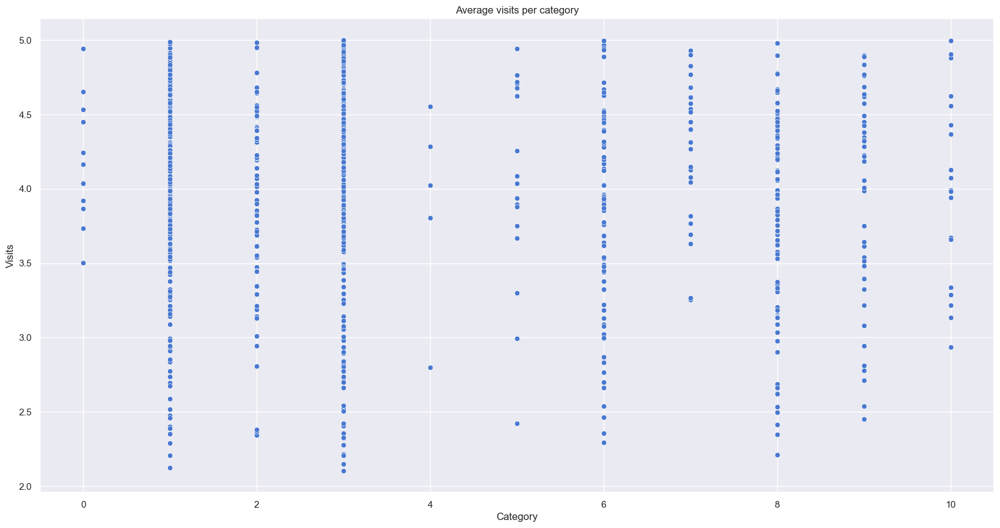

In [5263]:
#visualizing average visits and categories
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(20, 10))
sns.scatterplot(data=df, x='category', y='average_visits')
plt.title('Average visits per category')
plt.xlabel('Category')
plt.ylabel('Visits')
plt.show()


# 5. Latent Dirichlet Allocation & Sentiment Analysis

Importing CSV and merging to df

####  <span style="color:green;font-weight:bold;">Feature 13 & 14: Topics & Sentiment </span>


In [5264]:
data = pd.read_csv('/Users/macbook/thesis/new/code/data/processed_data/topics_sentiment.csv')
data.columns

Index(['tool_id', 'collaboration_sent', 'innovative_sent', 'information_sent',
       'service_sent', 'business_development_sent', 'content_management_sent',
       'user_experience_sent', 'design_sent', 'time_management_sent',
       'product_sent', 'content_creation_sent', 'customer_support_sent',
       'ease_of_use_sent', 'workflow_optimization_sent', 'ai_assistant_sent',
       'collaboration', 'innovative', 'information', 'service',
       'business_development', 'content_management', 'user_experience',
       'design', 'time_management', 'product', 'content_creation',
       'customer_support', 'ease_of_use', 'workflow_optimization',
       'ai_assistant'],
      dtype='object')

In [5265]:
df = pd.merge(df, data[['tool_id', 'collaboration_sent', 'innovative_sent', 'information_sent',
       'service_sent', 'business_development_sent', 'content_management_sent',
       'user_experience_sent', 'design_sent', 'time_management_sent',
       'product_sent', 'content_creation_sent', 'customer_support_sent',
       'ease_of_use_sent', 'workflow_optimization_sent', 'ai_assistant_sent',
       'collaboration', 'innovative', 'information', 'service',
       'business_development', 'content_management', 'user_experience',
       'design', 'time_management', 'product', 'content_creation',
       'customer_support', 'ease_of_use', 'workflow_optimization',
       'ai_assistant']], on='tool_id', how='left')
df.drop_duplicates(subset=['tool_id'], keep='first', inplace=True)

In [5266]:
df.shape

(5074, 68)

In [5267]:
#count unique valies df
print(df['tool_id'].nunique())
print(df.shape)
df.head()

5074
(5074, 68)


,tool_id,company_type,average visits,sep,task,price,saves,likes,ipo_status,description,...,content_management,user_experience,design,time_management,product,content_creation,customer_support,ease_of_use,workflow_optimization,ai_assistant
0,1471,NaN,595.0,780.883401,image coloring,39.000000,3.0,2.4451,NaN,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,7978,NaN,2466.0,0.000000,phone case designs,859.098663,14.0,2.4451,NaN,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,437,NaN,130.0,187.858436,customer support,12.000000,150.0,1.0000,NaN,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,128,NaN,2526.0,22659.495070,avatars,6.000000,43.0,2.4451,NaN,<NA>,...,0.0,0.0,0.0,0.5,0.0,0.0,0.5,0.0,0.0,0.0
4,4225,NaN,1879.0,212.126917,chatgpt,859.098663,6.0,2.4451,NaN,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5268]:
#count nan
print(df.isnull().sum())

tool_id                     0
company_type             4054
average visits              0
sep                         0
task                        0
                         ... 
content_creation         4571
customer_support         4571
ease_of_use              4571
workflow_optimization    4571
ai_assistant             4571
Length: 68, dtype: int64


In [5269]:
df.columns

Index(['tool_id', 'company_type', 'average visits', 'sep', 'task', 'price',
       'saves', 'likes', 'ipo_status', 'description', 'stars', 'period',
       'headquarters_location', 'founded_date', 'headquarters_regions',
       'number_of_employees', 'number_of_founders', 'full_description',
       'number_of_funding_rounds', 'freemium', 'total_funding_amount',
       'number_of_investors', 'review_text', 'helpful_count', 'all_time_score',
       'review_id', 'amount_of_reviews', 'recent_review_score',
       'recent_reviews_amount', 'months_since_period', 'months_since_founded',
       'merged_months', 'price_category', 'hq_location', 'average_visits',
       'box_average_visits', 'funding_stage', 'category', 'collaboration_sent',
       'innovative_sent', 'information_sent', 'service_sent',
       'business_development_sent', 'content_management_sent',
       'user_experience_sent', 'design_sent', 'time_management_sent',
       'product_sent', 'content_creation_sent', 'customer_suppo

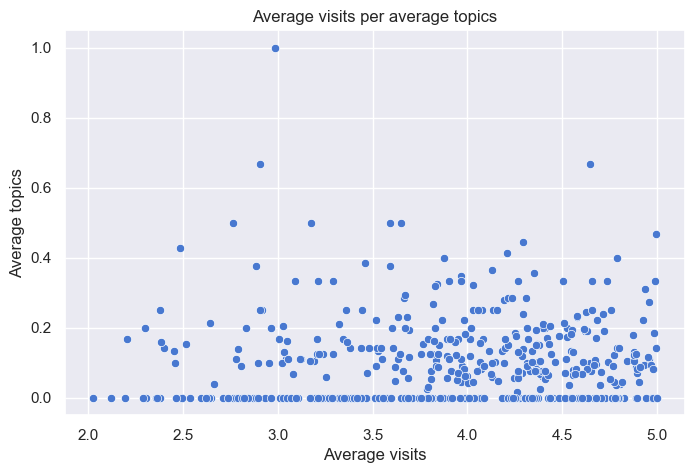

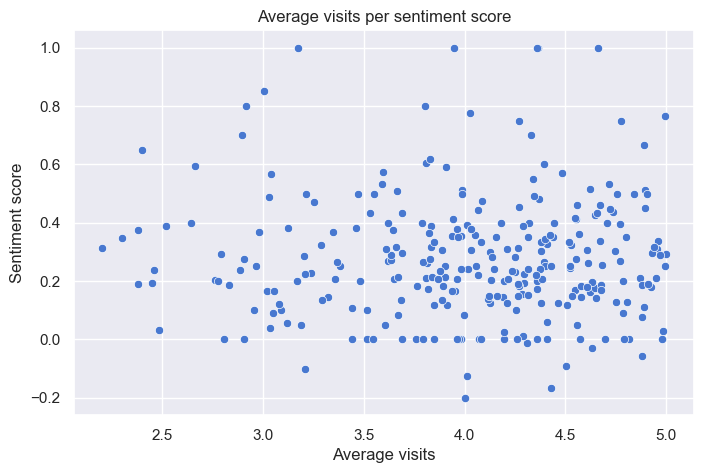

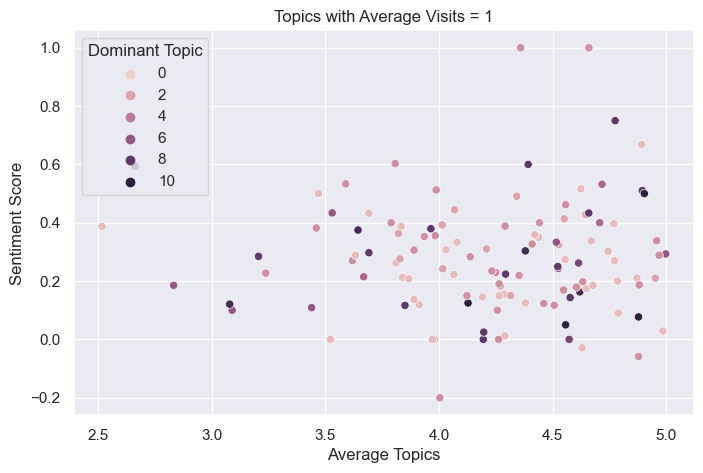

In [5270]:
#average_visits for each topic in visualized
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='average_visits', y='collaboration')
plt.title('Average visits per average topics')
plt.xlabel('Average visits')
plt.ylabel('Average topics')
plt.show()

#average_visits for each topic in visualized
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='average_visits', y='collaboration_sent')
plt.title('Average visits per sentiment score')
plt.xlabel('Average visits')
plt.ylabel('Sentiment score')
plt.show()


# Filter the dataframe to include only rows where average_visits is 1

# Plot all topics with the number 1 in average visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='average_visits', y='collaboration_sent', hue='category')
plt.title('Topics with Average Visits = 1')
plt.xlabel('Average Topics')
plt.ylabel('Sentiment Score')
plt.legend(title='Dominant Topic')
plt.show()

plt.show()


In [5271]:
#number 0 in topic 0
df['collaboration'].value_counts()




collaboration
0.000000    223
0.166667     12
0.250000     12
0.125000     11
0.142857     11
           ... 
0.088235      1
0.092593      1
0.087533      1
0.192308      1
0.161290      1
Name: count, Length: 129, dtype: int64

# 6. Checking first assumptions for regression 

First we start with correlation, then we will do imputation and VIF, and linearity check between criteria and predictors.

In between some extra feature engineering will be done.

But first selecting relevant columns.

In [5272]:
df.columns

Index(['tool_id', 'company_type', 'average visits', 'sep', 'task', 'price',
       'saves', 'likes', 'ipo_status', 'description', 'stars', 'period',
       'headquarters_location', 'founded_date', 'headquarters_regions',
       'number_of_employees', 'number_of_founders', 'full_description',
       'number_of_funding_rounds', 'freemium', 'total_funding_amount',
       'number_of_investors', 'review_text', 'helpful_count', 'all_time_score',
       'review_id', 'amount_of_reviews', 'recent_review_score',
       'recent_reviews_amount', 'months_since_period', 'months_since_founded',
       'merged_months', 'price_category', 'hq_location', 'average_visits',
       'box_average_visits', 'funding_stage', 'category', 'collaboration_sent',
       'innovative_sent', 'information_sent', 'service_sent',
       'business_development_sent', 'content_management_sent',
       'user_experience_sent', 'design_sent', 'time_management_sent',
       'product_sent', 'content_creation_sent', 'customer_suppo

In [5273]:
features = ['price_category',  'price', 'freemium', 'funding_stage', 'company_type', 'months_since_founded', 'months_since_period', 'average_visits', 'merged_months', 'category', 'hq_location', 'saves', 'likes','stars', 'number_of_employees', 'helpful_count', 'number_of_founders', 'number_of_investors', 
            'number_of_funding_rounds', 'total_funding_amount', 'all_time_score', 'ipo_status', 'amount_of_reviews',
              'collaboration_sent', 'innovative_sent',
       'information_sent', 'service_sent', 'business_development_sent',
       'content_management_sent', 'user_experience_sent', 'design_sent',
       'time_management_sent', 'product_sent', 'content_creation_sent',
       'customer_support_sent', 'ease_of_use_sent',
       'workflow_optimization_sent', 'ai_assistant_sent', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant']

In [5274]:
b = df[features]

In [5275]:
c = df[['tool_id'] + features].drop_duplicates(subset=['tool_id'], keep='first')

In [5276]:
#if nan fill with 0 in funding stage
c['funding_stage'] = c['funding_stage'].fillna(0)

#change true to 1
c['funding_stage'] = c['funding_stage'].astype(int)

#funding stage to boolean
c['funding_stage'] = c['funding_stage'].astype('bool')


In [5277]:
c.shape

(5074, 54)

In [5278]:
b.describe()

,price_category,price,months_since_founded,months_since_period,average_visits,merged_months,category,saves,likes,stars,...,content_management,user_experience,design,time_management,product,content_creation,customer_support,ease_of_use,workflow_optimization,ai_assistant
count,5074.000000,5074.000000,958.000000,4715.000000,5074.000000,5074.000000,805.000000,4479.000000,5074.000000,5074.000000,...,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000,503.000000
mean,1.725069,686.848521,42.008351,9.596182,3.527078,11.947379,3.755280,27.358116,2.379719,3.814837,...,0.136158,0.178024,0.050641,0.173375,0.199718,0.207619,0.116577,0.235513,0.109568,0.181577
std,0.724044,562.652351,32.553339,8.908662,0.773905,13.883828,2.825521,51.523735,1.290155,0.715593,...,0.169590,0.177491,0.103024,0.168330,0.189039,0.210494,0.157409,0.203404,0.136262,0.184884
min,0.000000,1.000000,3.000000,0.000000,2.004321,0.000000,0.000000,1.000000,-3.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,199.000000,15.000000,5.000000,2.946820,5.000000,1.000000,6.000000,2.445100,3.815774,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.107625,0.000000,0.000000
50%,2.000000,859.098663,37.000000,8.000000,3.567614,8.000000,3.000000,14.000000,2.445100,3.815774,...,0.095238,0.156863,0.000000,0.153846,0.181818,0.166667,0.069767,0.210526,0.083333,0.145455
75%,2.000000,859.098663,57.000000,10.000000,4.130181,11.000000,6.000000,27.000000,2.445100,3.815774,...,0.200000,0.263158,0.058652,0.263932,0.300000,0.316986,0.176471,0.333333,0.153846,0.272727
max,3.000000,9999.000000,229.000000,84.000000,4.999492,117.000000,10.000000,863.000000,73.000000,5.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [5279]:
c.dtypes

tool_id                          int64
price_category                   int64
price                          float64
freemium                      category
funding_stage                     bool
company_type                  category
months_since_founded           float64
months_since_period            float64
average_visits                 float64
merged_months                    int64
category                       float64
hq_location                    boolean
saves                          float64
likes                          float64
stars                          float64
number_of_employees           category
helpful_count                  float64
number_of_founders             float64
number_of_investors            float64
number_of_funding_rounds       float64
total_funding_amount           float64
all_time_score                 float64
ipo_status                    category
amount_of_reviews              float64
collaboration_sent             float64
innovative_sent          

In [5280]:
import pandas as pd

# Assuming 'b' is your DataFrame with the data.
df_summary_list = []

# Loop through each column and calculate the mean (if applicable) and sparsity.
for column in b.columns:
    data_dict = {'Column': column, 'Dtype': str(b[column].dtype)}
    
    # Calculate sparsity for all columns.
    data_dict['Sparsity (%)'] = "{:.2f}".format((b[column].isnull().sum() / len(b[column])) * 100)
    
    # Calculate mean if the column is numeric.
    if b[column].dtype in ['int64', 'float64']:
        # Format the mean with two decimal places and comma as thousand separator.
        data_dict['Mean'] = "{:,.2f}".format(b[column].mean())
    else:
        data_dict['Mean'] = None  # Non-numeric columns get a None value.
    
    # Append the dictionary to the list.
    df_summary_list.append(data_dict)

# Create the summary DataFrame from the list of dictionaries.
df_summary = pd.DataFrame(df_summary_list)

#save to excel
df_summary.to_excel('/Users/macbook/thesis/new/code/data/raw_data/df_summary.xlsx')

# Display the DataFrame.
df_summary


,Column,Dtype,Sparsity (%),Mean
0,price_category,int64,0.00,1.73
1,price,float64,0.00,686.85
2,freemium,category,72.86,None
3,funding_stage,object,99.01,None
4,company_type,category,79.90,None
5,months_since_founded,float64,81.12,42.01
6,months_since_period,float64,7.08,9.60
7,average_visits,float64,0.00,3.53
8,merged_months,int64,0.00,11.95
9,category,float64,84.13,3.76


In [5281]:
#is null c
print(c.notnull().sum())

tool_id                       5074
price_category                5074
price                         5074
freemium                      1377
funding_stage                 5074
company_type                  1020
months_since_founded           958
months_since_period           4715
average_visits                5074
merged_months                 5074
category                       805
hq_location                   5074
saves                         4479
likes                         5074
stars                         5074
number_of_employees            943
helpful_count                  513
number_of_founders             701
number_of_investors           5074
number_of_funding_rounds      5074
total_funding_amount          5074
all_time_score                 507
ipo_status                    1028
amount_of_reviews             5074
collaboration_sent             280
innovative_sent                341
information_sent               262
service_sent                   324
business_development

In [5282]:
import pandas as pd

# Assuming 'b' is your DataFrame with the data.
df_summary_list = []

#drop tool id
#c = c.drop(['tool_id'], axis=1)

# Loop through each column and calculate the mean (if applicable) and sparsity.
for column in c.columns:
    data_dict = {'Column': column, 'Dtype': str(c[column].dtype)}
    
    # Calculate sparsity for all columns.
    data_dict['Sparsity (%)'] = "{:.2f}".format((c[column].isnull().sum() / len(c[column])) * 100)
    
    # Calculate mean if the column is numeric.
    if c[column].dtype in ['int64', 'float64']:
        # Format the mean with two decimal places and comma as thousand separator.
        data_dict['Mean'] = "{:,.2f}".format(c[column].mean())
    else:
        data_dict['Mean'] = None  # Non-numeric columns get a None value.
    
    # Append the dictionary to the list.
    df_summary_list.append(data_dict)

# Create the summary DataFrame from the list of dictionaries.
df_summary = pd.DataFrame(df_summary_list)

#save to excel
df_summary.to_excel('/Users/macbook/thesis/new/code/data/raw_data/c_summary.xlsx')

# Display the DataFrame.
df_summary


,Column,Dtype,Sparsity (%),Mean
0,tool_id,int64,0.00,"4,686.46"
1,price_category,int64,0.00,1.73
2,price,float64,0.00,686.85
3,freemium,category,72.86,None
4,funding_stage,bool,0.00,None
5,company_type,category,79.90,None
6,months_since_founded,float64,81.12,42.01
7,months_since_period,float64,7.08,9.60
8,average_visits,float64,0.00,3.53
9,merged_months,int64,0.00,11.95


In [5283]:
#change price category to category
b['price_category'] = b['price_category'].astype('category')

#change category to category
b['category'] = b['category'].astype('category')

#hange number of employees to category
b['number_of_employees'] = b['number_of_employees'].astype('category')

#change all time score to float after changing New_Category to 0
b['all_time_score'] = b['all_time_score'].replace('New_Category', '0').astype(float)

#helpful count to int replace new category with 0
b['helpful_count'] = b['helpful_count'].replace('New_Category', '0').astype(float)



/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/ipykernel_29474/1311733514.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['price_category'] = b['price_category'].astype('category')
/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/ipykernel_29474/1311733514.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['category'] = b['category'].astype('category')
/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/ipykernel_29474/1311733514.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy o

In [5284]:
#change price category to category
c['price_category'] = c['price_category'].astype('category')

#change category to category
c['category'] = c['category'].astype('category')

#hange number of employees to category
c['number_of_employees'] = c['number_of_employees'].astype('category')

#change all time score to float after changing New_Category to 0
c['all_time_score'] = c['all_time_score'].replace('New_Category', '0').astype(float)

#helpful count to int replace new category with 0
c['helpful_count'] = c['helpful_count'].replace('New_Category', '0').astype(float)




In [5285]:
b.dtypes

price_category                category
price                          float64
freemium                      category
funding_stage                   object
company_type                  category
months_since_founded           float64
months_since_period            float64
average_visits                 float64
merged_months                    int64
category                      category
hq_location                    boolean
saves                          float64
likes                          float64
stars                          float64
number_of_employees           category
helpful_count                  float64
number_of_founders             float64
number_of_investors            float64
number_of_funding_rounds       float64
total_funding_amount           float64
all_time_score                 float64
ipo_status                    category
amount_of_reviews              float64
collaboration_sent             float64
innovative_sent                float64
information_sent         

In [5286]:
c.shape

(5074, 54)

## 4.1 Correlation analysis

##### 4.1 Correlation analysis
For this we will first check which feature variables are correlated to the target variable. Note that we have both continuous and categorical feature variables, and the target variable is a continuous variable. Therefore, we will have to use different correlation methods, based on the nature of the variables.
- continuous <-> continuous -> Pearson's linear correlation
- ordinal <-> ordinal -> Spearman's rank correlation for understanding montonic relationships. Can also be used for continuous variables to study non linear associations.  
- nominal <-> continuous -> t-tests/ANOVA/Kruskal-Wallis H-test

In [5287]:
b.columns

Index(['price_category', 'price', 'freemium', 'funding_stage', 'company_type',
       'months_since_founded', 'months_since_period', 'average_visits',
       'merged_months', 'category', 'hq_location', 'saves', 'likes', 'stars',
       'number_of_employees', 'helpful_count', 'number_of_founders',
       'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'all_time_score', 'ipo_status',
       'amount_of_reviews', 'collaboration_sent', 'innovative_sent',
       'information_sent', 'service_sent', 'business_development_sent',
       'content_management_sent', 'user_experience_sent', 'design_sent',
       'time_management_sent', 'product_sent', 'content_creation_sent',
       'customer_support_sent', 'ease_of_use_sent',
       'workflow_optimization_sent', 'ai_assistant_sent', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'c

In [5288]:
# Defining the numerical feature variables

num_feature = ['average visits','saves', 'likes', 'stars', 'number_of_founders', 
                 'number_of_funding_rounds', 'total_funding_amount', 
                 'number_of_investors','amount_of_reviews', 'average_visits', 'num_topics', 'merged_months', 'average_topics', 'sentiment', 'sentiment_filtered']

# Defining the categorical feature variables
cat_feature = [ 'ipo_status', 'number_of_employees_labeled', 'hq_location', 'price_category', 'all_time_score', 'category'  ]

# Defining the numerical feature variables

num_features = ['average_visits', 'merged_months',
        'saves', 'likes', 'stars',
        'number_of_founders',
       'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
      'collaboration_sent', 'innovative_sent',
       'information_sent', 'service_sent', 'business_development_sent',
       'content_management_sent', 'user_experience_sent', 'design_sent',
       'time_management_sent', 'product_sent', 'content_creation_sent',
       'customer_support_sent', 'ease_of_use_sent',
       'workflow_optimization_sent', 'ai_assistant_sent', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant']

# Defining the categorical feature variables
cat_features = [ 'number_of_employees', 'hq_location', 'price_category', 'category', 'dominant_topic']

### 4.1.1 Correlation Analysis between the numerical variables

Used Spearman because it is non-parametric, so it is not sensitive to normality distribution

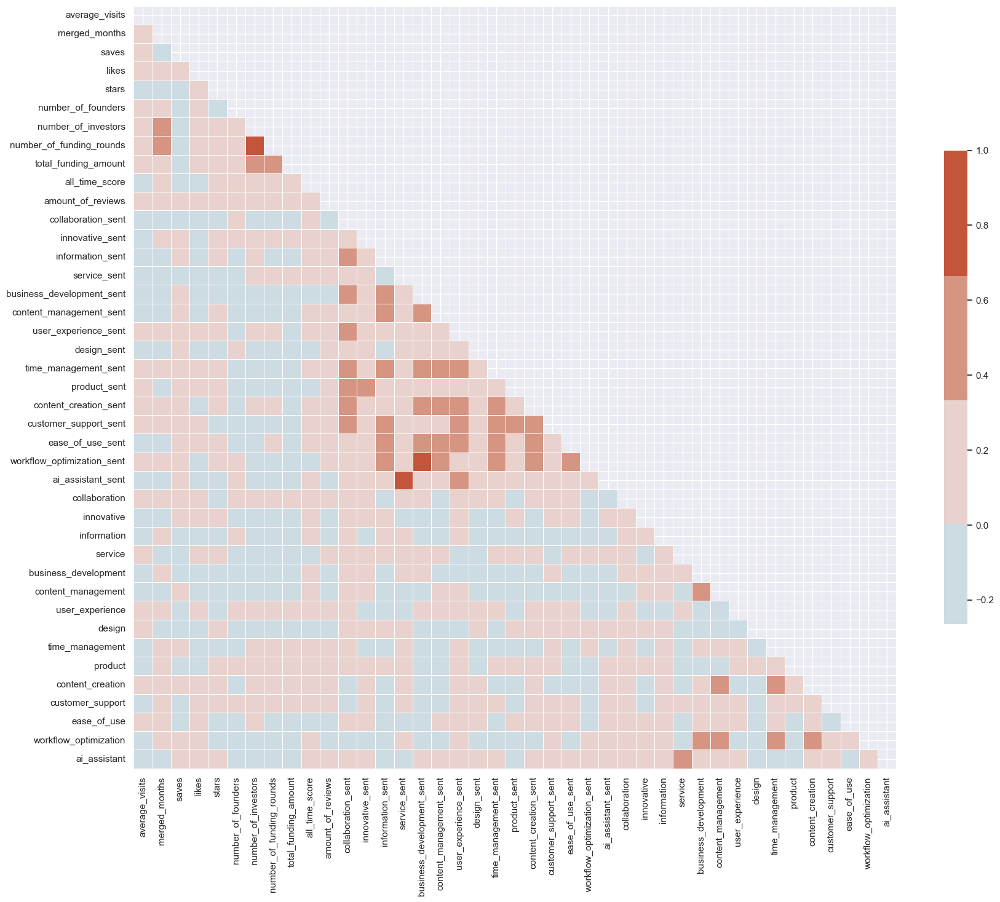

In [5289]:
import matplotlib.pyplot as plt
import seaborn as sns

# Increase the size of the heatmap
plt.figure(figsize=(20, 20))

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(c[num_features].corr(), dtype=bool))

# Choose a diverging color palette
cmap = sns.diverging_palette(230, 20, as_cmap=False)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(c[num_features].corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=False)

# Adjust font size
sns.set(font_scale=1.25)

plt.show()

From the Spearman correlation heatmap:

'Total_funding_amount' shows notable correlations with 'number_of_funding_rounds' (0.7) and 'number_of_investors' (0.69), indicating higher funding is associated with more rounds and investors.
'Average visits' shows moderate correlation with 'total_funding_amount' (0.57), suggesting some relationship between funding and site traffic.
Variables like 'saves', 'likes', and 'number_of_founders' have low correlations with 'average visits', hinting they may have less direct influence on site traffic.
Regularization may be needed in a regression model to address potential overfitting due to these low correlations.

In [5290]:
#correlation on dep var 'average_visits'
correlation = c[num_features].corr()['average_visits'].sort_values(ascending=False)

# Print the top 15 positive correlations
print(correlation)

average_visits                1.000000
merged_months                 0.254618
number_of_funding_rounds      0.207505
number_of_investors           0.187544
saves                         0.180813
amount_of_reviews             0.129094
number_of_founders            0.108811
total_funding_amount          0.106140
customer_support_sent         0.078212
content_creation_sent         0.076904
product_sent                  0.071832
time_management_sent          0.053583
collaboration                 0.052494
user_experience               0.046630
workflow_optimization_sent    0.030310
service                       0.029527
ease_of_use                   0.029201
likes                         0.025842
design                        0.021058
user_experience_sent          0.002831
content_creation              0.002484
ai_assistant                  0.001184
innovative                   -0.004103
innovative_sent              -0.012162
collaboration_sent           -0.013956
content_management       

### 4.1.2 Correlation Analysis between the categorical variables


/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


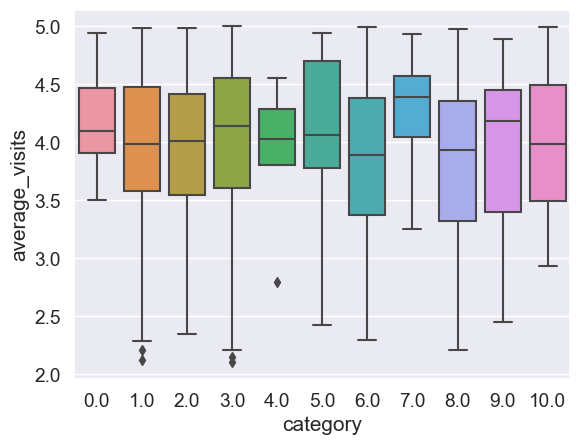

category
1.0     238
3.0     217
8.0      87
6.0      77
2.0      66
9.0      41
7.0      25
10.0     19
5.0      18
0.0      12
4.0       5
Name: count, dtype: int64


In [5291]:
# boxplots of different categories of number of employees
sns.boxplot(x='category', y='average_visits', data=c)
plt.show()

#count amount of values in each category
print(c['category'].value_counts())

In [5292]:
#make an seperate df for each category
df_cat1 = c[c['category'] ==0.0]['average_visits'].values
df_cat2 = c[c['category'] ==1.0]['average_visits'].values
df_cat3 = c[c['category'] ==3.0]['average_visits'].values
df_cat5 = c[c['category'] ==5.0]['average_visits'].values
df_cat6 = c[c['category'] ==6.0]['average_visits'].values
df_cat7 = c[c['category'] ==7.0]['average_visits'].values
df_cat8 = c[c['category'] ==8.0]['average_visits'].values
df_cat9 = c[c['category'] ==9.0]['average_visits'].values
df_cat10 = c[c['category'] ==10.0]['average_visits'].values
df_cat11 = c[c['category'] ==2.0]['average_visits'].values

/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


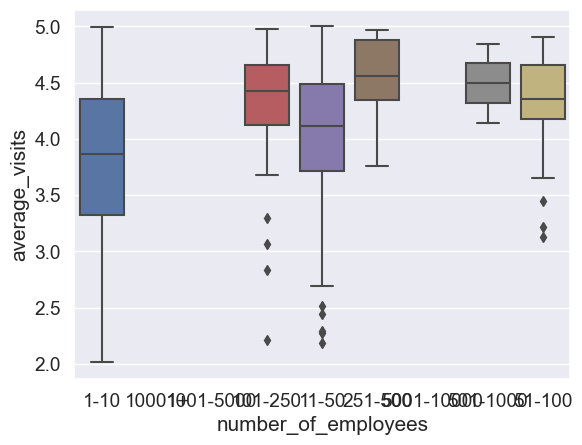

In [5293]:
# boxplots of different categories of number of employees
sns.boxplot(x='number_of_employees', y='average_visits', data=c)
plt.show()

In [5294]:
#change number of employees to category
c['number_of_employees'] = c['number_of_employees'].astype('category')


In [5295]:
#count amount of values in each category
print(c['number_of_employees'].value_counts())

number_of_employees
1-10          615
11-50         261
51-100         32
101-250        25
251-500         8
501-1000        2
10001+          0
1001-5000       0
5001-10000      0
Name: count, dtype: int64


When lower than 10 it will not be incorporated in analysis

In [5296]:
c.dtypes

tool_id                          int64
price_category                category
price                          float64
freemium                      category
funding_stage                     bool
company_type                  category
months_since_founded           float64
months_since_period            float64
average_visits                 float64
merged_months                    int64
category                      category
hq_location                    boolean
saves                          float64
likes                          float64
stars                          float64
number_of_employees           category
helpful_count                  float64
number_of_founders             float64
number_of_investors            float64
number_of_funding_rounds       float64
total_funding_amount           float64
all_time_score                 float64
ipo_status                    category
amount_of_reviews              float64
collaboration_sent             float64
innovative_sent          

In [5297]:
# Replace string categories with numerical labels
category_mapping = {
    '1-10': 1,
    '11-50': 2,
    '51-100': 3,
    '101-250': 4,
    '251-500': 5,
    '501-1000': 6,
    '1001-5000': 7,
    '5001-10000': 8,
    '10000+': 9
}

# Use the mapping to replace the values
c['number_of_employees'] = c['number_of_employees'].replace(category_mapping)

# Now, delete categories 8 and 9 using the isin method for better performance
c = c[~c['number_of_employees'].isin([8, 9])]


In [5298]:
#but label the category to number
c['number_of_employees'] = c['number_of_employees'].replace('1-10', 1)
c['number_of_employees'] = c['number_of_employees'].replace('11-50', 2)
c['number_of_employees'] = c['number_of_employees'].replace('51-100', 3)
c['number_of_employees'] = c['number_of_employees'].replace('101-250', 4)
c['number_of_employees'] = c['number_of_employees'].replace('251-500', 5)
c['number_of_employees'] = c['number_of_employees'].replace('501-1000', 6)
c['number_of_employees'] = c['number_of_employees'].replace('1001-5000', 7)
c['number_of_employees'] = c['number_of_employees'].replace('5001-10000', 8)
c['number_of_employees'] = c['number_of_employees'].replace('10000+', 9)



In [5299]:
#delete categories 8 and 9
c = c[c['number_of_employees'] != 8]
c = c[c['number_of_employees'] != 9]


In [5300]:
print(c['number_of_employees'].value_counts())

number_of_employees
1         615
2         261
3          32
4          25
5           8
6           2
10001+      0
7           0
8           0
Name: count, dtype: int64


In [5301]:
#make an seperate df for each category
df_emp_1 = c[c['number_of_employees'] ==1]['average_visits'].values
df_emp_2 = c[c['number_of_employees'] ==2]['average_visits'].values
df_emp_3 = c[c['number_of_employees'] ==3]['average_visits'].values
df_emp_4 = c[c['number_of_employees'] ==4]['average_visits'].values
df_emp_5 = c[c['number_of_employees'] ==5]['average_visits'].values
df_emp_6 = c[c['number_of_employees'] ==6]['average_visits'].values
df_emp_7 = c[c['number_of_employees'] ==7]['average_visits'].values


In [5302]:
#vlaue counts of number of employees
print(c['number_of_employees'].value_counts())

number_of_employees
1         615
2         261
3          32
4          25
5           8
6           2
10001+      0
7           0
8           0
Name: count, dtype: int64


In [5303]:
#count amount of values in each category
print(df['price_category'].value_counts())

price_category
2    3756
0     575
1     494
3     249
Name: count, dtype: int64


In [5304]:
#different df for each category
df_price_1 = df[df['price_category'] == 0]['average visits'].values
df_price_2 = df[df['price_category'] == 1]['average visits'].values
df_price_3 = df[df['price_category'] == 2]['average visits'].values
df_price_4 = df[df['price_category'] == 3]['average visits'].values



In [5305]:
import scipy.stats as stats

In [5306]:
#hq location in non hq location and hq location
df_hq_1 = c[c['hq_location'] == False]['average_visits'].values
df_hq_2 = c[c['hq_location'] == True]['average_visits'].values

In [5307]:
#ipo status
df_ipo_1 = c[c['ipo_status'] == 'Public']['average_visits'].values
df_ipo_2 = c[c['ipo_status'] == 'Private']['average_visits'].values

#as boolean



In [5308]:
#count values of hq location
print(c['hq_location'].value_counts())

hq_location
False    4738
True      336
Name: count, dtype: Int64


In [5309]:
#Hypothesis
#H0: The average visits of the different categories of number of employees are equal
#H1: The average visits of the different categories of number of employees are not equal

#kruskal wallis test for all categories
alpha = 0.05
test_stat, p_val = stats.kruskal(df_emp_1, df_emp_2, df_emp_3, df_emp_4, df_emp_5, df_emp_6, df_emp_7)
print('The p-value for employeestest for Kruskal-Wallis H rating:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')

test_stat, p_val = stats.kruskal(df_price_1, df_price_2, df_price_3, df_price_4)
print('The p-value for price category test for Kruskal-Wallis H rating:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')


#perform t test
alpha = 0.1
test_stat, p_val = stats.ttest_ind(df_hq_1, df_hq_2)
print('The p-value for  test for T-test:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')

#perform t test
alpha = 0.1
test_stat, p_val = stats.kruskal(df_hq_1, df_hq_2)
print('The p-value for h q locationtest for Kruskal:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')

#perform t test
alpha = 0.1
test_stat, p_val = stats.kruskal( df_cat2, df_cat3, df_cat5, df_cat6, df_cat7, df_cat8, df_cat9)
print('The p-value for category test for Kruskal-Wallis H rating:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')

else:
    print('The null hypothesis is accepted')

#perform kruskal
alpha = 0.1
test_stat, p_val = stats.ttest_ind(df_ipo_1, df_ipo_2)
print('The p-value for ipo for Kruskal-Wallis H rating:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')

    

The p-value for employeestest for Kruskal-Wallis H rating: nan
The null hypothesis is accepted
The p-value for price category test for Kruskal-Wallis H rating: 0.0763060993404374
The null hypothesis is accepted
The p-value for  test for T-test: 5.166763794110282e-33
The null hypothesis is rejected
The p-value for h q locationtest for Kruskal: 6.472743376136632e-33
The null hypothesis is rejected
The p-value for category test for Kruskal-Wallis H rating: 0.03241290625268861
The null hypothesis is rejected
The p-value for ipo for Kruskal-Wallis H rating: 0.11209436322275113
The null hypothesis is accepted


/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1057: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(
/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1057: FutureWarning: The 

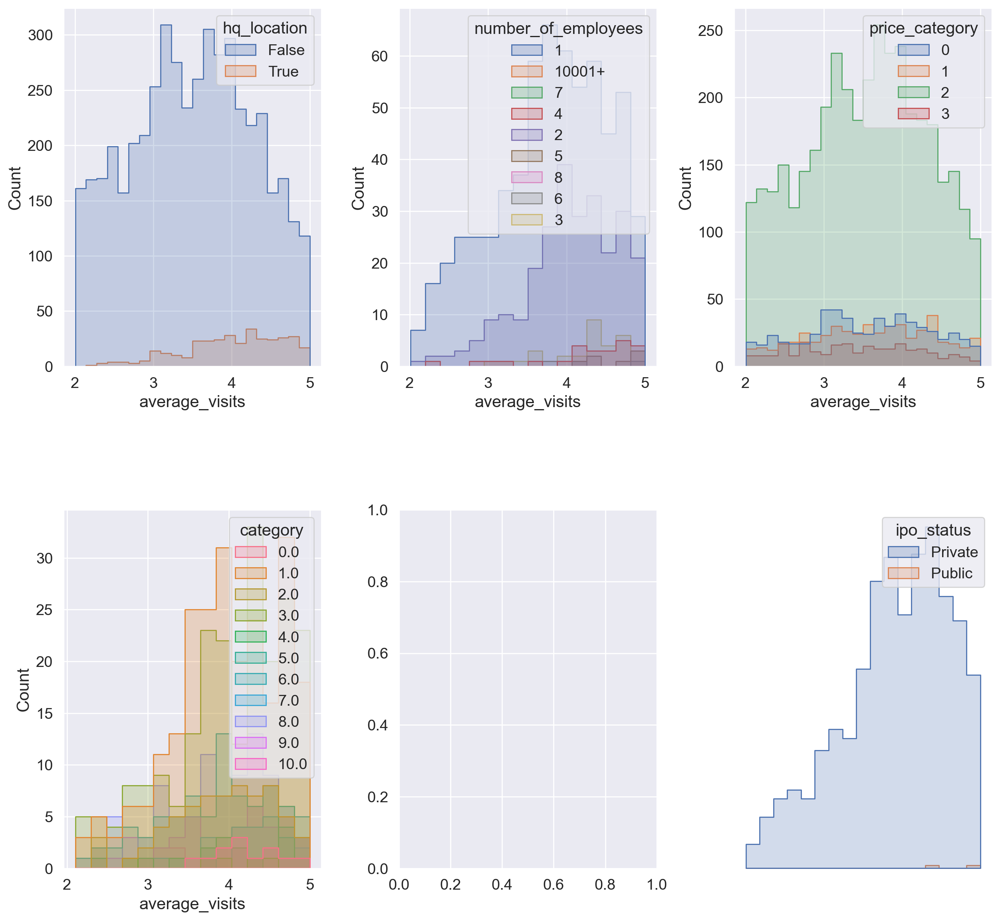

In [5310]:
import seaborn as sns
import seaborn as sns
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(15, 14), dpi=200, gridspec_kw={'hspace': 0.4, 'wspace': 0.3})

sns.histplot(data=c, x="average_visits", hue="hq_location", element="step", ax=axes[0, 0])
sns.histplot(data=c, x="average_visits", hue="number_of_employees", element="step", ax=axes[0, 1])
sns.histplot(data=c, x="average_visits", hue="price_category", element="step", ax=axes[0, 2])
sns.histplot(data=c, x="average_visits", hue="category", element="step", ax=axes[1, 0])
sns.histplot(data=c, x="average_visits", hue="ipo_status", element="step", ax=axes[1, 2])

axes[1, 2].axis('off')  # Empty subplot

plt.show()

In [5311]:
c.shape

(5074, 54)

In [5312]:
#print count values of c hq location
print(c['hq_location'].value_counts())

hq_location
False    4738
True      336
Name: count, dtype: Int64


In [5313]:
b.shape

(5074, 53)

In [5314]:
b.dtypes

price_category                category
price                          float64
freemium                      category
funding_stage                   object
company_type                  category
months_since_founded           float64
months_since_period            float64
average_visits                 float64
merged_months                    int64
category                      category
hq_location                    boolean
saves                          float64
likes                          float64
stars                          float64
number_of_employees           category
helpful_count                  float64
number_of_founders             float64
number_of_investors            float64
number_of_funding_rounds       float64
total_funding_amount           float64
all_time_score                 float64
ipo_status                    category
amount_of_reviews              float64
collaboration_sent             float64
innovative_sent                float64
information_sent         

In [5315]:
b.isnull().sum()

price_category                   0
price                            0
freemium                      3697
funding_stage                 5024
company_type                  4054
months_since_founded          4116
months_since_period            359
average_visits                   0
merged_months                    0
category                      4269
hq_location                      0
saves                          595
likes                            0
stars                            0
number_of_employees           4131
helpful_count                 4561
number_of_founders            4373
number_of_investors              0
number_of_funding_rounds         0
total_funding_amount             0
all_time_score                4567
ipo_status                    4046
amount_of_reviews                0
collaboration_sent            4794
innovative_sent               4733
information_sent              4812
service_sent                  4750
business_development_sent     4747
content_management_s

We will impute some features as there are NaN's

# 7.  Scaling & Test/Train Split

In this step, a datascient needs to perform various tasks such as:
- creating new features from existing ones (requires domain knowledge)
- scaling the features, remember gradient descent method works well when the features are in the same scale 
<br/>
**IMPORTANT**: It is very important to note that we first do feature scaling on the training dataset and use the parameters from the training dataset to scale the test data.

**Train-Test Split**
We generally divide the original dataset randomly into 90/10 split (can also be 80/20% or 95/5% split, depending on the size of the original dataset). 
- *Training dataset*: 90% of the original dataset is used to train the ML model. Traning means estimating the model parameters.
- *Test dataset*: 10% of the original dataset is used to test the trained ML model's peformance. This dataset is sacred! You should not do anything with this other that measuring how well the model is performing. Ideally, this dataset is taken out even before doing the EDA part. So, as an ideal data scientist you should also do the same. Do the EDA on the traning dataset only!

There is another split done to the Training dataset called the *Validation dataset*. From the Traning dataset a part is kept for hyper-parameter tuning. But that is for the next practical session. For now, we will only focus on training and testing.

In [3529]:
df_dummies[selected_features].columns

Index(['price', 'funding_stage', 'merged_months', 'hq_location', 'saves',
       'likes', 'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'amount_of_reviews', 'information', 'design',
       'content_creation', 'customer_support', 'freemium_Yes', 'category_1.0',
       'category_2.0', 'category_3.0', 'category_6.0', 'category_7.0',
       'category_8.0', 'category_9.0', 'category_10.0',
       'number_of_employees_1', 'number_of_employees_4',
       'number_of_employees_2', 'number_of_employees_3'],
      dtype='object')

In [3530]:
# final fatures including target
dummy_features = ['price', 'funding_stage', 'merged_months', 'hq_location', 'saves',
       'likes', 'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'amount_of_reviews', 'information', 'design',
       'content_creation', 'customer_support', 'freemium_Yes', 'category_1.0',
       'category_2.0', 'category_3.0', 'category_6.0', 'category_7.0',
       'category_8.0', 'category_9.0', 'category_10.0',
       'number_of_employees_1', 'number_of_employees_4',
       'number_of_employees_2', 'number_of_employees_3', 'average_visits'
       ]




In [3533]:
import numpy as np
from scipy.stats import yeojohnson
# Apply Yeo-Johnson transformation to selected columns
df_dummies['saves'], _ = yeojohnson(df_dummies['saves'])
df_dummies['likes'], _ = yeojohnson(df_dummies['likes'])
df_dummies['total_funding_amount'], _ = yeojohnson(df_dummies['total_funding_amount'])
df_dummies['amount_of_reviews'], _ = yeojohnson(df_dummies['amount_of_reviews'])
df_dummies['merged_months'], _ = yeojohnson(df_dummies['merged_months'])


import numpy as np

# Aanname: df_dummies is je originele DataFrame
df_log_transformed = df_dummies[selected_features].copy()

exclude_column = 'average_visits'

# Pas logaritmische transformatie toe op elke kolom, behalve 'average_visits'
for column in df_log_transformed.columns:
    if column != exclude_column:
        df_log_transformed[column] = np.log1p(df_log_transformed[column])

# Controleer het getransformeerde DataFrame
print(df_log_transformed.head())


array([[<Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'funding_stage'}>,
        <Axes: title={'center': 'merged_months'}>,
        <Axes: title={'center': 'hq_location'}>,
        <Axes: title={'center': 'saves'}>],
       [<Axes: title={'center': 'likes'}>,
        <Axes: title={'center': 'number_of_investors'}>,
        <Axes: title={'center': 'number_of_funding_rounds'}>,
        <Axes: title={'center': 'total_funding_amount'}>,
        <Axes: title={'center': 'amount_of_reviews'}>],
       [<Axes: title={'center': 'information'}>,
        <Axes: title={'center': 'design'}>,
        <Axes: title={'center': 'content_creation'}>,
        <Axes: title={'center': 'customer_support'}>,
        <Axes: title={'center': 'freemium_Yes'}>],
       [<Axes: title={'center': 'category_1.0'}>,
        <Axes: title={'center': 'category_2.0'}>,
        <Axes: title={'center': 'category_3.0'}>,
        <Axes: title={'center': 'category_6.0'}>,
        <Axes: title={'center': 'c

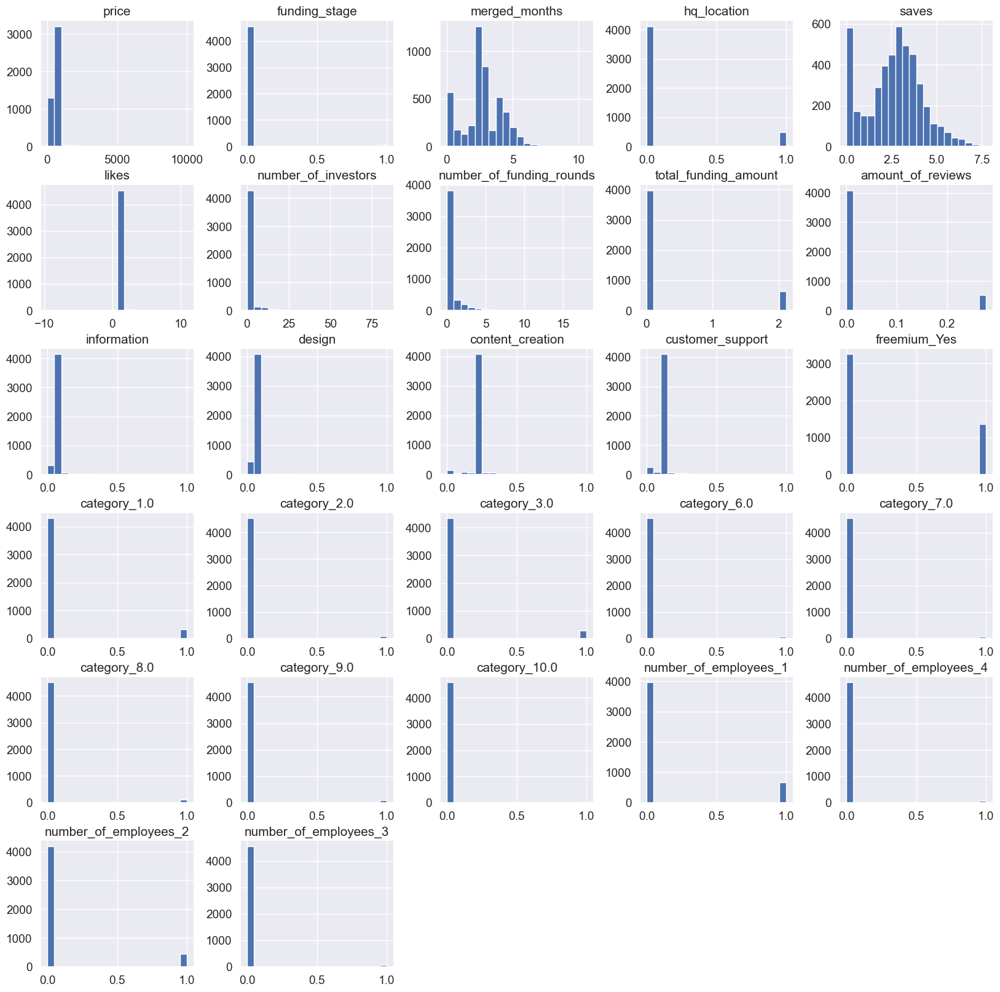

In [2994]:
#plot distribution of every feature in df log transformed
df_dummies[selected_features].hist(figsize=(20, 20), bins=20)

# XG boost algorithm

## XG boost

In [710]:
features = ['price', 'merged_months', 'hq_location', 'saves',
       'likes',
       'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
 'average_topics',
      'sentiment_review',
        'founders_imputed',
       
       'freemium_Yes', 'category_1.0', 'category_2.0',
       'category_3.0', 'category_4.0',
       'category_5.0', 'category_6.0', 'category_7.0', 'category_8.0',
       'category_9.0', 'category_10.0',
       'number_of_employees_labeled_1', 'number_of_employees_labeled_2',
       'number_of_employees_labeled_3', 'number_of_employees_labeled_4',
       'number_of_employees_labeled_5', 'number_of_employees_labeled_6',
       'number_of_employees_labeled_7', 'number_of_employees_labeled_8',
 ]


/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/ipykernel_30831/3702021039.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_dummies['average_visits'], bins=40)
/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


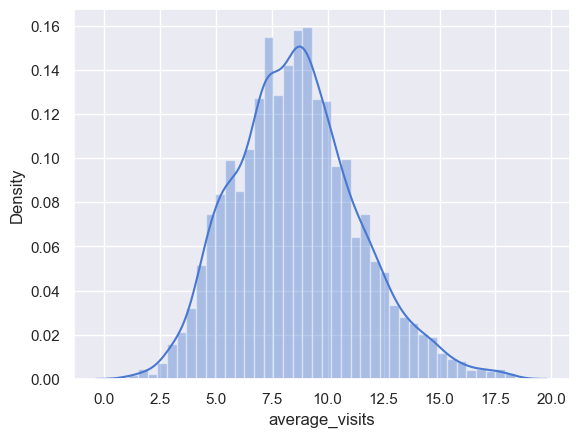

In [708]:
#print distribution of average visits
import seaborn as sns
sns.distplot(df_dummies['average_visits'], bins=40)
plt.show()

In [472]:
#import xgbregrressor and dummy regressor
from xgboost import XGBRegressor
from sklearn.dummy import DummyRegressor

Training Set Mean Squared Error: 4.003228587822249
Test Set Mean Squared Error: 4.939626163365037
Baseline Model Mean Squared Error: 7.564485906496965
Training Set R^2 Score: 0.48257088481939625
Test Set R^2 Score: 0.3451991569949193
Training Set Mean Absolute Error: 1.5610009578825683
Test Set Mean Absolute Error: 1.736230697074813
Cross-validation scores (neg MSE): [-4.84861277 -4.39622872 -4.50277616 -4.80172429 -4.77281725]
Gemiddelde Cross-validation score (MSE): 4.664431839776496
Model Complexity - aantal features: 32
Aantal bomen (n_estimators) in het model: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_ca

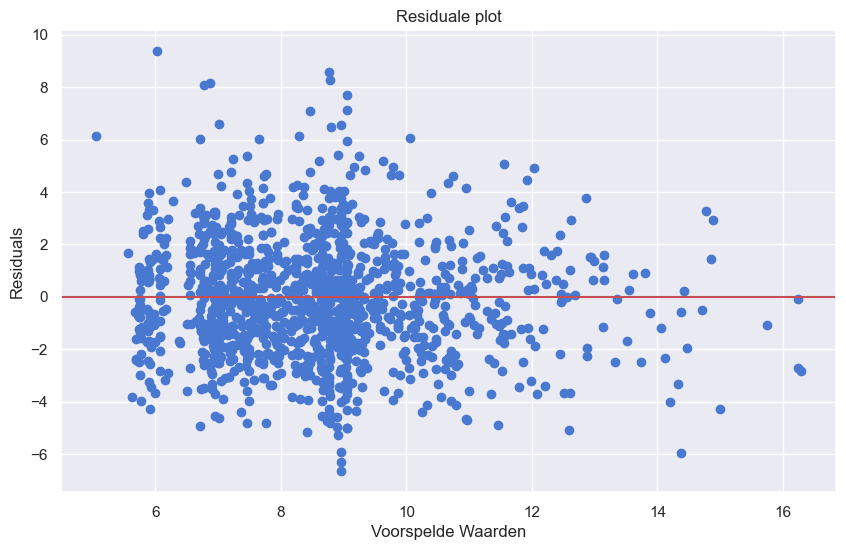

Shapiro-Wilk Test: Statistics=0.988, p=0.000
p-value van Breusch-Pagan test is 0.0000, f-test p-value is 0.0000


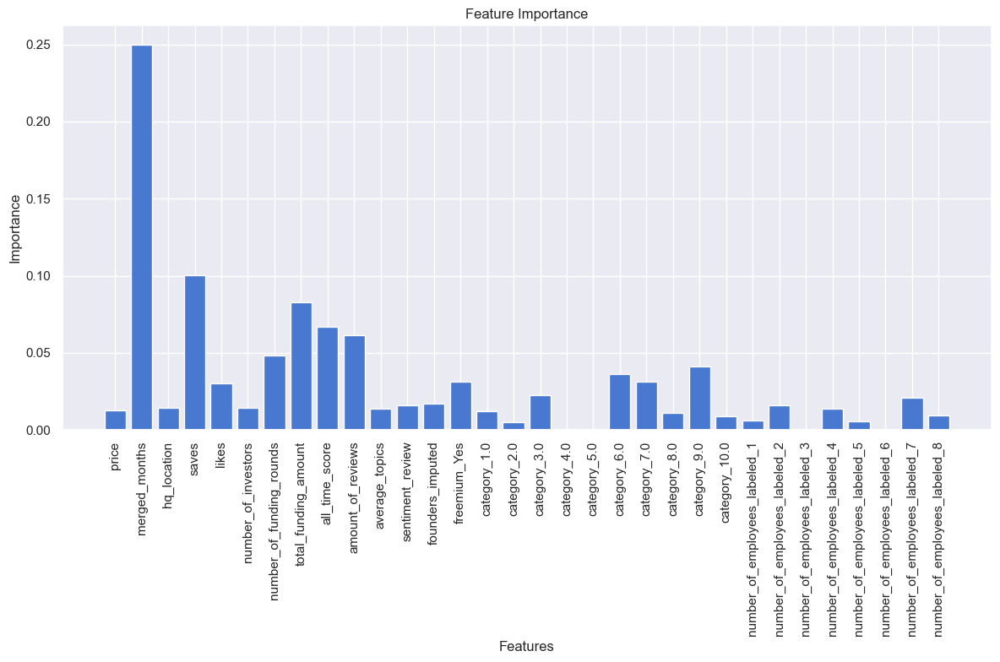

In [713]:
# Train een XGBoost-model
xgb_model = XGBRegressor(n_estimators=100, gamma = 0.1,  max_depth=4, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train, y_train)
y_dummy_pred = dummy_regressor.predict(X_test)

# Prestatiemetingen
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
mae_train = mean_absolute_error(y_train, y_pred_train)
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_dummy = mean_squared_error(y_test, y_dummy_pred)

print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)

# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X, y, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train.shape[1])
print("Aantal bomen (n_estimators) in het model:", xgb_model.get_params())

# Residuale analyse
residuals = y_test - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()

# Normaliteit van de residuals: Shapiro-Wilk test
from scipy.stats import shapiro
stat, p = shapiro(residuals)
print('Shapiro-Wilk Test: Statistics=%.3f, p=%.3f' % (stat, p))

# Homoscedasticiteit van de residuals: Breusch-Pagan test
from statsmodels.stats.diagnostic import het_breuschpagan
_, pval, _, f_pval = het_breuschpagan(residuals, X_test)
print(f'p-value van Breusch-Pagan test is {pval:.4f}, f-test p-value is {f_pval:.4f}')

# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()


## B dataset

In [449]:
b.shape

(25233, 41)

In [468]:
b.head()

,price_category,price,freemium,average_visits,merged_months,category,hq_location,saves,likes,stars,...,Topic_11,Topic_12,Topic_13,Topic_14,sentiment_filtered,sentiment_per_sentence,sentiment_review,dominant_topic,sentiment_score,average_sentiment_per_sentence
0,2,858.685636,New_Category,14.896696,0,NaN,False,NaN,2.4451,3.815774,...,0.0,0.0,0.0,0.0,0.000000,[0.0],NaN,8,0.000000,0.000000
1,1,39.000000,New_Category,6.388561,6,NaN,False,3.0,2.4451,5.000000,...,NaN,NaN,NaN,NaN,0.000000,[0.0],NaN,4,0.000000,0.000000
2,2,858.685636,New_Category,16.571669,115,9.0,False,2.0,2.4451,3.815774,...,0.0,0.0,0.0,0.0,0.423012,"[0.0, 0.4, 0.625, 0.9099999999999999, 0.450000...",0.70,2,0.666667,0.409472
3,2,858.685636,New_Category,16.571669,115,9.0,False,2.0,2.4451,3.815774,...,0.0,0.0,0.0,0.0,0.423012,"[0.0, 0.4, 0.625, 0.9099999999999999, 0.450000...",0.58,4,0.000000,0.409472
4,2,858.685636,New_Category,16.571669,115,9.0,False,2.0,2.4451,3.815774,...,0.0,0.0,0.0,0.0,0.423012,"[0.0, 0.4, 0.625, 0.9099999999999999, 0.450000...",0.40,9,0.000000,0.409472


In [472]:
from sklearn.preprocessing import power_transform
import pandas as pd

# Maak een kopie van de DataFrame 'd'
df_transformedb = b.copy()

# Lijst van numerieke kolommen die niet dummies of booleaans zijn
numeric_cols = ['price', 'merged_months', 'saves', 'likes', 
                'stars', 'helpful_count', 'number_of_founders', 'number_of_investors',
                'number_of_funding_rounds', 'total_funding_amount', 'all_time_score',
                'amount_of_reviews', 'average_topics', 'Topic_1', 'Topic_2', 'Topic_3',
                'Topic_4', 'Topic_5', 'Topic_6', 'Topic_7', 'Topic_8', 'Topic_9', 
                'Topic_10', 'Topic_11', 'Topic_12', 'Topic_13', 'Topic_14', 
                'sentiment_filtered', 'sentiment_review', 'sentiment_score', 
                'average_sentiment_per_sentence']

# Voor elke numerieke kolom, pas de Yeo-Johnson transformatie toe
for column in numeric_cols:
    # Shift data om geen negatieve waarden te hebben indien nodig
    # We hoeven niet te verschuiven voor Yeo-Johnson zoals we zouden doen voor Box-Cox
    # Controleer op null-waarden en sla de kolom over als deze bestaat
    if df_transformedb[column].isnull().any():
        continue
    
    # Houd enkel de niet-null waarden voor transformatie
    non_null_data = df_transformedb[column].dropna()
    
    # Pas de transformatie toe
    transformed_data = power_transform(non_null_data.values.reshape(-1, 1), method='yeo-johnson')
    
    # Vervang de oorspronkelijke data met de getransformeerde waarden
    df_transformedb.loc[non_null_data.index, column] = transformed_data.ravel()

# Check de getransformeerde DataFrame
df_transformedb.head()


Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[-2.05117765 -1.057453    1.79183502 ... -0.67064984  0.92732496
 -0.73715671]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.


,price_category,price,freemium,average_visits,merged_months,category,hq_location,saves,likes,stars,...,Topic_11,Topic_12,Topic_13,Topic_14,sentiment_filtered,sentiment_per_sentence,sentiment_review,dominant_topic,sentiment_score,average_sentiment_per_sentence
0,2,0.790392,New_Category,14.896696,-2.051178,NaN,False,NaN,0.067376,-0.255900,...,0.0,0.0,0.0,0.0,-1.561263,[0.0],NaN,8,-0.593700,-1.540967
1,1,-0.984430,New_Category,6.388561,-1.057453,NaN,False,3.0,0.067376,1.973478,...,NaN,NaN,NaN,NaN,-1.561263,[0.0],NaN,4,-0.593700,-1.540967
2,2,0.790392,New_Category,16.571669,1.791835,9.0,False,2.0,0.067376,-0.255900,...,0.0,0.0,0.0,0.0,1.121039,"[0.0, 0.4, 0.625, 0.9099999999999999, 0.450000...",0.70,2,1.915166,1.411469
3,2,0.790392,New_Category,16.571669,1.791835,9.0,False,2.0,0.067376,-0.255900,...,0.0,0.0,0.0,0.0,1.121039,"[0.0, 0.4, 0.625, 0.9099999999999999, 0.450000...",0.58,4,-0.593700,1.411469
4,2,0.790392,New_Category,16.571669,1.791835,9.0,False,2.0,0.067376,-0.255900,...,0.0,0.0,0.0,0.0,1.121039,"[0.0, 0.4, 0.625, 0.9099999999999999, 0.450000...",0.40,9,-0.593700,1.411469


In [451]:
b.dtypes
#df_transformedb.drop(['sentiment_per_sentence'], axis=1, inplace=True)

In [453]:
df_transformedb.sample(10)

,price_category,price,freemium,average_visits,merged_months,category,hq_location,saves,likes,stars,...,Topic_10,Topic_11,Topic_12,Topic_13,Topic_14,sentiment_filtered,sentiment_review,dominant_topic,sentiment_score,average_sentiment_per_sentence
15964,2,0.790392,Yes,15.572723,0.519043,9.0,True,37.0,-0.452230,-2.453749,...,0.0,0.0,0.0,0.0,0.0,0.630026,0.137500,0,-0.593700,0.933261
23278,0,-1.390770,Yes,11.439505,0.355621,3.0,False,47.0,-1.991189,0.047439,...,0.0,0.0,0.0,0.0,1.0,0.938476,0.000000,9,-0.593700,0.754068
15275,2,0.790392,New_Category,9.491073,-0.245347,6.0,True,18.0,0.067376,-0.255900,...,0.0,0.0,0.0,0.0,0.0,-1.561263,NaN,0,-0.593700,-1.540967
6731,1,-1.068157,New_Category,14.465946,-0.039359,2.0,False,24.0,-0.452230,-1.416005,...,NaN,NaN,NaN,NaN,NaN,0.340569,0.000000,8,-0.593700,0.135939
21531,1,-1.110785,No,15.199323,1.117557,3.0,True,86.0,-1.991189,-1.416005,...,NaN,NaN,NaN,NaN,NaN,-0.562128,-0.052381,12,-0.593700,-0.443469
19376,2,0.790392,New_Category,18.330443,-0.039359,NaN,False,8.0,0.067376,-0.255900,...,0.0,0.0,0.0,0.0,0.0,0.214147,0.000000,0,-0.593700,0.283806
23723,2,0.339717,New_Category,6.490724,-2.051178,NaN,False,22.0,0.067376,1.973478,...,NaN,NaN,NaN,NaN,NaN,1.099651,0.365394,10,1.732321,1.139087
11468,0,-1.256312,Yes,15.310464,0.412078,8.0,False,40.0,0.067376,1.973478,...,0.0,0.0,0.0,0.0,0.0,0.408761,0.000000,0,-0.593700,0.445835
14743,0,-1.390770,Yes,17.085869,1.256334,9.0,True,27.0,0.067376,-0.255900,...,NaN,NaN,NaN,NaN,NaN,0.517286,0.000000,13,-0.593700,0.457090
14988,2,0.790392,New_Category,10.782616,-2.051178,NaN,False,NaN,0.067376,-0.255900,...,0.0,0.0,0.0,0.0,1.0,-0.021629,0.151667,8,-0.593700,-0.304800


In [466]:
#b to dummies
dum = pd.get_dummies(df_transformedb, drop_first=True)

In [467]:
dum.columns

Index(['price', 'average_visits', 'merged_months', 'hq_location', 'saves',
       'likes', 'stars', 'helpful_count', 'number_of_founders',
       'number_of_investors',
       ...
       'dominant_topic_5', 'dominant_topic_6', 'dominant_topic_7',
       'dominant_topic_8', 'dominant_topic_9', 'dominant_topic_10',
       'dominant_topic_11', 'dominant_topic_12', 'dominant_topic_13',
       'dominant_topic_14'],
      dtype='object', length=765)

In [757]:
#dum.columns

In [770]:

target = 'average_visits'

features = [
    'price', 'merged_months', 'hq_location', 'saves',
       'likes', 'stars', 'helpful_count', 'number_of_founders',
       'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
       'num_topics', 'average_topics', 'Topic_0', 'Topic_1', 'Topic_2',
       'Topic_3', 'Topic_4', 'Topic_5', 'Topic_6', 'Topic_7', 'Topic_8',
       'Topic_9', 'Topic_10', 'Topic_11', 'Topic_12', 'Topic_13', 'Topic_14',
       'sentiment_filtered', 'sentiment_review', 'sentiment_score',
       'average_sentiment_per_sentence', 'price_category_1',
       'price_category_2', 'price_category_3', 'freemium_Yes',
       'freemium_New_Category', 'category_1.0', 'category_2.0', 'category_3.0',
       'category_4.0', 'category_5.0', 'category_6.0', 'category_7.0',
       'category_8.0', 'category_9.0', 'category_10.0',
       'number_of_employees_10001+', 'number_of_employees_1001-5000',
       'number_of_employees_101-250', 'number_of_employees_11-50',
       'number_of_employees_251-500', 'number_of_employees_5001-10000',
       'number_of_employees_501-1000', 'number_of_employees_51-100',
       'dominant_topic_1', 'dominant_topic_2', 'dominant_topic_3',
       'dominant_topic_4', 'dominant_topic_5', 'dominant_topic_6',
       'dominant_topic_7', 'dominant_topic_8', 'dominant_topic_9',
       'dominant_topic_10', 'dominant_topic_11', 'dominant_topic_12',
       'dominant_topic_13', 'dominant_topic_14'
 ]


# Split the data into train and test sets
X = dum[features]
y = dum[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Data Scaling
## StandardScaler is used to scale the data to have zero mean and unit variance, which is often a good practice for many machine learning algorithms.
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# XGBoost Model Training
## XGBoost is an efficient and scalable implementation of gradient boosting that can be used for regression and classification problems.
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', n_jobs = 8) # Add your parameters here

# Hyperparameter Tuning (optional)
## Define a parameter grid to search for the best parameters for XGBoost
param_grid = {
    'max_depth': [3, 4, 5, 6],
    'n_estimators': [ 200, 400, 600],
    'learning_rate': [0.01, 0.1, 0.2],
    'gamma': [0, 0.1, 0.2],
    'min_child_weight': [1, 2, 3],
    'subsample': [0.6, 0.7, 0.8],
    'colsample_bytree': [0.6, 0.7, 0.8],
    'reg_lambda': [0, 1, 2],
    'reg_alpha': [0, 0.1, 0.2]
}


grid_search = GridSearchCV(estimator=xg_reg, param_grid=param_grid, cv=2, n_jobs=8, verbose=2)
grid_search.fit(X_train_scaled, y_train)

#print parameters
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)
print("Best estimator: ", grid_search.best_estimator_)
print("Best index: ", grid_search.best_index_)
print("Refit time: ", grid_search.refit_time_)


Fitting 2 folds for each of 26244 candidates, totalling 52488 fits


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.6; total time=   1.2s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.6; total time=   1.2s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.7; total time=   1.2s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.8; total time=   1.2s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.7; total time=   1.2s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, su

/Users/macbook/anaconda3/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.6; total time=   2.0s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   2.0s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.7; total time=   2.0s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   2.0s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=0.8; total time=   2.0s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=0.1, reg_

In [473]:
target = 'average_visits'

features = ['price', 'merged_months', 'hq_location', 'saves',
       'likes', 'stars', 'helpful_count', 'number_of_founders',
       'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
       'num_topics', 'average_topics', 'Topic_0', 'Topic_1', 'Topic_2',
       'Topic_3', 'Topic_4', 'Topic_5', 'Topic_6', 'Topic_7', 'Topic_8',
       'Topic_9', 'Topic_10', 'Topic_11', 'Topic_12', 'Topic_13', 'Topic_14',
       'sentiment_filtered', 'sentiment_review', 'sentiment_score', 'sentiment_per_sentence',
       'average_sentiment_per_sentence', 'price_category_1',
       'price_category_2', 'price_category_3', 'freemium_Yes',
       'freemium_New_Category', 'category_1.0', 'category_2.0', 'category_3.0',
       'category_4.0', 'category_5.0', 'category_6.0', 'category_7.0',
       'category_8.0', 'category_9.0', 'category_10.0',
       'number_of_employees_10001+', 'number_of_employees_1001-5000',
       'number_of_employees_101-250', 'number_of_employees_11-50',
       'number_of_employees_251-500', 'number_of_employees_5001-10000',
       'number_of_employees_501-1000', 'number_of_employees_51-100',
       'dominant_topic_1', 'dominant_topic_2', 'dominant_topic_3',
       'dominant_topic_4', 'dominant_topic_5', 'dominant_topic_6',
       'dominant_topic_7', 'dominant_topic_8', 'dominant_topic_9',
       'dominant_topic_10', 'dominant_topic_11', 'dominant_topic_12',
       'dominant_topic_13', 'dominant_topic_14'
 ]


In [471]:
dum.columns

Index(['price', 'average_visits', 'merged_months', 'hq_location', 'saves',
       'likes', 'stars', 'helpful_count', 'number_of_founders',
       'number_of_investors',
       ...
       'dominant_topic_5', 'dominant_topic_6', 'dominant_topic_7',
       'dominant_topic_8', 'dominant_topic_9', 'dominant_topic_10',
       'dominant_topic_11', 'dominant_topic_12', 'dominant_topic_13',
       'dominant_topic_14'],
      dtype='object', length=765)

In [474]:

# Split the data into train and test sets
X = dum[features]
y = dum[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train een XGBoost-model
xgb_model = XGBRegressor(colsample_bytree =0.6, gamma =0.2, learning_rate = 0.1, max_depth= 6, 
                         min_child_weight = 1, n_estimators = 200, reg_alpha = 0.2, 
                         reg_lambda = 2, subsample = 0.8, random_state=42)
xgb_model.fit(X_train, y_train)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train, y_train)
y_dummy_pred = dummy_regressor.predict(X_test)

# Prestatiemetingen
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
mae_train = mean_absolute_error(y_train, y_pred_train)
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_dummy = mean_squared_error(y_test, y_dummy_pred)

print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)

# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X, y, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train.shape[1])
print(xgb_model.get_params())

# Residuale analyse
residuals = y_test - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()

# Normaliteit van de residuals: Shapiro-Wilk test
from scipy.stats import shapiro
stat, p = shapiro(residuals)
print('Shapiro-Wilk Test: Statistics=%.3f, p=%.3f' % (stat, p))

# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()


KeyError: "['sentiment_per_sentence'] not in index"

## New analysis

In [221]:
from sklearn.preprocessing import power_transform
import pandas as pd

# Maak een kopie van de DataFrame 'd'
df_transformed = c.copy()

# Lijst van numerieke kolommen die niet dummies of booleaans zijn
numeric_cols = ['price', 'merged_months', 'saves', 'likes', 
                'stars', 'helpful_count', 'number_of_founders', 'number_of_investors',
                'number_of_funding_rounds', 'total_funding_amount', 'all_time_score',
                'amount_of_reviews', 'average_topics', 'Topic_1', 'Topic_2', 'Topic_3',
                'Topic_4', 'Topic_5', 'Topic_6', 'Topic_7', 'Topic_8', 'Topic_9', 
                'Topic_10', 'Topic_11', 'Topic_12', 'Topic_13', 'Topic_14', 
                'sentiment_filtered', 'sentiment_review', 'sentiment_score', 
                'average_sentiment_per_sentence']

# Voor elke numerieke kolom, pas de Yeo-Johnson transformatie toe
for column in numeric_cols:
    # Shift data om geen negatieve waarden te hebben indien nodig
    # We hoeven niet te verschuiven voor Yeo-Johnson zoals we zouden doen voor Box-Cox
    # Controleer op null-waarden en sla de kolom over als deze bestaat
    if df_transformed[column].isnull().any():
        continue
    
    # Houd enkel de niet-null waarden voor transformatie
    non_null_data = df_transformed[column].dropna()
    
    # Pas de transformatie toe
    transformed_data = power_transform(non_null_data.values.reshape(-1, 1), method='yeo-johnson')
    
    # Vervang de oorspronkelijke data met de getransformeerde waarden
    df_transformed.loc[non_null_data.index, column] = transformed_data.ravel()

# Check de getransformeerde DataFrame
df_transformed.head()


/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/ipykernel_94271/661439212.py:32: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[-1.89097802 -0.26830952  2.43284753 ...  0.21480708  1.7680297
  0.13578146]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_transformed.loc[non_null_data.index, column] = transformed_data.ravel()


,price_category,price,freemium,funding_stage,company_type,months_since_founded,months_since_period,average_visits,merged_months,category,...,Topic_12,Topic_13,Topic_14,sentiment_filtered,sentiment_review,dominant_topic,sentiment_score,average_sentiment_per_sentence,number_of_employees_labeled,founders_imputed
0,2,0.488103,no_category,False,no_category,NaN,NaN,14.896696,-1.890978,3.918725,...,-0.202634,-0.186737,-0.269146,-0.290694,-0.250377,8,-0.611012,-0.286509,9,1.997295
1,1,-1.497984,no_category,False,no_category,NaN,6.0,6.388561,-0.268310,3.918725,...,-0.202634,-0.186737,-0.269146,-0.290694,-0.250377,4,-0.611012,-0.286509,9,1.997295
2,2,0.488103,no_category,False,For Profit,224.0,8.0,16.571669,2.432848,9.000000,...,-0.202634,-0.186737,-0.269146,2.685859,3.687336,2,1.877117,2.637757,5,1.000000
21,2,0.488103,Yes,False,no_category,NaN,24.0,7.810353,0.897672,3.918725,...,-0.202634,-0.186737,-0.269146,-0.290694,-0.250377,0,-0.611012,-0.286509,9,1.997295
22,0,-1.710306,Yes,False,no_category,NaN,5.0,4.867534,-0.403700,3.918725,...,4.935011,-0.186737,-0.269146,-0.290694,-0.250377,12,-0.611012,-0.286509,9,1.997295


In [222]:
#c use one hot encoding
d = pd.get_dummies(df_transformed, drop_first=True)

In [225]:
#xgb import
import xgboost as xgb

In [226]:
featuresdum = ['merged_months',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
       'num_topics', 'average_topics', 'Topic_0', 'Topic_1', 'Topic_2',
       'Topic_3', 'Topic_4', 'Topic_5', 'Topic_6', 'Topic_7', 'Topic_8',
       'Topic_9', 'Topic_10', 'Topic_11', 'Topic_12', 'Topic_13', 'Topic_14',
       'sentiment_filtered', 'sentiment_review', 'sentiment_score',
       'average_sentiment_per_sentence', 'price_category_1',
       'price_category_2', 'price_category_3', 'freemium_Yes', 'category_1.0', 'category_2.0', 'category_3.0',
       'category_4.0', 'category_5.0', 'category_6.0', 'category_7.0',
       'category_8.0', 'category_9.0', 'category_10.0',
       'number_of_employees_10001+', 'number_of_employees_1001-5000',
       'number_of_employees_101-250', 'number_of_employees_11-50',
       'number_of_employees_251-500', 'number_of_employees_5001-10000',
       'number_of_employees_501-1000', 'number_of_employees_51-100',
       'dominant_topic_1', 'dominant_topic_2', 'dominant_topic_3',
       'dominant_topic_4', 'dominant_topic_5', 'dominant_topic_6',
       'dominant_topic_7', 'dominant_topic_8', 'dominant_topic_9',
       'dominant_topic_10', 'dominant_topic_11', 'dominant_topic_12',
       'dominant_topic_13', 'dominant_topic_14']

target = 'average_visits'

# Split the data into train and test sets
X =  d[featuresdum]
y =  d[target]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', n_jobs = 8) # Add your parameters here

# Hyperparameter Tuning (optional)
## Define a parameter grid to search for the best parameters for XGBoost
param_grid = {
    'max_depth': [3, 4, 5, 6],
    'n_estimators': [ 200, 400, 600],
    #'learning_rate': [0.01, 0.1, 0.2],
    'gamma': [0, 0.1, 0.2],
    #'min_child_weight': [1, 2, 3],
    #'subsample': [0.6, 0.7, 0.8],
    #'colsample_bytree': [0.6, 0.7, 0.8],
   # 'reg_lambda': [0, 1, 2],
   # 'reg_alpha': [0, 0.1, 0.2]
}


grid_search = GridSearchCV(estimator=xg_reg, param_grid=param_grid, cv=4, n_jobs=8, verbose=2)
grid_search.fit(X_train, y_train)

#print parameters
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)
print("Best estimator: ", grid_search.best_estimator_)
print("Best index: ", grid_search.best_index_)
print("Refit time: ", grid_search.refit_time_)

NameError: name 'GridSearchCV' is not defined

In [486]:
featuresdum = ['merged_months',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
       'num_topics', 'average_topics', 'Topic_0', 'Topic_1', 'Topic_2',
       'Topic_3', 'Topic_4', 'Topic_5', 'Topic_6', 'Topic_7', 'Topic_8',
       'Topic_9', 'Topic_10', 'Topic_11', 'Topic_12', 'Topic_13', 'Topic_14',
       'sentiment_filtered', 'sentiment_review', 'sentiment_score',
       'average_sentiment_per_sentence', 'price_category_1',
       'price_category_2', 'price_category_3', 'freemium_Yes', 'category_1.0', 'category_2.0', 'category_3.0',
       'category_4.0', 'category_5.0', 'category_6.0', 'category_7.0',
       'category_8.0', 'category_9.0', 'category_10.0',
       'number_of_employees_10001+', 'number_of_employees_1001-5000',
       'number_of_employees_101-250', 'number_of_employees_11-50',
       'number_of_employees_251-500', 'number_of_employees_5001-10000',
       'number_of_employees_501-1000', 'number_of_employees_51-100',
       'dominant_topic_1', 'dominant_topic_2', 'dominant_topic_3',
       'dominant_topic_4', 'dominant_topic_5', 'dominant_topic_6',
       'dominant_topic_7', 'dominant_topic_8', 'dominant_topic_9',
       'dominant_topic_10', 'dominant_topic_11', 'dominant_topic_12',
       'dominant_topic_13', 'dominant_topic_14']

target = 'average_visits'

# Split the data into train and test sets
X =  d[featuresdum]
y =  d[target]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', n_jobs = 8) # Add your parameters here

# Hyperparameter Tuning (optional)
## Define a parameter grid to search for the best parameters for XGBoost
param_grid = {
    'max_depth': [3, 4, 5, 6],
    'n_estimators': [ 200, 400, 600],
    #'learning_rate': [0.01, 0.1, 0.2],
    'gamma': [0, 0.1, 0.2],
    #'min_child_weight': [1, 2, 3],
    #'subsample': [0.6, 0.7, 0.8],
    #'colsample_bytree': [0.6, 0.7, 0.8],
   # 'reg_lambda': [0, 1, 2],
   # 'reg_alpha': [0, 0.1, 0.2]
}


grid_search = GridSearchCV(estimator=xg_reg, param_grid=param_grid, cv=4, n_jobs=8, verbose=2)
grid_search.fit(X_train, y_train)

#print parameters
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)
print("Best estimator: ", grid_search.best_estimator_)
print("Best index: ", grid_search.best_index_)
print("Refit time: ", grid_search.refit_time_)

Fitting 4 folds for each of 36 candidates, totalling 144 fits


[CV] END .............gamma=0, max_depth=3, n_estimators=200; total time=   1.1s
[CV] END .............gamma=0, max_depth=3, n_estimators=200; total time=   1.1s
[CV] END .............gamma=0, max_depth=3, n_estimators=200; total time=   1.1s
[CV] END .............gamma=0, max_depth=3, n_estimators=200; total time=   1.1s
[CV] END .............gamma=0, max_depth=3, n_estimators=400; total time=   2.1s
[CV] END .............gamma=0, max_depth=3, n_estimators=400; total time=   2.1s
[CV] END .............gamma=0, max_depth=3, n_estimators=400; total time=   2.1s
[CV] END .............gamma=0, max_depth=3, n_estimators=400; total time=   2.2s
[CV] END .............gamma=0, max_depth=4, n_estimators=200; total time=   1.6s
[CV] END .............gamma=0, max_depth=4, n_estimators=200; total time=   1.6s
[CV] END .............gamma=0, max_depth=4, n_estimators=200; total time=   1.6s
[CV] END .............gamma=0, max_depth=4, n_estimators=200; total time=   1.6s
[CV] END .............gamma=

Training Set RMSE: 2.0101340189190564
Test Set RMSE: 2.3331645428005485
Training Set MAPE: 21.86925568534711
Test Set MAPE: 25.826417230836018
Training Set Mean Squared Error: 4.040638774015677
Test Set Mean Squared Error: 5.443656783781693
Baseline Model Mean Squared Error: 7.608820908640808
Training Set R^2 Score: 0.47961947508658065
Test Set R^2 Score: 0.28402171843362567
Training Set Mean Absolute Error: 1.5381436852943597
Test Set Mean Absolute Error: 1.8365345564146485
Cross-validation scores (neg MSE): [-5.61848498 -5.0839204  -5.22308789 -5.23627432 -5.50270982]
Gemiddelde Cross-validation score (MSE): 5.332895481377462
Model Complexity - aantal features: 61
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 

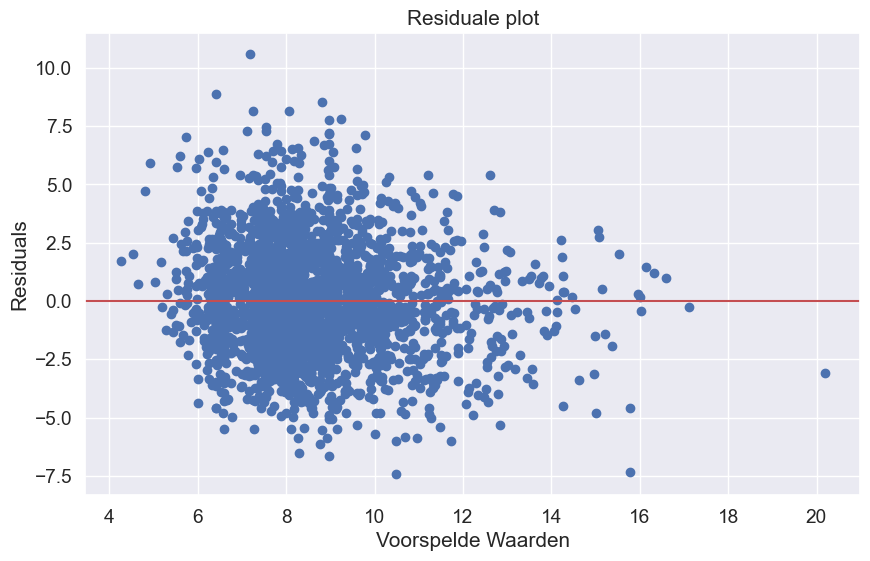

Shapiro-Wilk Test: Statistics=0.994, p=0.000


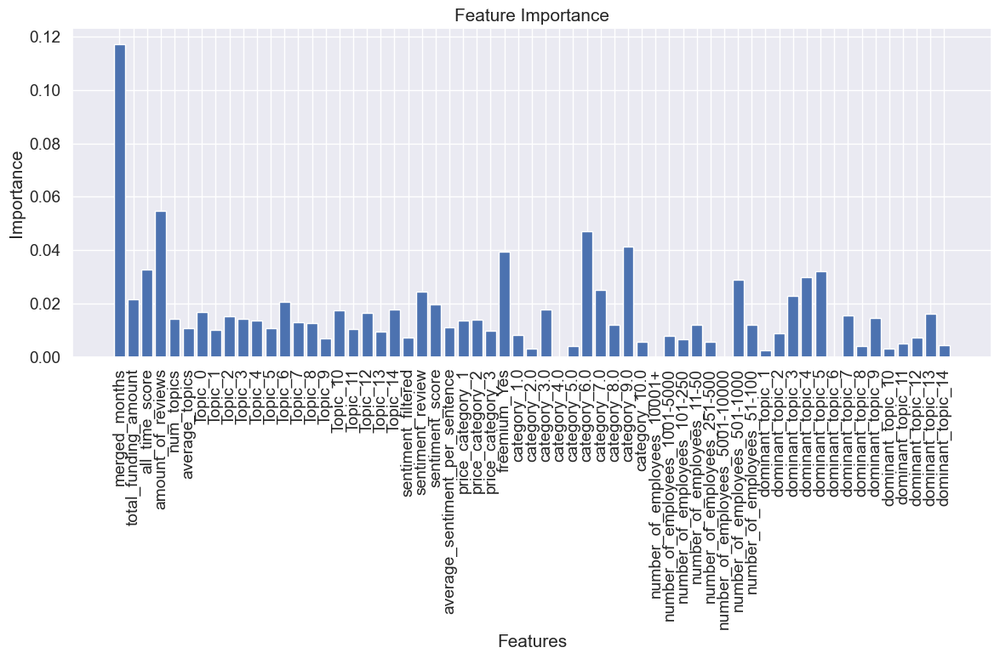

In [490]:

# Train een XGBoost-model
xgb_model = XGBRegressor(random_state=42, max_depth= 3, n_estimators = 200, reg_lambda = 2, )
xgb_model.fit(X_train, y_train)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train, y_train)
y_dummy_pred = dummy_regressor.predict(X_test)

# Prestatiemetingen
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
mae_train = mean_absolute_error(y_train, y_pred_train)
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_dummy = mean_squared_error(y_test, y_dummy_pred)
# Bereken RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

# Bereken MAPE
mape_train = np.mean(np.abs((y_train - y_pred_train) / y_train)) * 100
mape_test = np.mean(np.abs((y_test - y_pred_test) / y_test)) * 100

print("Training Set RMSE:", rmse_train)
print("Test Set RMSE:", rmse_test)
print("Training Set MAPE:", mape_train)
print("Test Set MAPE:", mape_test)
print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)


# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X, y, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train.shape[1])
print(xgb_model.get_params())

# Residuale analyse
residuals = y_test - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()

# Normaliteit van de residuals: Shapiro-Wilk test
from scipy.stats import shapiro
stat, p = shapiro(residuals)
print('Shapiro-Wilk Test: Statistics=%.3f, p=%.3f' % (stat, p))

# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()

## third iteration models



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


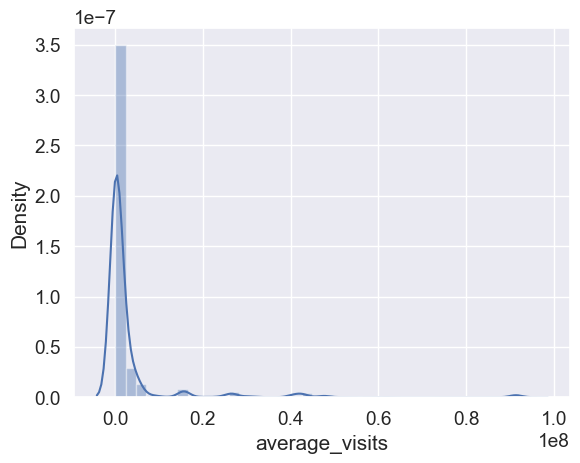

In [491]:
#transform logatirhmic scale from average visits to normal scale and print distribution
import seaborn as sns
sns.distplot(np.exp(b['average_visits']), bins=40)
plt.show()



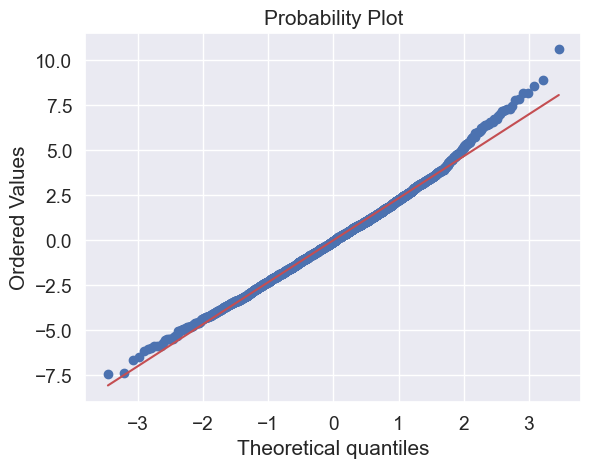

In [493]:
# QQ plot
from scipy import stats
stats.probplot(residuals, plot=plt)
plt.show()



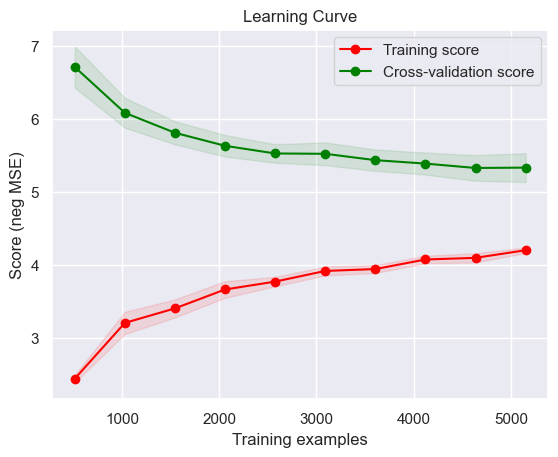

In [333]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt

# Bepaal de trainingsgroottes en ontvang de scores
train_sizes, train_scores, val_scores = learning_curve(xgb_model, X, y, cv=5, scoring='neg_mean_squared_error',
                                                       train_sizes=np.linspace(0.1, 1.0, 10))

# Bereken de gemiddelde en standaardafwijking van de trainings- en validatiescores
train_scores_mean = -train_scores.mean(axis=1)
train_scores_std = train_scores.std(axis=1)
val_scores_mean = -val_scores.mean(axis=1)
val_scores_std = val_scores.std(axis=1)

# Plot de learning curve
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, val_scores_mean - val_scores_std,
                 val_scores_mean + val_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, val_scores_mean, 'o-', color="g", label="Cross-validation score")

plt.title("Learning Curve")
plt.xlabel("Training examples")
plt.ylabel("Score (neg MSE)")
plt.legend(loc="best")
plt.show()

In [326]:
import shap

In [494]:

# compute SHAP values
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

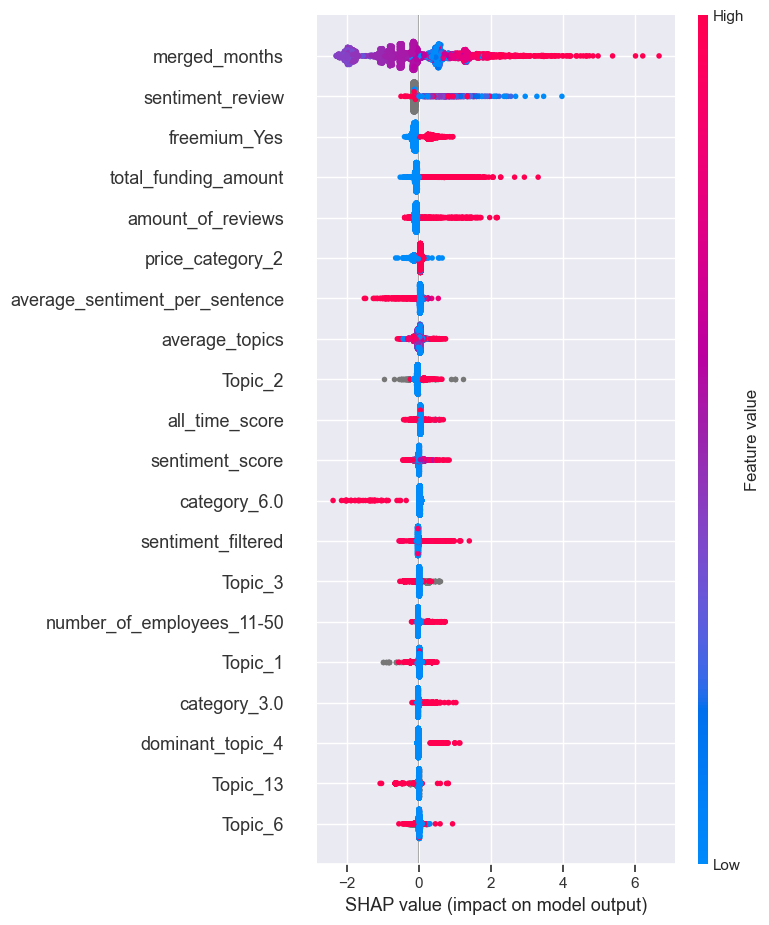

In [495]:
shap.summary_plot(shap_values, X_train)

In [619]:
# For a global summary of feature importance
shap.summary_plot(shap_values, X_train, plot_type="bar")

AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

## frouth iteration

In [223]:
featuresdum = ['merged_months',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
       'num_topics', 'average_topics', 'Topic_0', 'Topic_1', 'Topic_2',
       'Topic_3', 'Topic_4', 'Topic_5', 'Topic_6', 'Topic_7', 'Topic_8',
       'Topic_9', 'Topic_10', 'Topic_11', 'Topic_12', 'Topic_13', 'Topic_14',
       'sentiment_filtered', 'sentiment_review', 'sentiment_score',
       'average_sentiment_per_sentence', 'price_category_1',
       'price_category_2', 'price_category_3', 'freemium_Yes', 'category_1.0', 'category_2.0', 'category_3.0',
       'category_4.0', 'category_5.0', 'category_6.0', 'category_7.0',
       'category_8.0', 'category_9.0', 'category_10.0',
       'number_of_employees_10001+', 'number_of_employees_1001-5000',
       'number_of_employees_101-250', 'number_of_employees_11-50',
       'number_of_employees_251-500', 'number_of_employees_5001-10000',
       'number_of_employees_501-1000', 'number_of_employees_51-100',
       'dominant_topic_1', 'dominant_topic_2', 'dominant_topic_3',
       'dominant_topic_4', 'dominant_topic_5', 'dominant_topic_6',
       'dominant_topic_7', 'dominant_topic_8', 'dominant_topic_9',
       'dominant_topic_10', 'dominant_topic_11', 'dominant_topic_12',
       'dominant_topic_13', 'dominant_topic_14']

target = 'average_visits'

# Split the data into train and test sets
X =  c[featuresdum]
y =  c[target]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', n_jobs = 8) # Add your parameters here

# Hyperparameter Tuning (optional)
## Define a parameter grid to search for the best parameters for XGBoost
param_grid = {
    'max_depth': [3, 4, 5, 6],
    'n_estimators': [ 200, 400, 600],
    #'learning_rate': [0.01, 0.1, 0.2],
    'gamma': [0, 0.1, 0.2],
    #'min_child_weight': [1, 2, 3],
    #'subsample': [0.6, 0.7, 0.8],
    #'colsample_bytree': [0.6, 0.7, 0.8],
   # 'reg_lambda': [0, 1, 2],
   # 'reg_alpha': [0, 0.1, 0.2]
}


grid_search = GridSearchCV(estimator=xg_reg, param_grid=param_grid, cv=4, n_jobs=8, verbose=2)
grid_search.fit(X_train, y_train)

#print parameters
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)
print("Best estimator: ", grid_search.best_estimator_)
print("Best index: ", grid_search.best_index_)
print("Refit time: ", grid_search.refit_time_)

KeyError: "['price_category_1', 'price_category_2', 'price_category_3', 'freemium_Yes', 'category_1.0', 'category_2.0', 'category_3.0', 'category_4.0', 'category_5.0', 'category_6.0', 'category_7.0', 'category_8.0', 'category_9.0', 'category_10.0', 'number_of_employees_10001+', 'number_of_employees_1001-5000', 'number_of_employees_101-250', 'number_of_employees_11-50', 'number_of_employees_251-500', 'number_of_employees_5001-10000', 'number_of_employees_501-1000', 'number_of_employees_51-100', 'dominant_topic_1', 'dominant_topic_2', 'dominant_topic_3', 'dominant_topic_4', 'dominant_topic_5', 'dominant_topic_6', 'dominant_topic_7', 'dominant_topic_8', 'dominant_topic_9', 'dominant_topic_10', 'dominant_topic_11', 'dominant_topic_12', 'dominant_topic_13', 'dominant_topic_14'] not in index"

Training Set RMSE: 0.7202690334980455
Test Set RMSE: 0.8119832051643922
Training Set MAPE: 14.008080243685503
Test Set MAPE: 15.742299353320005
Training Set Mean Squared Error: 0.5187874806162086
Test Set Mean Squared Error: 0.6593167254690393
Baseline Model Mean Squared Error: 1.0281846779542416
Training Set R^2 Score: 0.5262479465303962
Test Set R^2 Score: 0.35845831177346843
Training Set Mean Absolute Error: 0.552684336584913
Test Set Mean Absolute Error: 0.6436160585320821
Cross-validation scores (neg MSE): [-0.80652035 -0.72679679 -0.73485157 -0.73691934 -0.76612234]
Gemiddelde Cross-validation score (MSE): 0.7542420794929368
Model Complexity - aantal features: 69
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': Non

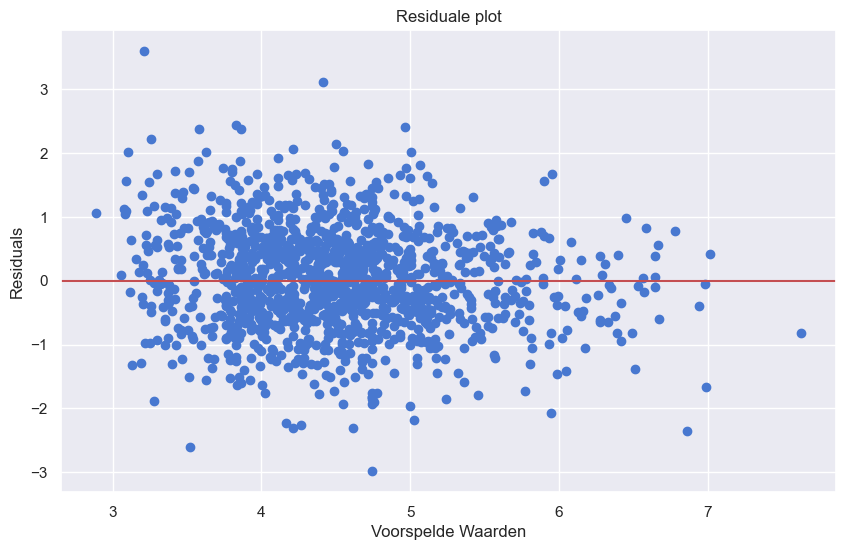

Shapiro-Wilk Test: Statistics=0.998, p=0.078


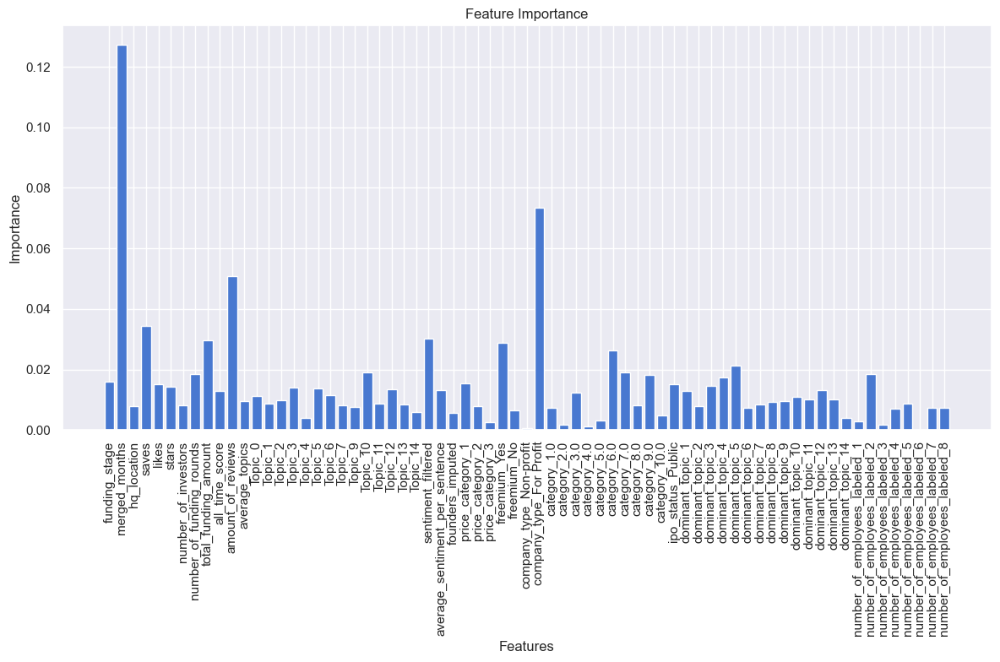

In [1002]:

# Train een XGBoost-model
xgb_model = XGBRegressor(random_state=42, max_depth= 3, n_estimators = 200, reg_lambda = 2, )
xgb_model.fit(X_train, y_train)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train, y_train)
y_dummy_pred = dummy_regressor.predict(X_test)

# Prestatiemetingen
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
mae_train = mean_absolute_error(y_train, y_pred_train)
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_dummy = mean_squared_error(y_test, y_dummy_pred)
# Bereken RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

# Bereken MAPE
mape_train = np.mean(np.abs((y_train - y_pred_train) / y_train)) * 100
mape_test = np.mean(np.abs((y_test - y_pred_test) / y_test)) * 100

print("Training Set RMSE:", rmse_train)
print("Test Set RMSE:", rmse_test)
print("Training Set MAPE:", mape_train)
print("Test Set MAPE:", mape_test)
print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)


# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X, y, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train.shape[1])
print(xgb_model.get_params())

# Residuale analyse
residuals = y_test - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()

# Normaliteit van de residuals: Shapiro-Wilk test
from scipy.stats import shapiro
stat, p = shapiro(residuals)
print('Shapiro-Wilk Test: Statistics=%.3f, p=%.3f' % (stat, p))

# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()

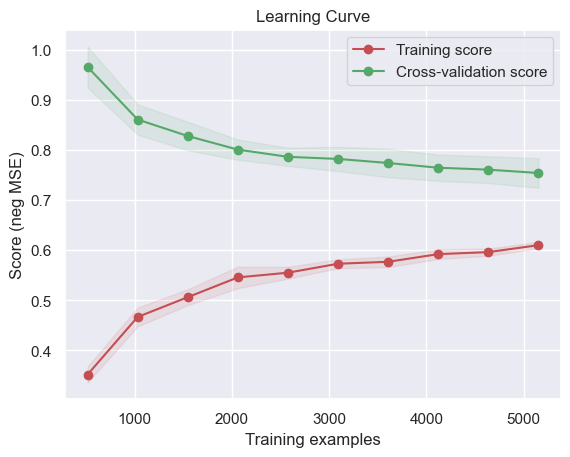

In [1003]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt

# Bepaal de trainingsgroottes en ontvang de scores
train_sizes, train_scores, val_scores = learning_curve(xgb_model, X, y, cv=5, scoring='neg_mean_squared_error',
                                                       train_sizes=np.linspace(0.1, 1.0, 10))

# Bereken de gemiddelde en standaardafwijking van de trainings- en validatiescores
train_scores_mean = -train_scores.mean(axis=1)
train_scores_std = train_scores.std(axis=1)
val_scores_mean = -val_scores.mean(axis=1)
val_scores_std = val_scores.std(axis=1)

# Plot de learning curve
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, val_scores_mean - val_scores_std,
                 val_scores_mean + val_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, val_scores_mean, 'o-', color="g", label="Cross-validation score")

plt.title("Learning Curve")
plt.xlabel("Training examples")
plt.ylabel("Score (neg MSE)")
plt.legend(loc="best")
plt.show()

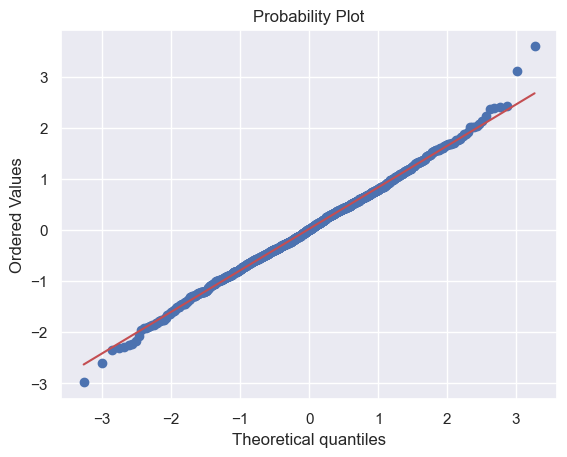

In [1004]:
# QQ plot
from scipy import stats
stats.probplot(residuals, plot=plt)
plt.show()



## 5th iteration

In [283]:
featuresdum = ['merged_months',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
       'num_topics', 'average_topics', 'Topic_0', 'Topic_1', 'Topic_2',
       'Topic_3', 'Topic_4', 'Topic_5', 'Topic_6', 'Topic_7', 'Topic_8',
       'Topic_9', 'Topic_10', 'Topic_11', 'Topic_12', 'Topic_13', 'Topic_14',
       'sentiment_filtered', 'sentiment_review', 'sentiment_score',
       'average_sentiment_per_sentence', 'price_category_1',
       'price_category_2', 'price_category_3', 'freemium_Yes', 'category_1.0', 'category_2.0', 'category_3.0',
       'category_4.0', 'category_5.0', 'category_6.0', 'category_7.0',
       'category_8.0', 'category_9.0', 'category_10.0',
       'number_of_employees_10001+', 'number_of_employees_1001-5000',
       'number_of_employees_101-250', 'number_of_employees_11-50',
       'number_of_employees_251-500', 'number_of_employees_5001-10000',
       'number_of_employees_501-1000', 'number_of_employees_51-100',
       'dominant_topic_1', 'dominant_topic_2', 'dominant_topic_3',
       'dominant_topic_4', 'dominant_topic_5', 'dominant_topic_6',
       'dominant_topic_7', 'dominant_topic_8', 'dominant_topic_9',
       'dominant_topic_10', 'dominant_topic_11', 'dominant_topic_12',
       'dominant_topic_13', 'dominant_topic_14']

target = 'average_visits'

# Split the data into train and test sets
X =  d[featuresdum]
y =  d[target]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Training Set RMSE: 1.8991277130717308
Test Set RMSE: 2.3633488129389826
Training Set MAPE: 20.397244098991454
Test Set MAPE: 26.345259411591567
Training Set Mean Squared Error: 3.606686070557062
Test Set Mean Squared Error: 5.585417611620097
Baseline Model Mean Squared Error: 7.588880505012402
Training Set R^2 Score: 0.5347244683805856
Test Set R^2 Score: 0.26249994739829674
Training Set Mean Absolute Error: 1.4189030693033753
Test Set Mean Absolute Error: 1.864744062677851
Cross-validation scores (neg MSE): [-5.8013713  -5.237588   -5.32080402 -5.41779257 -5.76110605]
Gemiddelde Cross-validation score (MSE): 5.507732389553987
Model Complexity - aantal features: 61
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, '

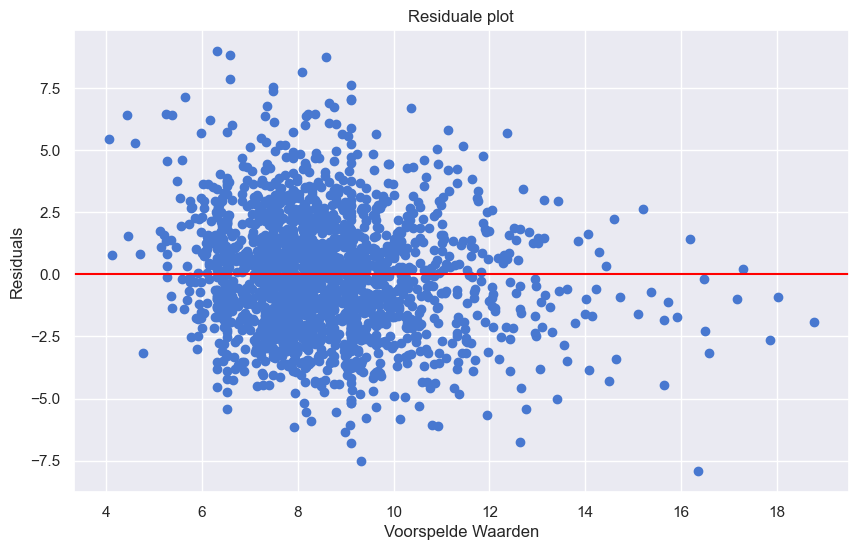

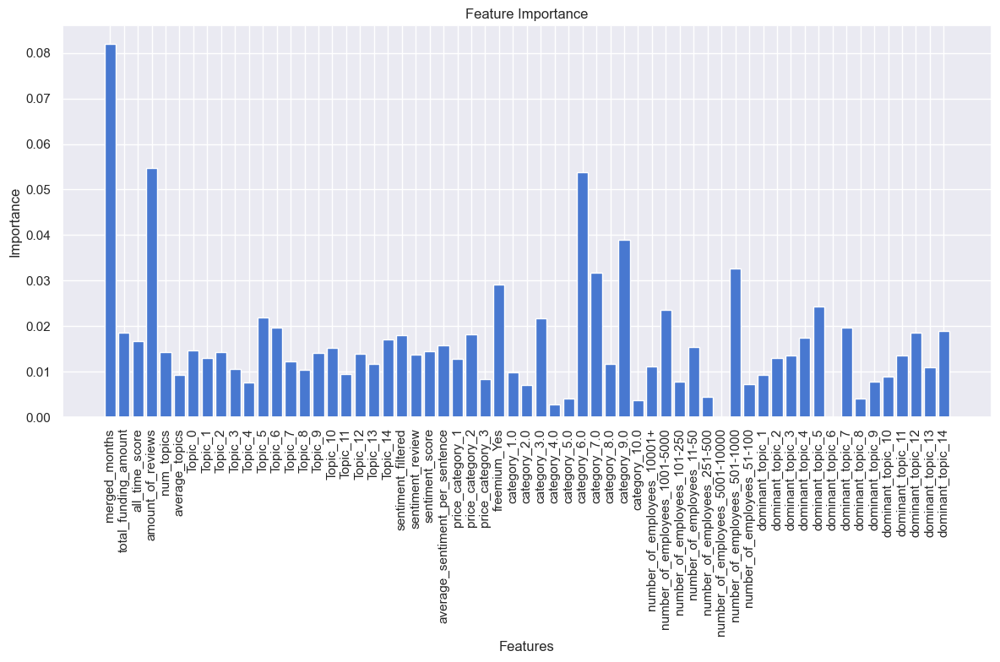

In [284]:
from sklearn.preprocessing import power_transform
import pandas as pd
#imoprt boostregressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.dummy import DummyRegressor
import numpy as np
import matplotlib.pyplot as plt



# Train een XGBoost-model
xgb_model = XGBRegressor(random_state=42, max_depth= 4, n_estimators = 200 ) 
xgb_model.fit(X_train, y_train)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train, y_train)
y_dummy_pred = dummy_regressor.predict(X_test)

# Prestatiemetingen
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
mae_train = mean_absolute_error(y_train, y_pred_train)
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_dummy = mean_squared_error(y_test, y_dummy_pred)
# Bereken RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

# Bereken MAPE
mape_train = np.mean(np.abs((y_train - y_pred_train) / y_train)) * 100
mape_test = np.mean(np.abs((y_test - y_pred_test) / y_test)) * 100

print("Training Set RMSE:", rmse_train)
print("Test Set RMSE:", rmse_test)
print("Training Set MAPE:", mape_train)
print("Test Set MAPE:", mape_test)
print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)


# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X, y, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train.shape[1])
print(xgb_model.get_params())

# Residuale analyse
residuals = y_test - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()



# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()

/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/ipykernel_94271/2377074552.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(residuals, bins=40)
/Users/macbook/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


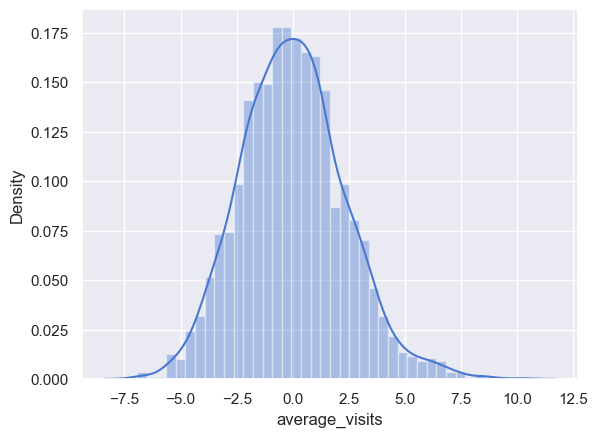

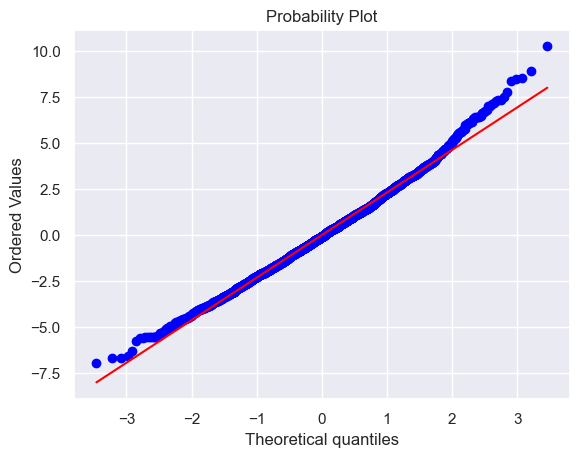

In [240]:
#plot normaliyu plot
import seaborn as sns
sns.distplot(residuals, bins=40)
plt.show()

# QQ plot
from scipy import stats
stats.probplot(residuals, plot=plt)
plt.show()

In [278]:
featuresdum = ['merged_months',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
       'average_sentiment_per_sentence', 'freemium_Yes', 'category_6.0', 'category_7.0',
      'category_9.0',
       
     
       'number_of_employees_501-1000', 
     
       'dominant_topic_4', 'dominant_topic_5']

target = 'average_visits'

# Split the data into train and test sets
X =  d[featuresdum]
y =  d[target]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

Training Set RMSE: 2.138705562558965
Test Set RMSE: 2.3099787302461365
Training Set MAPE: 23.575884452877265
Test Set MAPE: 25.776450971225145
Training Set Mean Squared Error: 4.5740614833206585
Test Set Mean Squared Error: 5.336001734189553
Baseline Model Mean Squared Error: 7.588880505012402
Training Set R^2 Score: 0.4099295456609562
Test Set R^2 Score: 0.29543288733497075
Training Set Mean Absolute Error: 1.6737230903821263
Test Set Mean Absolute Error: 1.8161249433100577
Cross-validation scores (neg MSE): [-5.41412076 -4.95894134 -5.04852878 -5.20724843 -5.33194287]
Gemiddelde Cross-validation score (MSE): 5.192156436981337
Model Complexity - aantal features: 61
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 

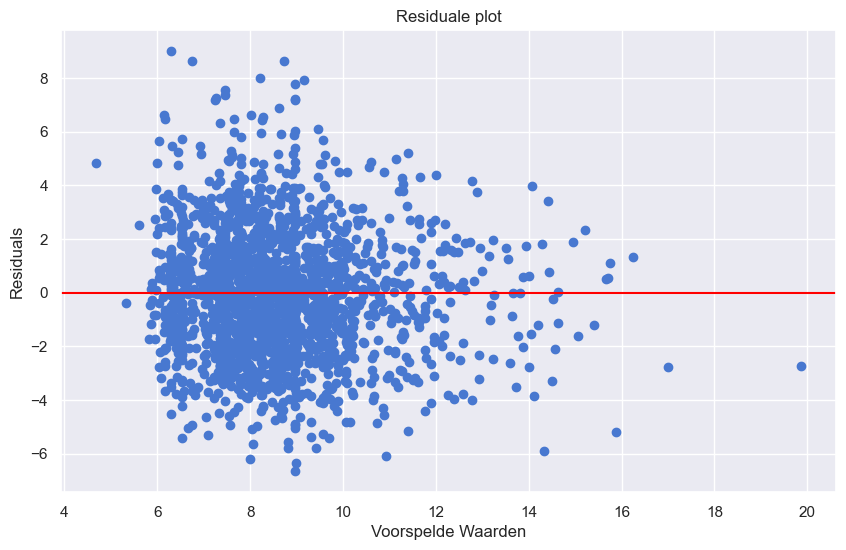

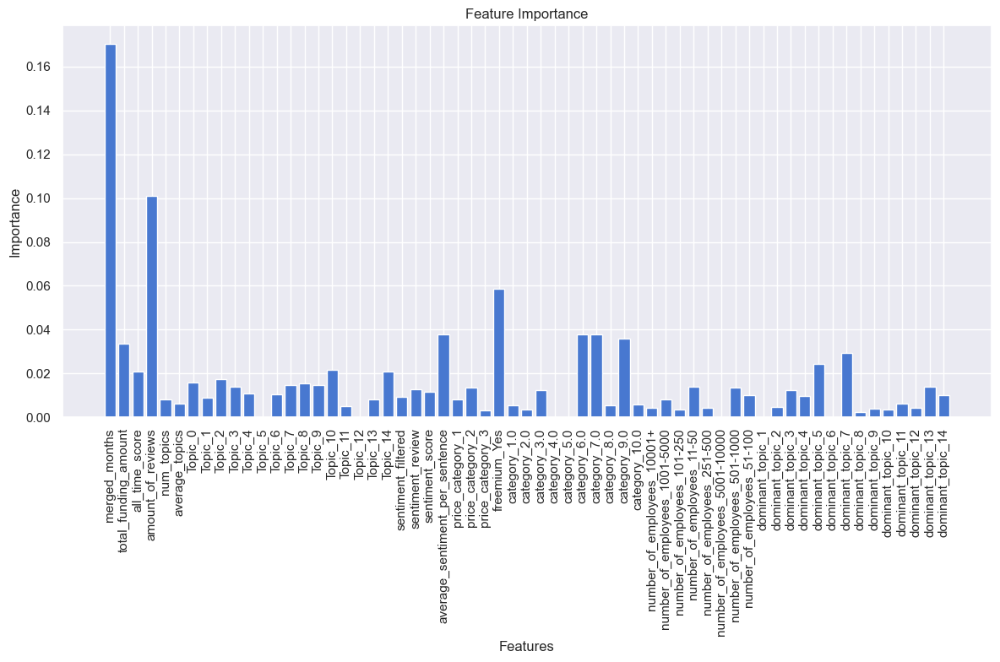

In [304]:
from sklearn.preprocessing import power_transform
import pandas as pd
#imoprt boostregressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.dummy import DummyRegressor
import numpy as np
import matplotlib.pyplot as plt



# Train een XGBoost-model
xgb_model = XGBRegressor(random_state=42, max_depth= 2, n_estimators = 200, reg_lambda = 2, )
xgb_model.fit(X_train, y_train)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train, y_train)
y_dummy_pred = dummy_regressor.predict(X_test)

# Prestatiemetingen
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
mae_train = mean_absolute_error(y_train, y_pred_train)
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_dummy = mean_squared_error(y_test, y_dummy_pred)
# Bereken RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))

# Bereken MAPE
mape_train = np.mean(np.abs((y_train - y_pred_train) / y_train)) * 100
mape_test = np.mean(np.abs((y_test - y_pred_test) / y_test)) * 100

print("Training Set RMSE:", rmse_train)
print("Test Set RMSE:", rmse_test)
print("Training Set MAPE:", mape_train)
print("Test Set MAPE:", mape_test)
print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)


# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X, y, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train.shape[1])
print(xgb_model.get_params())

# Residuale analyse
residuals = y_test - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()



# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()

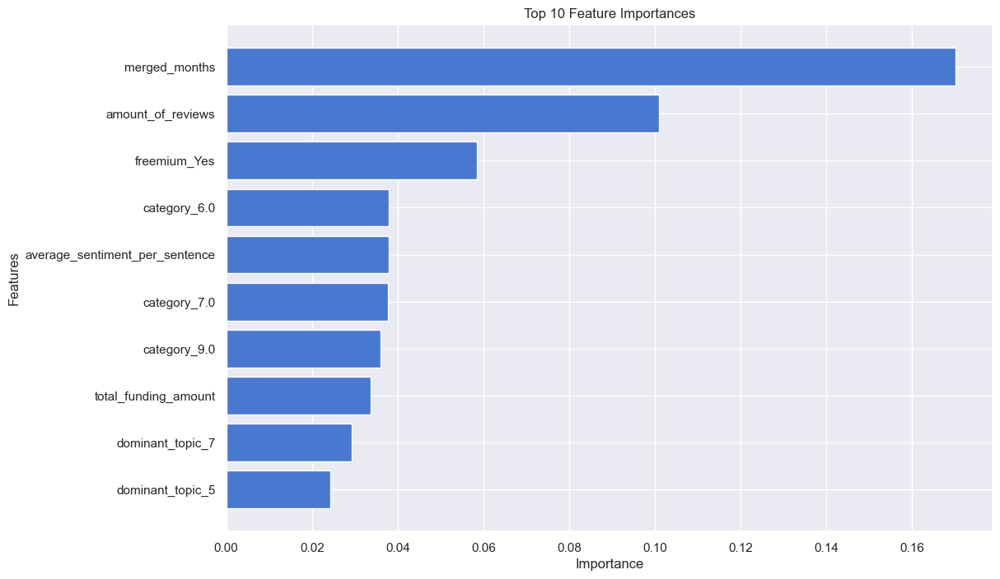

In [305]:
import matplotlib.pyplot as plt
import xgboost as xgb

# Assuming 'xgb_model' is your trained XGBoost model and 'X_train' is your training dataset
# Get feature importances
feature_importances = xgb_model.feature_importances_

# Get the feature names
features = X_train.columns

# Map feature importances to the features
feature_importance_dict = dict(zip(features, feature_importances))

# Sort the feature importances in descending order
sorted_features = sorted(feature_importance_dict.items(), key=lambda item: item[1], reverse=True)

# Select the top 10 features
top_features = sorted_features[:10]
feature_names = [item[0] for item in top_features]
feature_scores = [item[1] for item in top_features]

# Plotting
plt.figure(figsize=(12, 8))
plt.barh(feature_names, feature_scores)
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Top 10 Feature Importances')
plt.gca().invert_yaxis()  # To display the highest importance at the top
plt.show()


In [244]:
import shap

In [245]:
# compute SHAP values
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

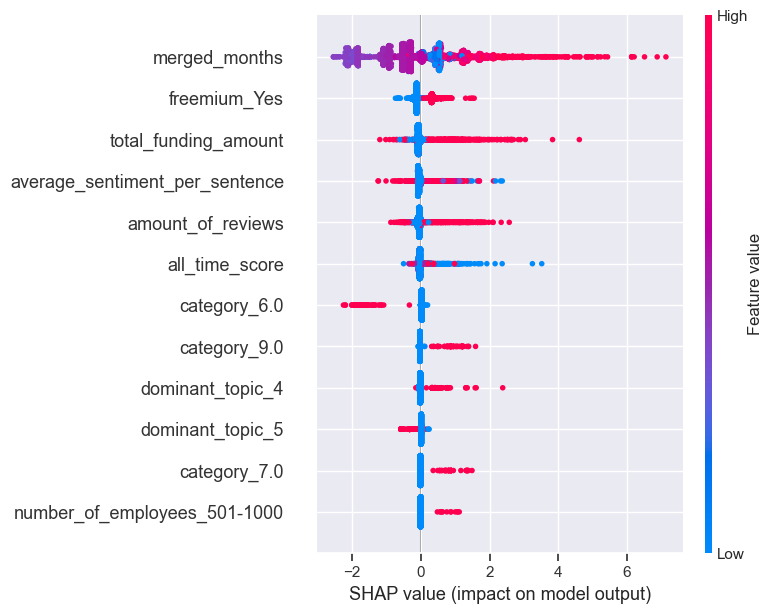

In [251]:
shap.summary_plot(shap_values, X_train)

In [270]:
shap_interaction_values3 = shap.TreeExplainer(xgb_model).shap_interaction_values(
    X_train
)

In [264]:
shap.initjs()


## on same dataset as linear regression

Training Set RMSE: 0.7350944111074698
Test Set RMSE: 0.8305068415240885
Training Set MAPE: 14.103998450822578
Test Set MAPE: 15.96317224478426
Training Set Mean Squared Error: 0.5403637932414378
Test Set Mean Squared Error: 0.6897416138183174
Baseline Model Mean Squared Error: 1.0281846779542416
Training Set R^2 Score: 0.5065446522250611
Test Set R^2 Score: 0.3288536718762871
Training Set Mean Absolute Error: 0.5505926485118972
Test Set Mean Absolute Error: 0.655030839428918
Cross-validation scores (neg MSE): [-0.68799984 -0.67470519 -0.67038185 -0.79314377 -0.7870074 ]
Gemiddelde Cross-validation score (MSE): 0.722647610985481
Model Complexity - aantal features: 9
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, '

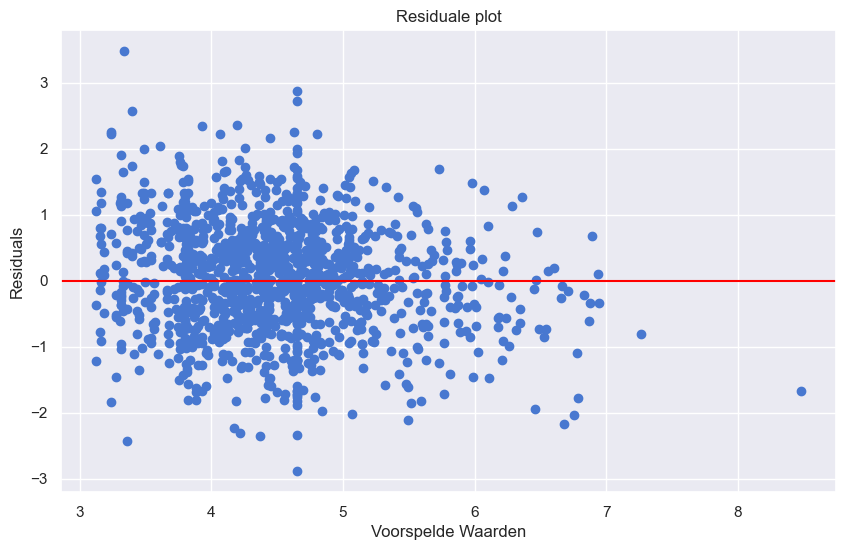

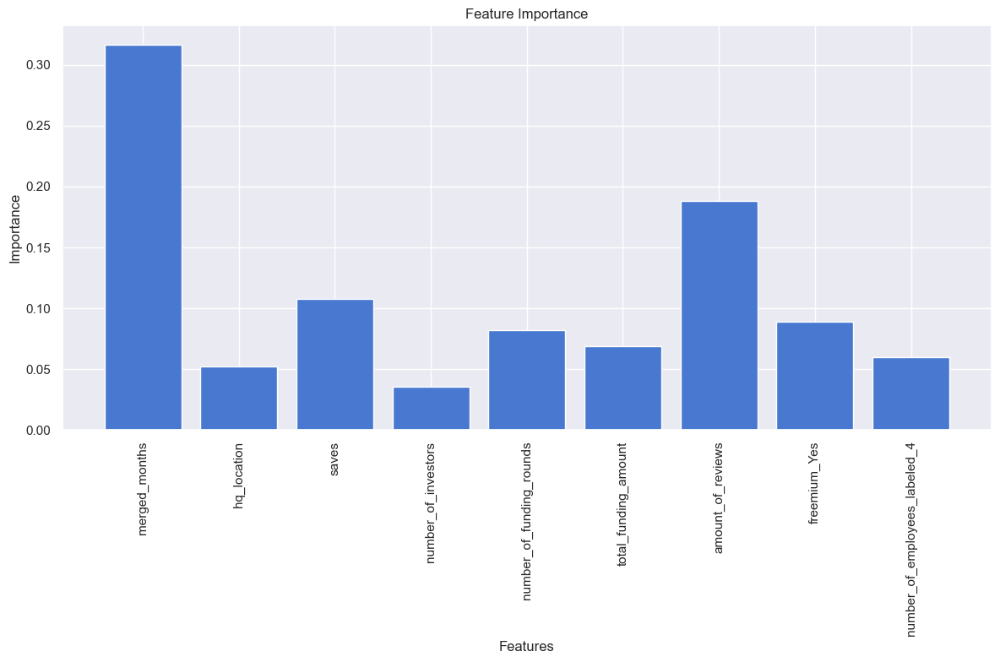

In [464]:
from sklearn.preprocessing import power_transform
import pandas as pd
#imoprt boostregressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.dummy import DummyRegressor
import numpy as np
import matplotlib.pyplot as plt

X_train2 = X_train2[multivariate_features2]


# Train een XGBoost-model
xgb_model = XGBRegressor(random_state=42, max_depth= 4, n_estimators = 200 ) 
xgb_model.fit(X_train2, y_train2)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train2)
y_pred_test = xgb_model.predict(X_test2)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train2, y_train2)
y_dummy_pred = dummy_regressor.predict(X_test2)

# Prestatiemetingen
mse_train = mean_squared_error(y_train2, y_pred_train)
mse_test = mean_squared_error(y_test2, y_pred_test)
r2_train = r2_score(y_train2, y_pred_train)
r2_test = r2_score(y_test2, y_pred_test)
mae_train = mean_absolute_error(y_train2, y_pred_train)
mae_test = mean_absolute_error(y_test2, y_pred_test)
mse_dummy = mean_squared_error(y_test2, y_dummy_pred)
# Bereken RMSE
rmse_train = np.sqrt(mean_squared_error(y_train2, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test2, y_pred_test))

# Bereken MAPE
mape_train = np.mean(np.abs((y_train2 - y_pred_train) / y_train2)) * 100
mape_test = np.mean(np.abs((y_test2 - y_pred_test) / y_test2)) * 100

print("Training Set RMSE:", rmse_train)
print("Test Set RMSE:", rmse_test)
print("Training Set MAPE:", mape_train)
print("Test Set MAPE:", mape_test)
print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)


# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X_train2, y_train2, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train2.shape[1])
print(xgb_model.get_params())

# Residuale analyse
residuals = y_test2 - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()



# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train2.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()

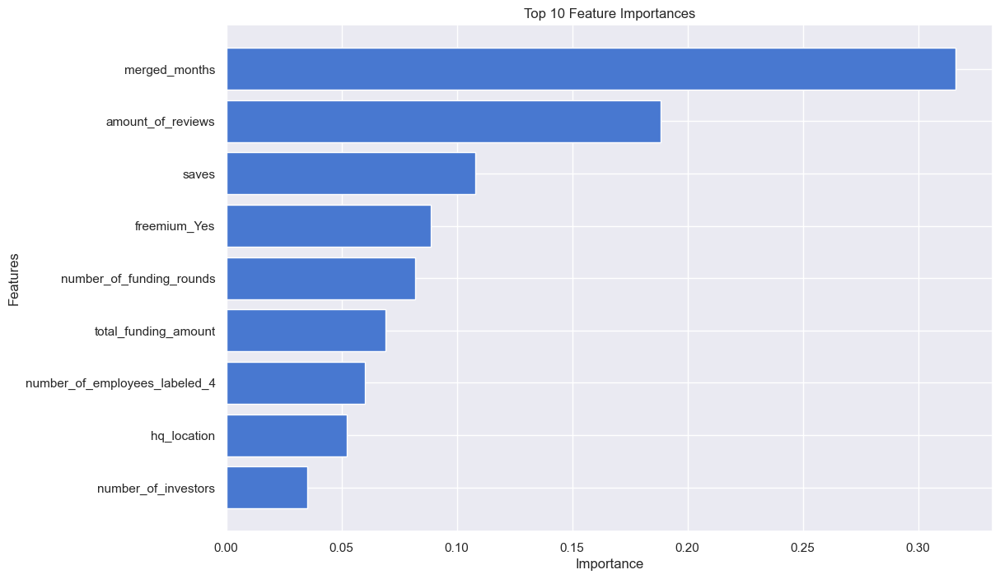

In [450]:
import matplotlib.pyplot as plt
import xgboost as xgb

# Assuming 'xgb_model' is your trained XGBoost model and 'X_train' is your training dataset
# Get feature importances
feature_importances = xgb_model.feature_importances_

# Get the feature names
features = X_train2.columns

# Map feature importances to the features
feature_importance_dict = dict(zip(features, feature_importances))

# Sort the feature importances in descending order
sorted_features = sorted(feature_importance_dict.items(), key=lambda item: item[1], reverse=True)

# Select the top 10 features
top_features = sorted_features[:10]
feature_names = [item[0] for item in top_features]
feature_scores = [item[1] for item in top_features]

# Plotting
plt.figure(figsize=(12, 8))
plt.barh(feature_names, feature_scores)
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Top 10 Feature Importances')
plt.gca().invert_yaxis()  # To display the highest importance at the top
plt.show()

In [453]:
import shap

In [455]:
# compute SHAP values
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_train2)

# visualize the first prediction's explanation
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train2.iloc[0,:])

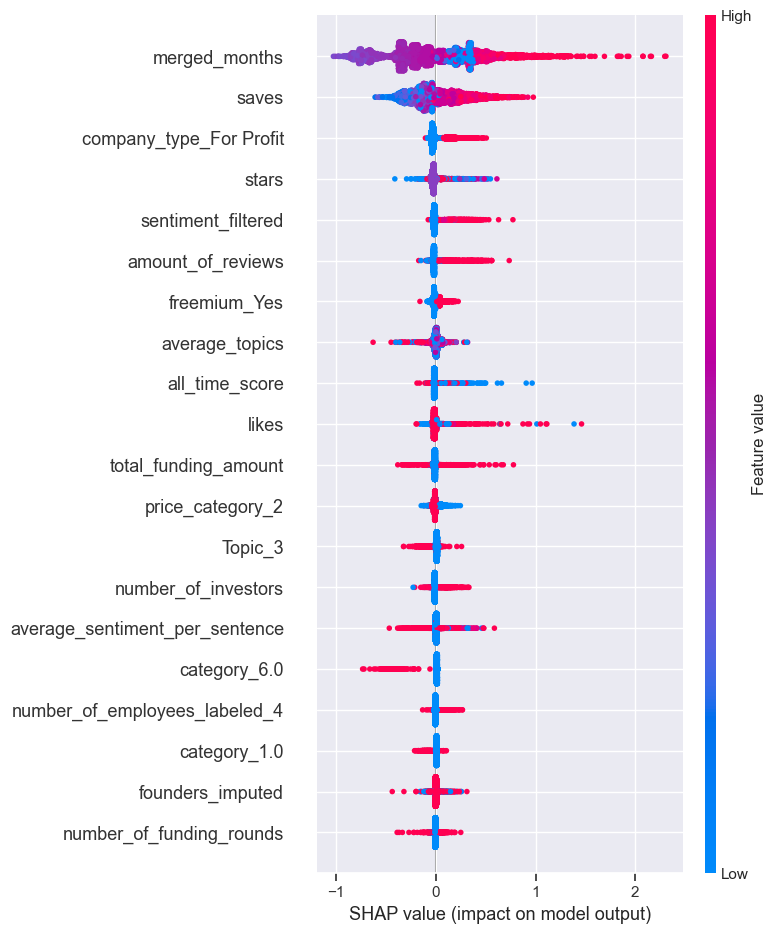

In [457]:
shap.summary_plot(shap_values, X_train2)

Training Set RMSE: 0.6633588834345482
Test Set RMSE: 0.8314219344523327
Training Set MAPE: 12.621019444214488
Test Set MAPE: 16.000717837035392
Training Set Mean Squared Error: 0.4400450082315304
Test Set Mean Squared Error: 0.691262433088459
Baseline Model Mean Squared Error: 1.01409651599982
Training Set R^2 Score: 0.5959888648807696
Test Set R^2 Score: 0.31739338659682714
Training Set Mean Absolute Error: 0.4956961588226352
Test Set Mean Absolute Error: 0.6507803847606619
Cross-validation scores (neg MSE): [-0.67534322 -0.68474193 -0.62854275 -0.74721456 -0.76920368]
Gemiddelde Cross-validation score (MSE): 0.7010092299429417
Model Complexity - aantal features: 69
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None,

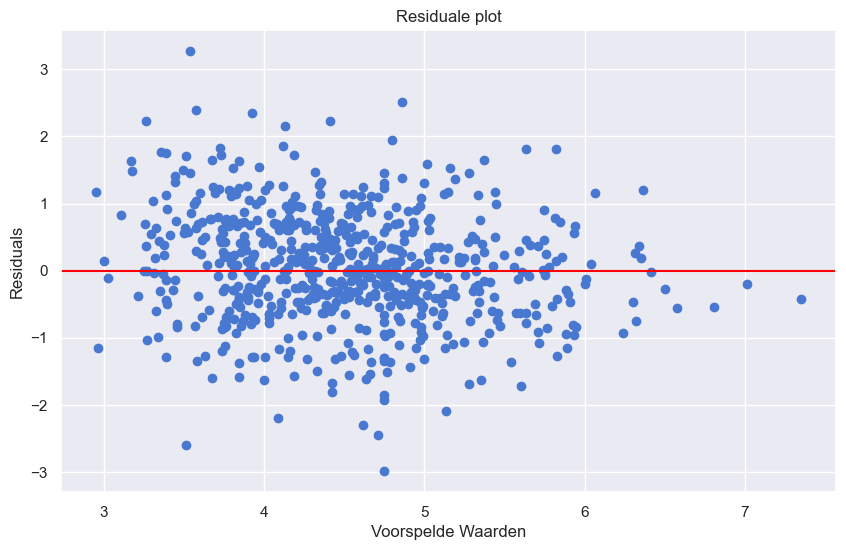

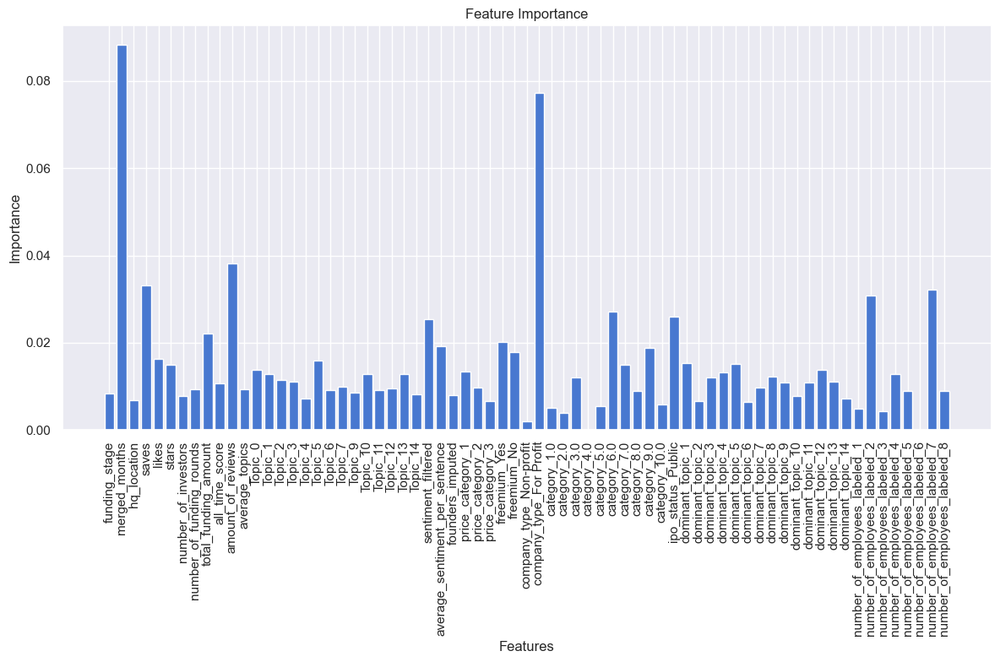

In [451]:
from sklearn.preprocessing import power_transform
import pandas as pd
#imoprt boostregressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.dummy import DummyRegressor
import numpy as np
import matplotlib.pyplot as plt

X = df_yeojohnson_transformed[selected_features]
y = df_yeojohnson_transformed['average_visits']

#split df into train and test
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size=0.1, random_state=1009)

# Train een XGBoost-model
xgb_model = XGBRegressor(random_state=42, max_depth= 4, n_estimators = 200 ) 
xgb_model.fit(X_train2, y_train2)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train2)
y_pred_test = xgb_model.predict(X_test2)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train2, y_train2)
y_dummy_pred = dummy_regressor.predict(X_test2)

# Prestatiemetingen
mse_train = mean_squared_error(y_train2, y_pred_train)
mse_test = mean_squared_error(y_test2, y_pred_test)
r2_train = r2_score(y_train2, y_pred_train)
r2_test = r2_score(y_test2, y_pred_test)
mae_train = mean_absolute_error(y_train2, y_pred_train)
mae_test = mean_absolute_error(y_test2, y_pred_test)
mse_dummy = mean_squared_error(y_test2, y_dummy_pred)
# Bereken RMSE
rmse_train = np.sqrt(mean_squared_error(y_train2, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test2, y_pred_test))

# Bereken MAPE
mape_train = np.mean(np.abs((y_train2 - y_pred_train) / y_train2)) * 100
mape_test = np.mean(np.abs((y_test2 - y_pred_test) / y_test2)) * 100

print("Training Set RMSE:", rmse_train)
print("Test Set RMSE:", rmse_test)
print("Training Set MAPE:", mape_train)
print("Test Set MAPE:", mape_test)
print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)


# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X_train2, y_train2, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train2.shape[1])
print(xgb_model.get_params())

# Residuale analyse
residuals = y_test2 - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()



# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train2.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()

Training Set RMSE: 1.67756910894693
Test Set RMSE: 1.7432496667547004
Training Set MAPE: 21.25427511719744
Test Set MAPE: 22.292857795822158
Training Set Mean Squared Error: 2.814238115292997
Test Set Mean Squared Error: 3.0389194006403737
Baseline Model Mean Squared Error: 3.868447081254092
Training Set R^2 Score: 0.33432351533352156
Test Set R^2 Score: 0.21433537767537703
Training Set Mean Absolute Error: 1.2917765315429597
Test Set Mean Absolute Error: 1.3929124484464832
Cross-validation scores (neg MSE): [-3.29836819 -3.26162408 -3.24357231 -3.41649541 -3.47235293]
Gemiddelde Cross-validation score (MSE): 3.3384825851701017
Model Complexity - aantal features: 9
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, '

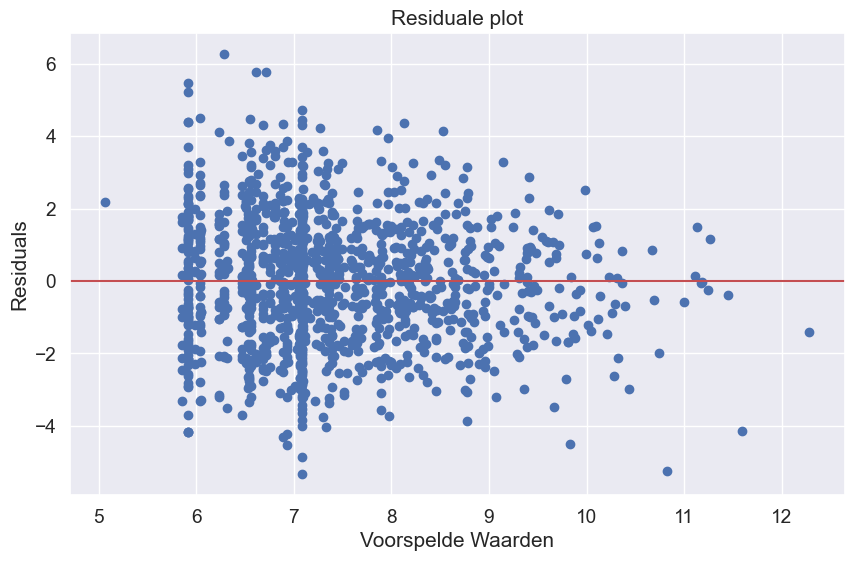

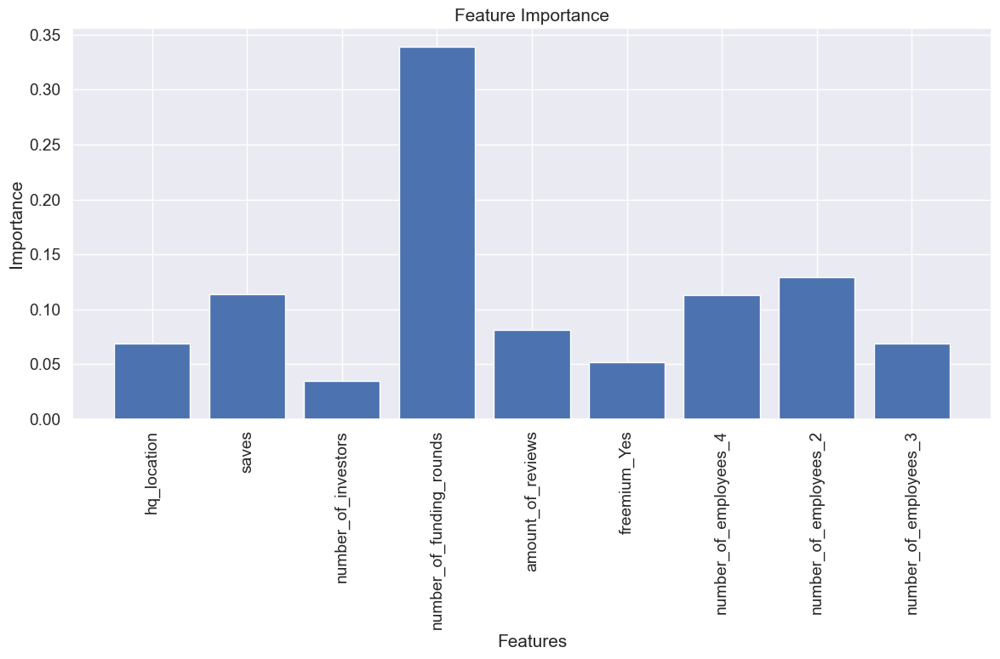

In [3582]:
from sklearn.preprocessing import power_transform
import pandas as pd
#imoprt boostregressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.dummy import DummyRegressor
import numpy as np
import matplotlib.pyplot as plt

X_train2 = X_train2[multivariate_features2]


# Train een XGBoost-model
xgb_model = XGBRegressor(random_state=42, max_depth= 4, n_estimators = 200 ) 
xgb_model.fit(X_train2, y_train2)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train2)
y_pred_test = xgb_model.predict(X_test2)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train2, y_train2)
y_dummy_pred = dummy_regressor.predict(X_test2)

# Prestatiemetingen
mse_train = mean_squared_error(y_train2, y_pred_train)
mse_test = mean_squared_error(y_test2, y_pred_test)
r2_train = r2_score(y_train2, y_pred_train)
r2_test = r2_score(y_test2, y_pred_test)
mae_train = mean_absolute_error(y_train2, y_pred_train)
mae_test = mean_absolute_error(y_test2, y_pred_test)
mse_dummy = mean_squared_error(y_test2, y_dummy_pred)
# Bereken RMSE
rmse_train = np.sqrt(mean_squared_error(y_train2, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test2, y_pred_test))

# Bereken MAPE
mape_train = np.mean(np.abs((y_train2 - y_pred_train) / y_train2)) * 100
mape_test = np.mean(np.abs((y_test2 - y_pred_test) / y_test2)) * 100

print("Training Set RMSE:", rmse_train)
print("Test Set RMSE:", rmse_test)
print("Training Set MAPE:", mape_train)
print("Test Set MAPE:", mape_test)
print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)


# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X_train2, y_train2, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train2.shape[1])
print(xgb_model.get_params())

# Residuale analyse
residuals = y_test2 - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()



# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train2.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()

#  final test

In [1158]:
#get dummies for df
df2 = pd.get_dummies(df ,drop_first = True)

In [531]:
feature = ['price', 'saves', 'likes', 'stars',
       'number_of_founders', 'number_of_funding_rounds',
       'total_funding_amount', 'number_of_investors', 'all_time_score',
       'merged_months', 'hq_location', 'category', 'sentiment',
       'collaboration', 'innovative', 'information', 'service',
       'business_development', 'content_management', 'user_experience',
       'design', 'time_management', 'product', 'content_creation',
       'customer_support', 'ease_of_use', 'workflow_optimization',
       'ai_assistant', 'number_of_employees_1-10',
       'number_of_employees_10001+', 'number_of_employees_1001-5000',
       'number_of_employees_101-250', 'number_of_employees_11-50',
       'number_of_employees_251-500', 'number_of_employees_5001-10000',
       'number_of_employees_501-1000', 'number_of_employees_51-100',
       'freemium_No', 'freemium_Yes', 'funding_stage_True']

target = 'average_visits'

# Split the data into train and test sets
X =  e[feature]
y =  e[target]


In [488]:
df.columns

Index(['tool_id', 'company_type', 'average visits', 'task', 'price', 'saves',
       'likes', 'ipo_status', 'description', 'stars', 'period',
       'headquarters_location', 'founded_date', 'headquarters_regions',
       'number_of_employees', 'number_of_founders', 'full_description',
       'number_of_funding_rounds', 'freemium', 'total_funding_amount',
       'number_of_investors', 'review_text', 'helpful_count', 'all_time_score',
       'review_id', 'amount_of_reviews', 'recent_review_score',
       'recent_reviews_amount', 'months_since_period', 'months_since_founded',
       'merged_months', 'price_category', 'hq_location', 'average_visits',
       'funding_stage', 'category', 'num_topics', 'average_topics', 'Topic_0',
       'Topic_1', 'Topic_2', 'Topic_3', 'Topic_4', 'Topic_5', 'Topic_6',
       'Topic_7', 'Topic_8', 'Topic_9', 'Topic_10', 'Topic_11', 'Topic_12',
       'Topic_13', 'Topic_14', 'sentiment_filtered', 'sentiment_per_sentence',
       'sentiment_review', 'dominant_t

In [492]:
df.dtypes

tool_id                           int64
company_type                   category
average visits                  float64
task                     string[python]
price                           float64
                              ...      
content_creation                float64
customer_support                float64
ease_of_use                     float64
workflow_optimization           float64
ai_assistant                    float64
Length: 75, dtype: object

In [2305]:
features = [ 'price', 'saves', 'average_visits',
       'likes', 'stars', 
       'number_of_employees', 'number_of_founders', 
       'number_of_funding_rounds', 'freemium', 'total_funding_amount',
       'number_of_investors', 'all_time_score',
       'merged_months',  'hq_location', 
       'funding_stage', 'category', 'sentiment', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant']

In [2306]:
feat = [ 'price', 'saves',
       'likes', 'stars', 
       'number_of_employees', 'number_of_founders', 
       'number_of_funding_rounds', 'freemium', 'total_funding_amount',
       'number_of_investors', 'all_time_score',
       'merged_months',  'hq_location', 
       'funding_stage', 'category', 'sentiment', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant']

In [2302]:
df.columns

Index(['tool_id', 'company_type', 'average visits', 'task', 'price', 'saves',
       'likes', 'ipo_status', 'description', 'stars', 'period',
       'headquarters_location', 'founded_date', 'headquarters_regions',
       'number_of_employees', 'number_of_founders', 'full_description',
       'number_of_funding_rounds', 'freemium', 'total_funding_amount',
       'number_of_investors', 'review_text', 'helpful_count', 'all_time_score',
       'review_id', 'amount_of_reviews', 'recent_review_score',
       'recent_reviews_amount', 'months_since_period', 'months_since_founded',
       'merged_months', 'price_category', 'hq_location', 'average_visits',
       'funding_stage', 'category', 'collaboration_sent', 'innovative_sent',
       'information_sent', 'service_sent', 'business_development_sent',
       'content_management_sent', 'user_experience_sent', 'design_sent',
       'time_management_sent', 'product_sent', 'content_creation_sent',
       'customer_support_sent', 'ease_of_use_sent',

In [2303]:
#funding stage to categorical
df['funding_stage'] = df['funding_stage'].astype('category')

In [2307]:
e = df[features]

KeyError: "['sentiment'] not in index"

In [2295]:
#change to dummies
e = pd.get_dummies(df[features])

In [2296]:
e.columns

Index(['price_category', 'price', 'months_since_founded',
       'months_since_period', 'average_visits', 'merged_months', 'category',
       'hq_location', 'saves', 'likes', 'stars', 'helpful_count',
       'number_of_founders', 'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
       'collaboration_sent', 'innovative_sent', 'information_sent',
       'service_sent', 'business_development_sent', 'content_management_sent',
       'user_experience_sent', 'design_sent', 'time_management_sent',
       'product_sent', 'content_creation_sent', 'customer_support_sent',
       'ease_of_use_sent', 'workflow_optimization_sent', 'ai_assistant_sent',
       'collaboration', 'innovative', 'information', 'service',
       'business_development', 'content_management', 'user_experience',
       'design', 'time_management', 'product', 'content_creation',
       'customer_support', 'ease_of_use', 'workflow_optimization',
       'ai_

In [2297]:
df[features].dtypes

price_category                   int64
price                          float64
freemium                      category
funding_stage                   object
company_type                  category
months_since_founded           float64
months_since_period            float64
average_visits                 float64
merged_months                    int64
category                       float64
hq_location                    boolean
saves                          float64
likes                          float64
stars                          float64
number_of_employees           category
helpful_count                  float64
number_of_founders             float64
number_of_investors            float64
number_of_funding_rounds       float64
total_funding_amount           float64
all_time_score                 float64
ipo_status                    category
amount_of_reviews              float64
collaboration_sent             float64
innovative_sent                float64
information_sent         

In [2298]:
import pandas as pd
#imoprt boostregressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.dummy import DummyRegressor
import numpy as np
import matplotlib.pyplot as plt



#split df into train and test
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size=0.1, random_state=1009)

# Train een XGBoost-model
xgb_model = XGBRegressor(random_state=42, max_depth= 4, n_estimators = 200 ) 
xgb_model.fit(X_train2, y_train2)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train2)
y_pred_test = xgb_model.predict(X_test2)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train2, y_train2)
y_dummy_pred = dummy_regressor.predict(X_test2)

# Prestatiemetingen
mse_train = mean_squared_error(y_train2, y_pred_train)
mse_test = mean_squared_error(y_test2, y_pred_test)
r2_train = r2_score(y_train2, y_pred_train)
r2_test = r2_score(y_test2, y_pred_test)
mae_train = mean_absolute_error(y_train2, y_pred_train)
mae_test = mean_absolute_error(y_test2, y_pred_test)
mse_dummy = mean_squared_error(y_test2, y_dummy_pred)
# Bereken RMSE
rmse_train = np.sqrt(mean_squared_error(y_train2, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test2, y_pred_test))

# Bereken MAPE
mape_train = np.mean(np.abs((y_train2 - y_pred_train) / y_train2)) * 100
mape_test = np.mean(np.abs((y_test2 - y_pred_test) / y_test2)) * 100

print("Training Set RMSE:", rmse_train)
print("Test Set RMSE:", rmse_test)
print("Training Set MAPE:", mape_train)
print("Test Set MAPE:", mape_test)
print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)


# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X_train2, y_train2, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train2.shape[1])
print(xgb_model.get_params())

# Residuale analyse
residuals = y_test2 - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()



# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train2.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()

ValueError: Found input variables with inconsistent numbers of samples: [3949, 6440]

In [3587]:
b.columns

Index(['tool_id', 'average visits', 'price', 'saves', 'likes', 'stars',
       'founded_date', 'number_of_founders', 'number_of_funding_rounds',
       'total_funding_amount',
       ...
       'review_id_review-700519', 'review_id_review-700635',
       'review_id_review-700645', 'review_id_review-701029',
       'review_id_review-701136', 'review_id_review-701152',
       'review_id_review-701258', 'review_id_review-701543',
       'review_id_review-701656', 'review_id_review-701691'],
      dtype='object', length=6408)

In [3590]:
features = ['price', 'months_since_founded', 'months_since_period',
        'merged_months', 'hq_location', 'saves', 'likes',
       'stars',  'number_of_founders', 'number_of_investors',
       'number_of_funding_rounds', 'total_funding_amount', 'all_time_score',
       'amount_of_reviews', 'collaboration_sent', 'innovative_sent',
       'information_sent', 'service_sent', 'business_development_sent',
       'content_management_sent', 'user_experience_sent', 'design_sent',
       'time_management_sent', 'product_sent', 'content_creation_sent',
       'customer_support_sent', 'ease_of_use_sent',
       'workflow_optimization_sent', 'ai_assistant_sent', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant', 
       

      ]

In [3591]:
#one hot encode
b = pd.get_dummies(df[features], drop_first = True)


In [3592]:
b.columns

Index(['price', 'months_since_founded', 'months_since_period', 'merged_months',
       'hq_location', 'saves', 'likes', 'stars', 'number_of_founders',
       'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
       'collaboration_sent', 'innovative_sent', 'information_sent',
       'service_sent', 'business_development_sent', 'content_management_sent',
       'user_experience_sent', 'design_sent', 'time_management_sent',
       'product_sent', 'content_creation_sent', 'customer_support_sent',
       'ease_of_use_sent', 'workflow_optimization_sent', 'ai_assistant_sent',
       'collaboration', 'innovative', 'information', 'service',
       'business_development', 'content_management', 'user_experience',
       'design', 'time_management', 'product', 'content_creation',
       'customer_support', 'ease_of_use', 'workflow_optimization',
       'ai_assistant'],
      dtype='object')

In [3605]:
feature = [
        'merged_months', 'saves', 'likes',
       'stars',  'number_of_founders', 'number_of_investors',
       'number_of_funding_rounds', 'total_funding_amount', 'all_time_score',
       'amount_of_reviews',  'collaboration',
       'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant', 
       

      ]

In [3603]:
#hyperparemeter for categroical in xgb



Training Set RMSE: 1.4064733089065455
Test Set RMSE: 1.7198741661155528
Training Set MAPE: 17.28367551790868
Test Set MAPE: 20.811062024751614
Training Set Mean Squared Error: 1.9781671686665272
Test Set Mean Squared Error: 2.9579671472716678
Baseline Model Mean Squared Error: 4.0974083947028825
Training Set R^2 Score: 0.5253212597900345
Test Set R^2 Score: 0.2768768488734845
Training Set Mean Absolute Error: 1.050843492430902
Test Set Mean Absolute Error: 1.3780059585266489
Cross-validation scores (neg MSE): [-2.66403886 -2.5035268  -2.77095249 -2.81639144 -2.73455882]
Gemiddelde Cross-validation score (MSE): 2.697893682120686
Model Complexity - aantal features: 24
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 

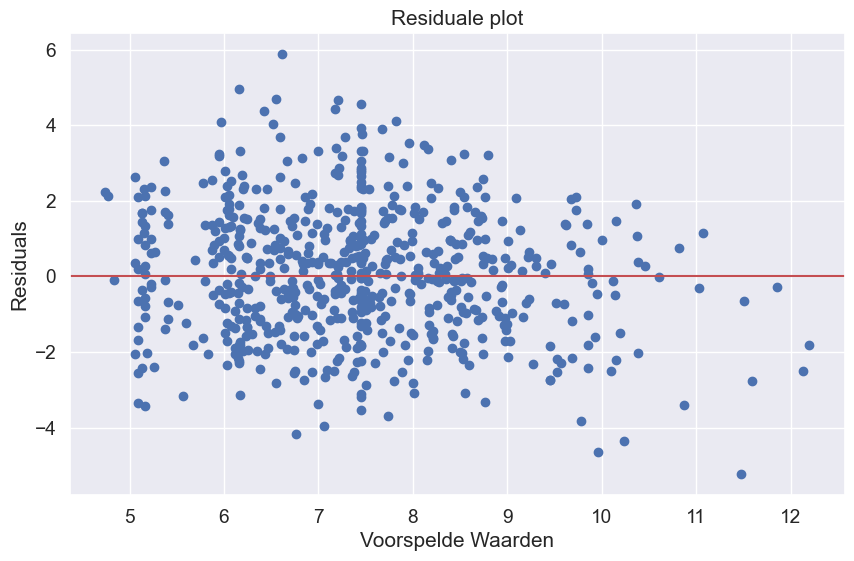

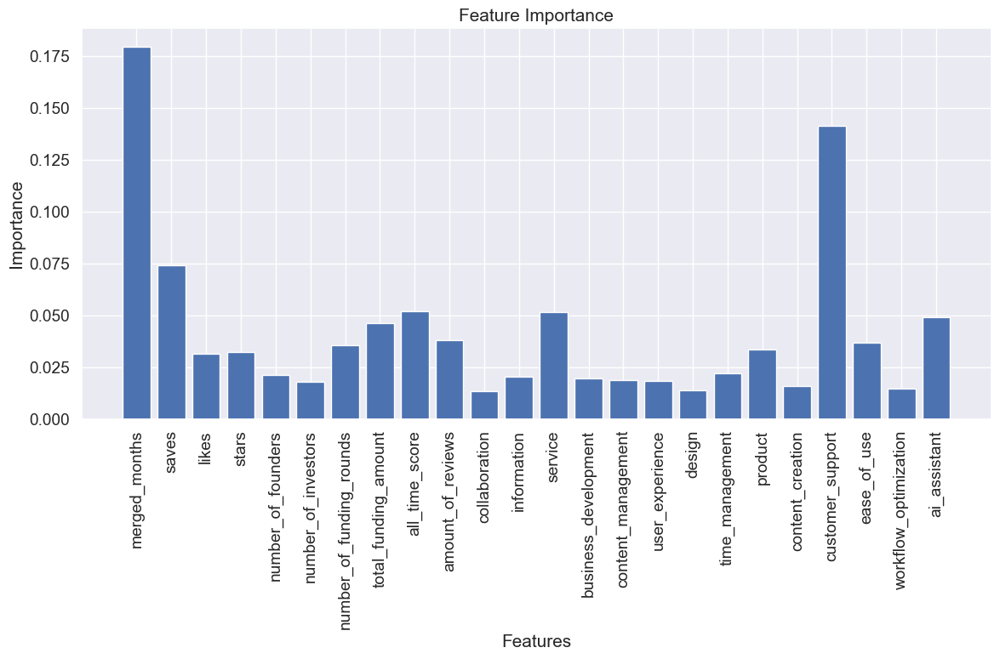

In [3606]:
from sklearn.preprocessing import power_transform
import pandas as pd
#imoprt boostregressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.dummy import DummyRegressor
import numpy as np
import matplotlib.pyplot as plt

X = b[feature]
y = df['average_visits']

#split df into train and test
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size=0.1, random_state=1009)

# Train een XGBoost-model
xgb_model = XGBRegressor(random_state=42, max_depth= 4, n_estimators = 200) 
xgb_model.fit(X_train2, y_train2)

# Voorspellingen maken
y_pred_train = xgb_model.predict(X_train2)
y_pred_test = xgb_model.predict(X_test2)

# Baseline model voor vergelijking
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train2, y_train2)
y_dummy_pred = dummy_regressor.predict(X_test2)

# Prestatiemetingen
mse_train = mean_squared_error(y_train2, y_pred_train)
mse_test = mean_squared_error(y_test2, y_pred_test)
r2_train = r2_score(y_train2, y_pred_train)
r2_test = r2_score(y_test2, y_pred_test)
mae_train = mean_absolute_error(y_train2, y_pred_train)
mae_test = mean_absolute_error(y_test2, y_pred_test)
mse_dummy = mean_squared_error(y_test2, y_dummy_pred)
# Bereken RMSE
rmse_train = np.sqrt(mean_squared_error(y_train2, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test2, y_pred_test))

# Bereken MAPE
mape_train = np.mean(np.abs((y_train2 - y_pred_train) / y_train2)) * 100
mape_test = np.mean(np.abs((y_test2 - y_pred_test) / y_test2)) * 100

print("Training Set RMSE:", rmse_train)
print("Test Set RMSE:", rmse_test)
print("Training Set MAPE:", mape_train)
print("Test Set MAPE:", mape_test)
print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)


# Cross-validation voor een robuustere schatting
cv_scores = cross_val_score(xgb_model, X_train2, y_train2, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Gemiddelde Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexiteit: Dit kan worden beoordeeld door het aantal parameters, de diepte van de boom, enz.
print("Model Complexity - aantal features:", X_train2.shape[1])
print(xgb_model.get_params())

# Residuale analyse
residuals = y_test2 - y_pred_test
plt.figure(figsize=(10,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Voorspelde Waarden')
plt.ylabel('Residuals')
plt.title('Residuale plot')
plt.show()



# Modelinterpretatie: Feature Importance
feature_importance = xgb_model.feature_importances_
features = X_train2.columns  # Dit zorgt ervoor dat u de exacte feature namen gebruikt die gebruikt zijn voor training

plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  # Dit zorgt voor betere layout als labels lang zijn
plt.show()

# sparse

In [ ]:

import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
import matplotlib.pyplot as plt

for i, feature in enumerate(features):
    row = i // 2
    col = i % 2

    # Add constant to the feature
    X_uni = sm.add_constant(data[[feature]])
    y = data[target]

    # Fit the OLS model
    model_uni = sm.OLS(y, X_uni).fit()

    # Calculate residuals
    residuals = model_uni.resid

    # Plot residuals vs predicted values
    ax = axes[row, col] if n_rows > 1 else axes[col]
    ax.scatter(model_uni.predict(X_uni), residuals)
    ax.axhline(y=0, color='red', linestyle='dashed')
    ax.set_xlabel('Predicted Values')
    ax.set_ylabel('Residuals')
    ax.set_title(f'Residuals vs Predicted for {feature}')

    # Perform Breusch-Pagan test
    bp_test = het_breuschpagan(residuals, model_uni.model.exog)
    print(f"Breusch-Pagan Test for {feature}")
    print(f"LM Statistic: {bp_test[0]:.3f}, p-value: {bp_test[1]:.3f}")
    print(f"F-Statistic: {bp_test[2]:.3f}, F-test p-value: {bp_test[3]:.3f}\n")

# Adjust layout
if n_features % 2 != 0:  # Hide last subplot if an odd number of features
    axes[-1, -1].axis('off')
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import cross_val_score

# To use this experimental feature, we need to explicitly ask for it

N_SPLITS = 5
rng = np.random.RandomState(0)

# Load your dataset
# Replace 'your_dataset.csv' with the actual path to your dataset 

# Assuming 'average visits' is your target and the rest are features
X_full = df.drop('average visits', axis=1).select_dtypes(include=[np.number])
y_full = df['average visits']

# Note: HistGradientBoostingRegressor can handle missing values directly
estimator = HistGradientBoostingRegressor(random_state=0)

# Perform cross-validation and store the scores
scores = cross_val_score(estimator, X_full, y_full, scoring="neg_mean_squared_error", cv=N_SPLITS)

# Convert the negative MSE to positive
mse_scores = -scores

# Calculate the mean and standard deviation of the MSE
mean_mse = np.mean(mse_scores)
std_mse = np.std(mse_scores)

# Plotting the results
plt.figure(figsize=(8, 4))
plt.barh(['HistGradientBoosting'], mean_mse, xerr=std_mse, color='skyblue')
plt.xlabel('Mean Squared Error (MSE)')
plt.title('Cross-Validated MSE Score with HistGradientBoosting')
plt.xlim(0, mean_mse + std_mse * 1.5)  # Adjust the x-axis to show error bar clearly
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import cross_val_score

# To use this experimental feature, we need to explicitly ask for it

N_SPLITS = 5
rng = np.random.RandomState(0)

# Load your dataset
# Replace 'your_dataset.csv' with the actual path to your dataset 

# Assuming 'average visits' is your target and the rest are features
X_full = df.drop('average visits', axis=1).select_dtypes(include=[np.number])
y_full = df['average visits']

# Note: HistGradientBoostingRegressor can handle missing values directly
estimator = HistGradientBoostingRegressor(random_state=0)

# Perform cross-validation and store the scores
scores = cross_val_score(estimator, X_full, y_full, scoring="neg_mean_squared_error", cv=N_SPLITS)

# Convert the negative MSE to positive
mse_scores = -scores

# Calculate the mean and standard deviation of the MSE
mean_mse = np.mean(mse_scores)
std_mse = np.std(mse_scores)

# Plotting the results
plt.figure(figsize=(8, 4))
plt.barh(['HistGradientBoosting'], mean_mse, xerr=std_mse, color='skyblue')
plt.xlabel('Mean Squared Error (MSE)')
plt.title('Cross-Validated MSE Score with HistGradientBoosting')
plt.xlim(0, mean_mse + std_mse * 1.5)  # Adjust the x-axis to show error bar clearly
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import HistGradientBoostingRegressor

# To use this experimental feature, we need to explicitly ask for it

N_SPLITS = 5
rng = np.random.RandomState(0)

# Load your dataset
# Replace 'your_dataset.csv' with the actual path to your dataset 

# Assuming 'average visits' is your target and the rest are features
X_full = df.drop('average_visits', axis=1).select_dtypes(include=[np.number]).dropna()
y_full = df['average_visits']

X_full = X_full[:len(y_full)]


# Note: HistGradientBoostingRegressor can handle missing values directly
estimator = HistGradientBoostingRegressor(random_state=0)

# Perform cross-validation and store the scores
scores = cross_val_score(estimator, X_full, y_full, scoring="neg_mean_squared_error", cv=N_SPLITS)

# Convert the negative MSE to positive
mse_scores = -scores

# Calculate the mean and standard deviation of the MSE
mean_mse = np.mean(mse_scores)
std_mse = np.std(mse_scores)

# Plotting the results
plt.figure(figsize=(8, 4))
plt.barh(['HistGradientBoosting'], mean_mse, xerr=std_mse, color='skyblue')
plt.xlabel('Mean Squared Error (MSE)')
plt.title('Cross-Validated MSE Score with HistGradientBoosting')
plt.xlim(0, mean_mse + std_mse * 1.5)  # Adjust the x-axis to show error bar clearly
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Maak een nieuwe DataFrame met alleen de relevante kolommen (num features)
df = df.filter(num_features, axis=1)
X = df.drop('average visits', axis=1)  # Vervang 'target_column' met je afhankelijke variabele
y = df['average visits']

# Splits de dataset in trainings- en testsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Creëer een Lasso regressiemodel
lasso_model = Lasso(alpha=1.0)  # Je kunt de alpha waarde aanpassen voor verschillende regularisatiesterktes

# Train het model met de trainingsdata
lasso_model.fit(X_train, y_train)

# Doe voorspellingen op de testset
y_pred = lasso_model.predict(X_test)

# Bereken de Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")



KeyError: "['average visits'] not found in axis"

In [ ]:
# gradient boosting regressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer
# Maak een nieuwe DataFrame met alleen de relevante kolommen (num features)
df = df.filter(num_features, axis=1)
X = df.drop('average visits', axis=1)  # Vervang 'target_column' met je afhankelijke variabele
y = df['average visits']

# Splits de dataset in trainings- en testsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Handle missing values by imputing them with mean
imputer = SimpleImputer()
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Creëer een Gradient Boosting regressiemodel
gb_model = GradientBoostingRegressor()

# Train het model met de trainingsdata
gb_model.fit(X_train_imputed, y_train)

# Doe voorspellingen op de testset
y_pred = gb_model.predict(X_test_imputed)

# Bereken de Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


# Creëer een Gradient Boosting regressiemodel
gb_model = GradientBoostingRegressor()

# Train het model met de trainingsdata
gb_model.fit(X_train, y_train)

# Doe voorspellingen op de testset
y_pred = gb_model.predict(X_test)

# Bereken de Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")


# random forest regressor


Mean Squared Error: 3198897605599220.5


ValueError: Input X contains NaN.
GradientBoostingRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [ ]:
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df, train_size=0.7)

In [ ]:
X_train = train_df[[col for col in train_df.columns if col!="average_visits"]]
y_train = train_df["average_visits"]

X_test = test_df[[col for col in test_df.columns if col!="average_visits"]]
t_test = test_df["average_visits"]

In [ ]:
import xgboost as xgb


In [ ]:
# Let's say 'df' is your dataframe and 'missing_corr_matrix' is the correlation matrix of missingness
# Example: missing_corr_matrix = df.isnull().corr()

# Example function to calculate weights based on missingness correlations
def calculate_weights(missing_corr_matrix):
    # Invert the diagonal of the missing correlation matrix to represent 'non-missingness'
    inverse_missing_rate = 1 / (1 - np.diag(missing_corr_matrix))
    # Normalize the weights to have a mean of 1
    normalized_weights = inverse_missing_rate / np.mean(inverse_missing_rate)
    return normalized_weights

# Now, apply this function to your correlation matrix of missingness
# You need to replace 'missing_corr_matrix' with the actual matrix from your dataset
# If 'missing_corr_matrix' is the DataFrame you provided, ensure it's in the right format
weights = calculate_weights(missing_corr_matrix)

# Apply these weights in the weighted regression model


import numpy as np
import pandas as pd
import statsmodels.api as sm

# Assuming 'df' is your DataFrame and 'average visits' is the target column
X = df.drop('average visits', axis=1).select_dtypes(include=[np.number])
y = df['average visits']

# Calculate the proportion of non-missing values for each feature
non_missing_rates = X.count() / len(X)

# Calculate weights as the inverse of non-missing rates
weights = 1 / non_missing_rates

# Normalize weights to have an average of 1 for simplicity
normalized_weights = weights / np.mean(weights)

# Prepare the design matrix for weighted regression
# Add a constant to the features for the intercept term
X_with_const = sm.add_constant(X)

# Prepare a WLS model, using the normalized weights
wls_model = sm.WLS(y, X_with_const, weights=normalized_weights)

# Fit the WLS model
wls_results = wls_model.fit()

# Print out the summary of the regression results
print(wls_results.summary())



In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial import distance

class CustomKNNImputer:
    def __init__(self, n_neighbors=5):
        self.n_neighbors = n_neighbors

    def fit(self, X):
        self.X_fit = X

    def predict(self, X):
        imputed_values = []
        for idx, row in X.iterrows():
            if pd.isna(row['category']):
                distances = self.X_fit.apply(lambda x: distance.euclidean(row[features_for_imputation], x[features_for_imputation]), axis=1)
                nearest_neighbors = distances.nsmallest(self.n_neighbors).index
                mode_category = self.X_fit.loc[nearest_neighbors, 'category'].mode()[0]
                imputed_values.append(mode_category)
            else:
                imputed_values.append(row['category'])
        return imputed_values

# Example usage
features_for_imputation =['number_of_founders', 'price_category', 'task']  # Replace with actual features

# Split dataset into known and unknown categories
known_categories = df.dropna(subset=['category'])
unknown_categories = df[df['category'].isna()]

# Initialize and fit the custom KNN imputer
imputer = CustomKNNImputer(n_neighbors=30)
imputer.fit(known_categories)

# Impute missing categories
unknown_categories['category'] = imputer.predict(unknown_categories)

# Combine the datasets
df_combined = pd.concat([known_categories, unknown_categories])
